In [1]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt

In [2]:
df = yf.download("MSFT JPM AAPL XOM COKE", start="2001-01-01")

[*********************100%***********************]  5 of 5 completed


In [3]:
df_log_ret = df.Close.apply(np.log).diff().dropna()
df_log_ret

,AAPL,COKE,JPM,MSFT,XOM
Date,,,,,
2001-01-03,0.096075,0.003396,0.140256,0.100015,-0.044452
2001-01-04,0.041128,0.006757,0.026798,0.010376,-0.028255
2001-01-05,-0.041128,0.016695,-0.060700,0.014094,0.004515
2001-01-08,0.011385,0.032576,0.006365,-0.003824,-0.004515
2001-01-09,0.037042,-0.030922,-0.011487,0.057087,-0.010614
...,...,...,...,...,...
2023-03-20,0.015365,0.029874,0.010516,-0.026104,0.025806
2023-03-21,0.011873,0.007568,0.026467,0.005678,0.043828
2023-03-22,-0.009145,-0.009362,-0.026153,-0.005457,-0.023155


<p>In sample: 3591 observations</p>
<p>Out of sample: 2000 observations</p>

In [4]:
from time import time
from backtesting import backtest
from caviar import CaviarModel

In [5]:
in_samples = df_log_ret[:-2000] * 100
out_of_samples = df_log_ret[-2000:] * 100

In [6]:
quantiles = [0.01, 0.05]
models = ['adaptive', 'asymmetric', 'symmetric', 'igarch']
methods = ['numeric', 'mle']
tickers = df_log_ret.columns

In [7]:
statistics = [
    'Ticker', 'Model', 'Method', 'Quantile', 'Fitting time (s)',
    'beta 1', 'beta 2', 'beta 3', 'beta 4', 
    's.e. of beta 1', 's.e. of beta 2', 's.e. of beta 3', 's.e. of beta 4',
    'pval. of beta 1', 'pval. of beta 2', 'pval. of beta 3', 'pval. of beta 4',
    'RQ loss (Train)', 'RQ loss (Test)',
    'DQ test (Train)', 'DQ test (Test)',  
    'Hit (Train)', 'Hit (Test)'
]

In [8]:
stat_df = {stat: [] for stat in statistics}

In [15]:
np.array([1,2,3])==np.array([1,2,3])

array([ True,  True,  True])

Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.09679254865182879
Update 1: 0.08530532908277279
Update 2: 0.08530532908277279
when m = 2
Update 0: 0.0968417261685836
Update 1: 0.08530532908380618
Update 2: 0.08530532908380618
when m = 3
Update 0: 0.0969637715588176
Update 1: 0.0853053290826933
Update 2: 0.0853053290826933
Final loss: 0.0853053290826933
Time taken(s): 10.77
adaptive numeric 0.01 AAPL


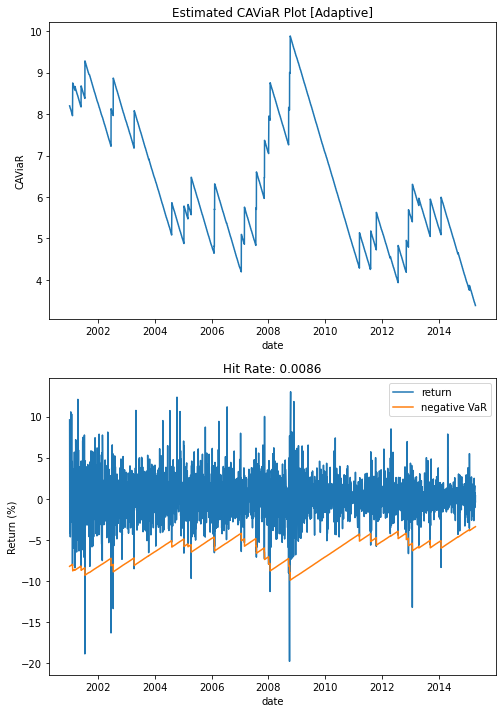

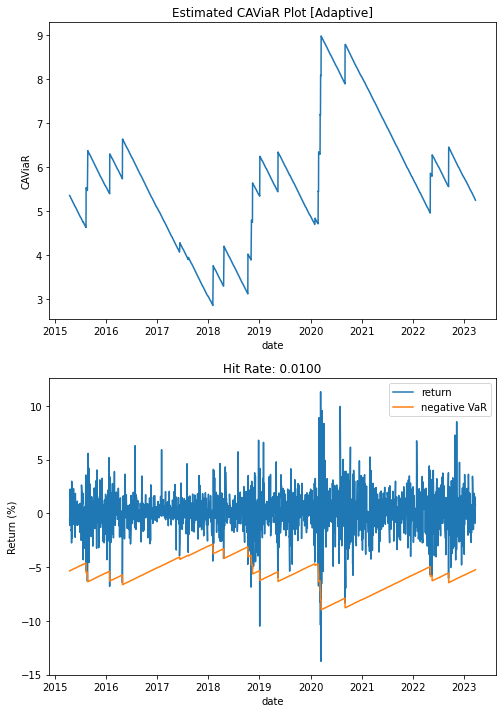

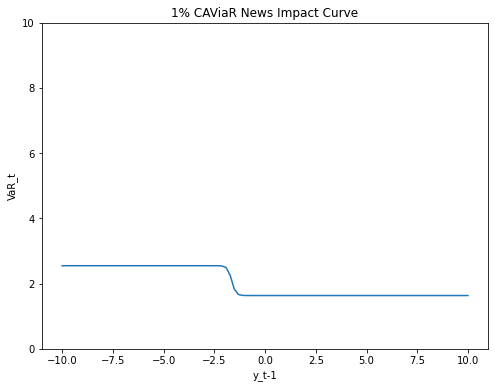

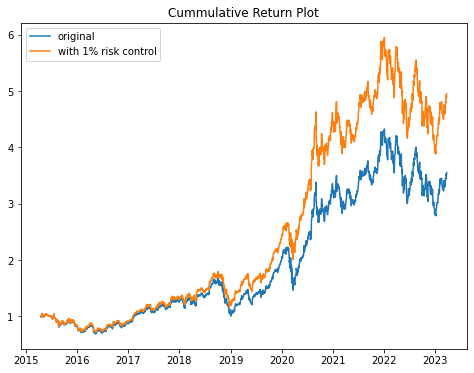

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.07293198526075521
Update 1: 0.06053008733773046
Update 2: 0.06053008733773046
when m = 2
Update 0: 0.07305858059815606
Update 1: 0.06053008731039915
Update 2: 0.06053008731039915
when m = 3
Update 0: 0.07329985164663365
Update 1: 0.060530087327073455
Update 2: 0.060530087327073455
Final loss: 0.06053008731039915
Time taken(s): 10.83
adaptive numeric 0.01 COKE


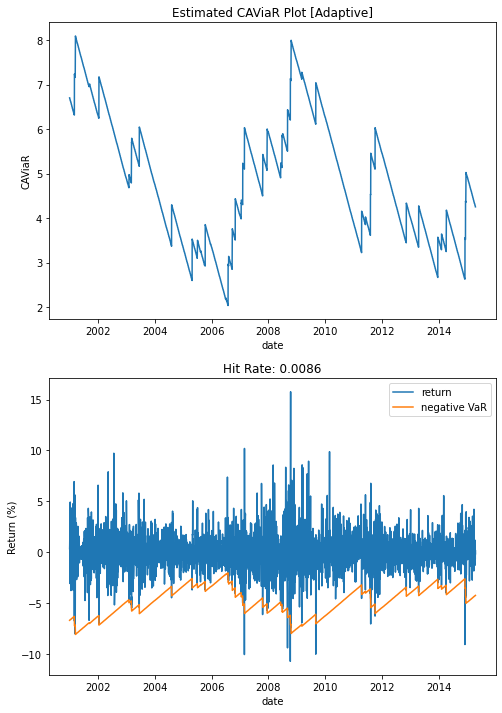

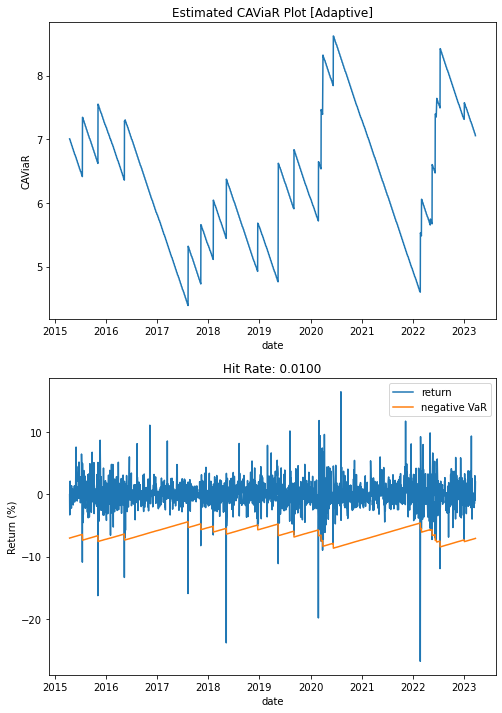

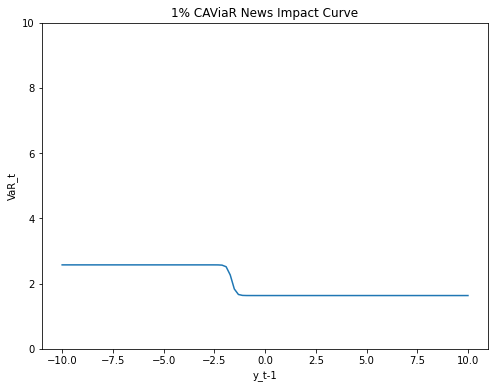

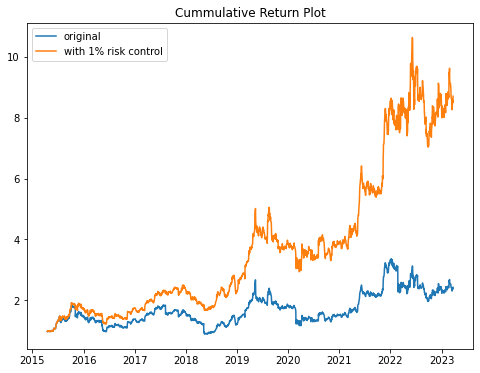

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.10993238943076832
Update 1: 0.10992873996811735
Update 2: 0.10992873996627148
when m = 2
Update 0: 0.10993413525265731
Update 1: 0.081944297815337
Update 2: 0.081944297815337
when m = 3
Update 0: 0.10993533053024697
Update 1: 0.10993926332370361
Final loss: 0.081944297815337
Time taken(s): 13.52
adaptive numeric 0.01 JPM


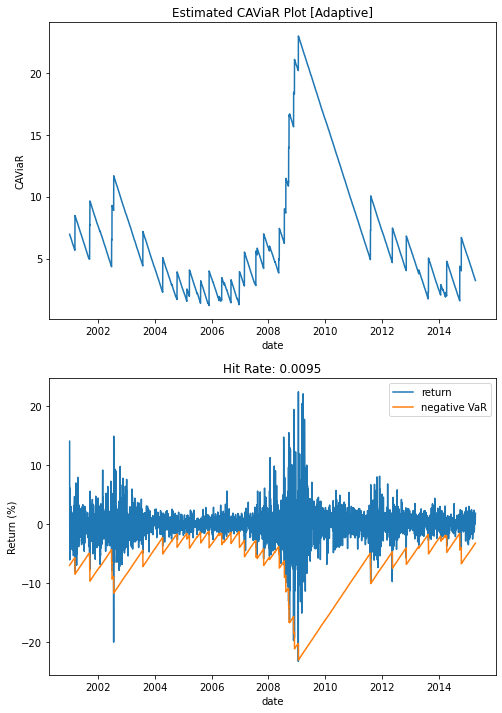

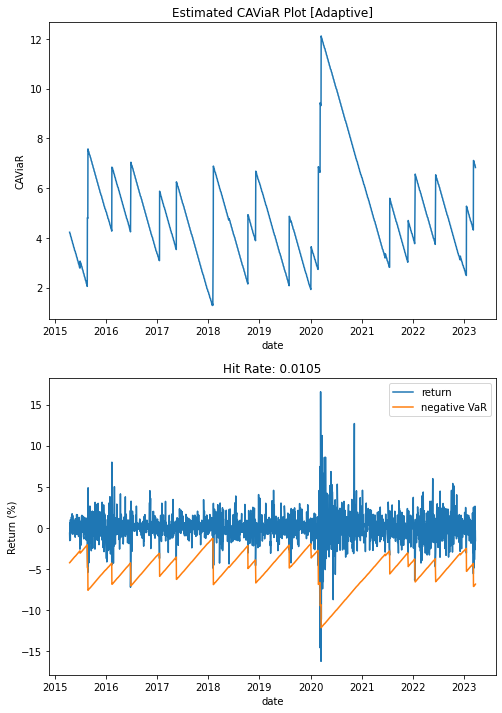

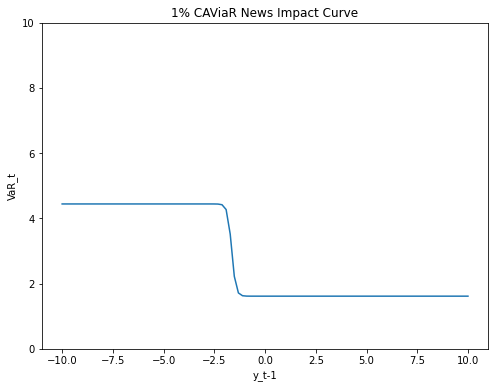

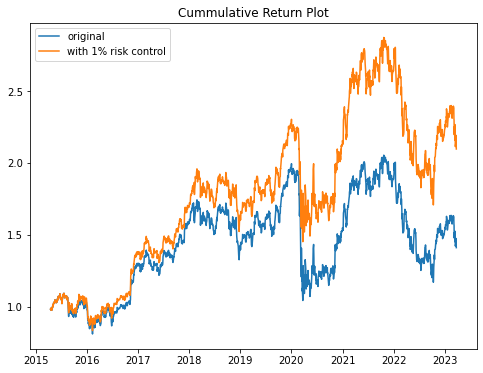

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.0741147660504098
Update 1: 39.92304379496945
when m = 2
Update 0: 0.07526966788938137
Update 1: 0.06996400256920657
Update 2: 0.06996400256920657
when m = 3
Update 0: 0.07528915072478749
Update 1: 0.06996400242746534
Update 2: 0.06996400242746534
Final loss: 0.06996400242746534
Time taken(s): 12.05
adaptive numeric 0.01 MSFT


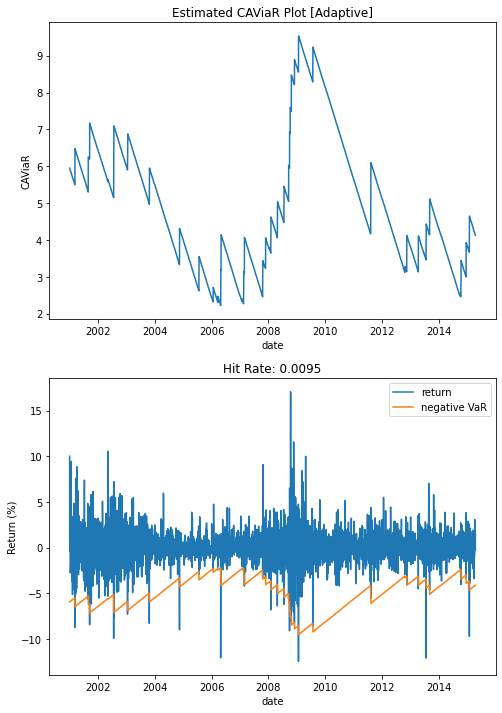

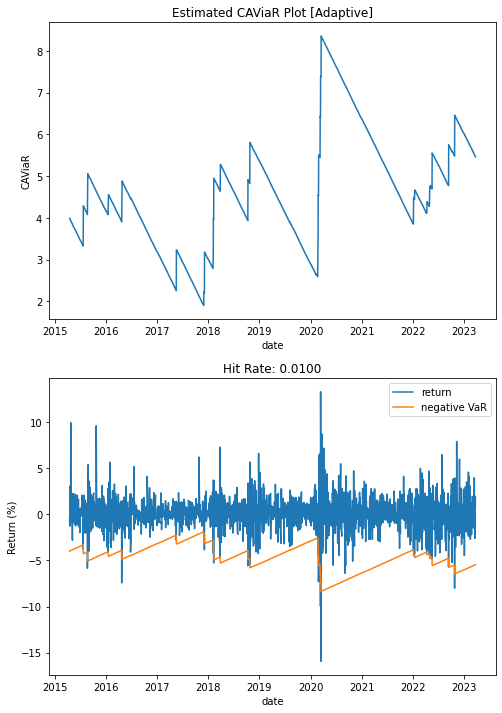

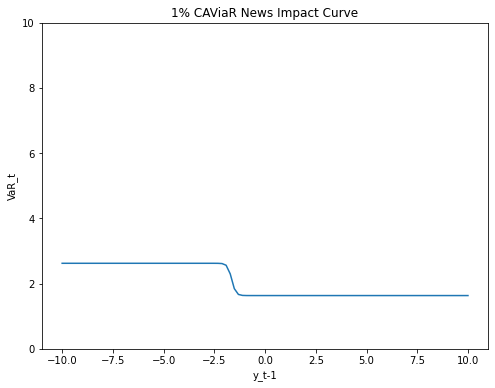

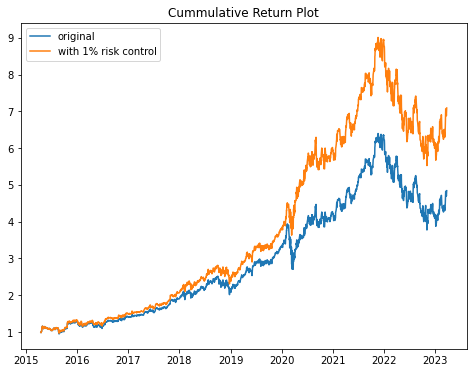

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.061955428064654136
Update 1: 0.056433694173118755
Update 2: 0.056433694173118755
when m = 2
Update 0: 0.06195646966939763
Update 1: 0.05624824336863566
Update 2: 0.05624824336863566
when m = 3
Update 0: 0.061965326538705776
Update 1: 0.0553412812765038
Update 2: 0.0553412812765038
Final loss: 0.0553412812765038
Time taken(s): 12.88
adaptive numeric 0.01 XOM


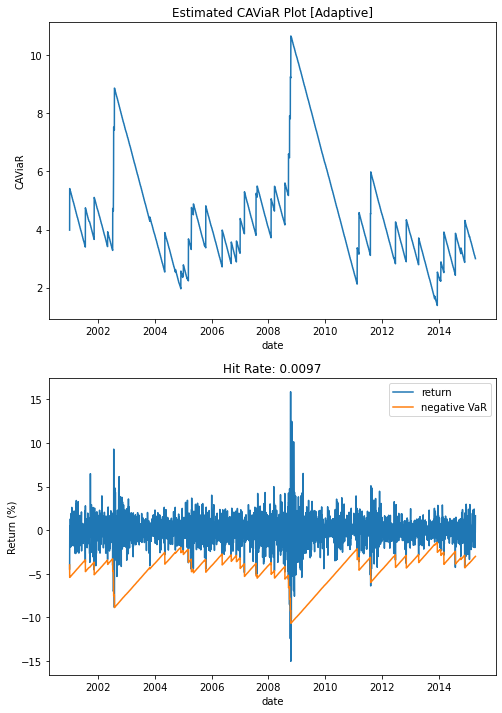

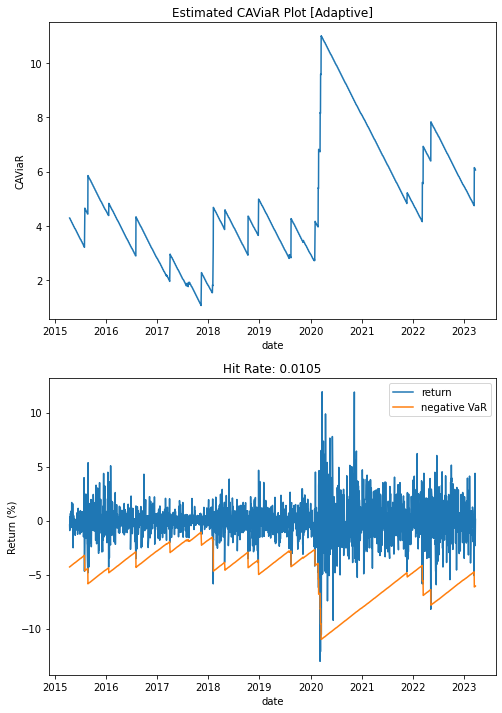

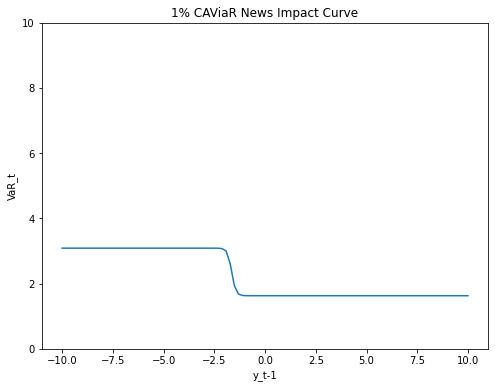

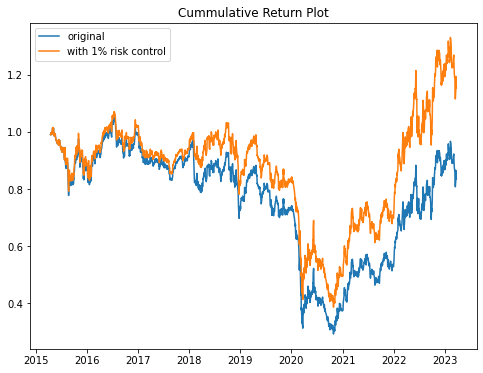

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...


D:\CAViaR-Project\caviar\_caviar_function.py:32: RuntimeWarning: overflow encountered in exp
  1 / (1 + np.exp(G * (returns[t - 1] - VaR[t - 1]))) - quantile


Optimizing...
when m = 1
Update 0: 0.3239812184469028
Update 1: 0.2599015663165375
Update 2: 0.2599015662678347
when m = 2
Update 0: 0.32641763430075554
Update 1: 0.25990156626510597
Update 2: 0.25990156626500405
when m = 3
Update 0: 0.3293685304777728
Update 1: 0.259901566279302
Update 2: 0.25990156626571703
Final loss: 0.25990156626500405
Time taken(s): 14.87
adaptive numeric 0.05 AAPL


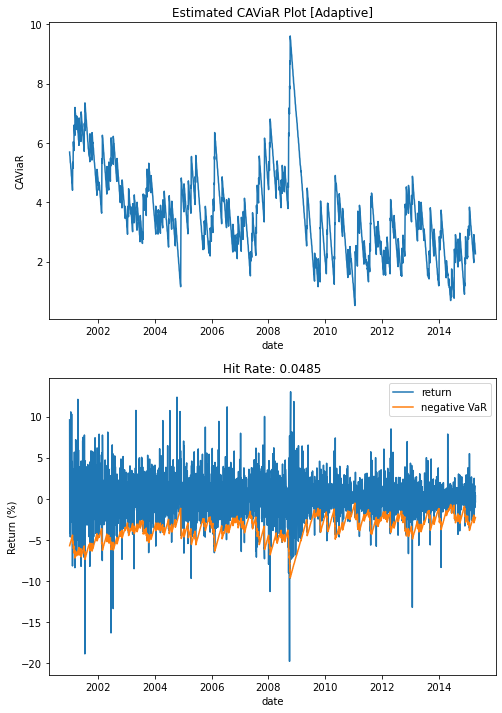

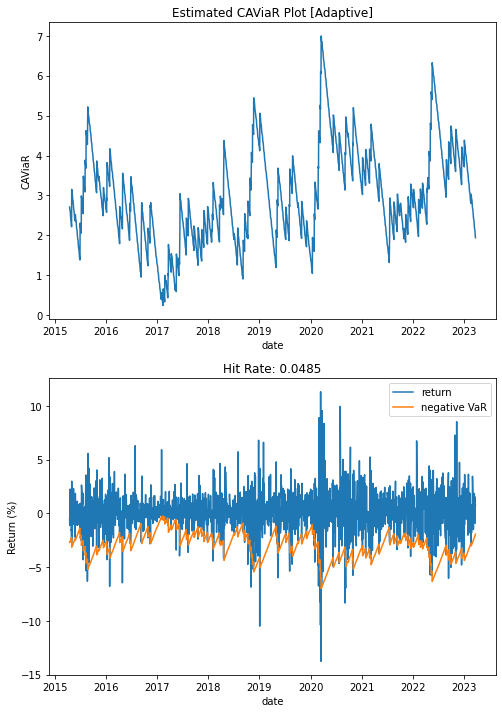

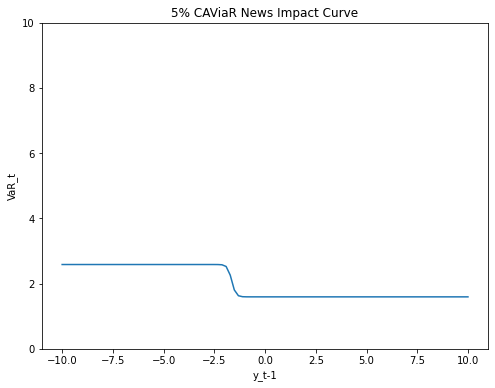

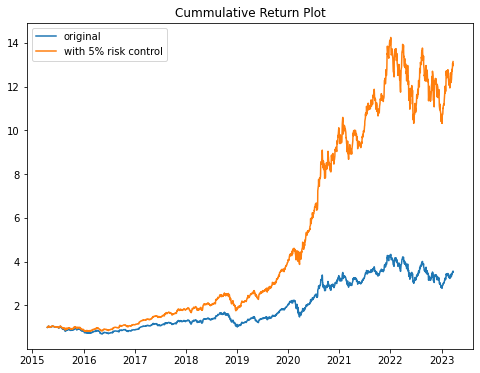

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.20284220494534094
Update 1: 0.19371131305946918
Update 2: 0.19371131305876307
when m = 2
Update 0: 0.20286442923487574
Update 1: 0.20286248147876507
Update 2: 0.20286248147876507
when m = 3
Update 0: 0.202881270086375
Update 1: 0.20280479031049983
Update 2: 0.2028047903018648
Final loss: 0.19371131305876307
Time taken(s): 14.83
adaptive numeric 0.05 COKE


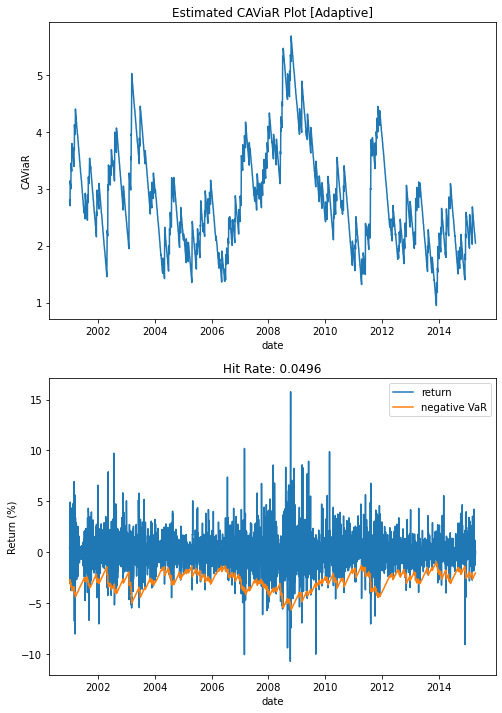

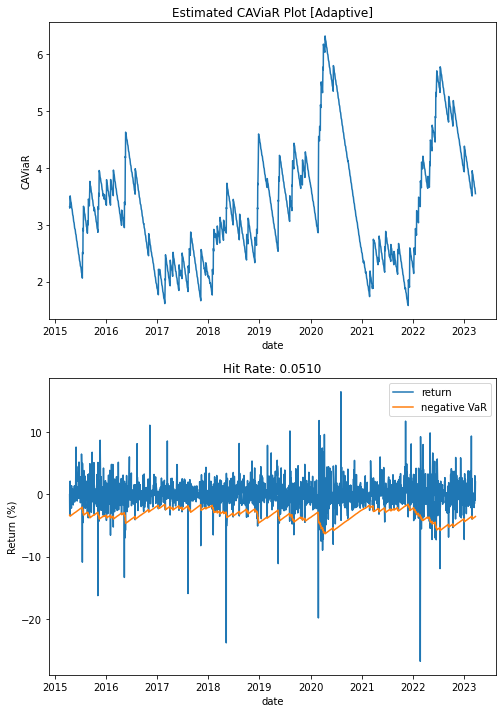

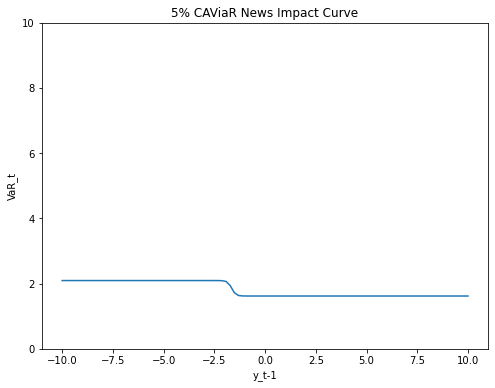

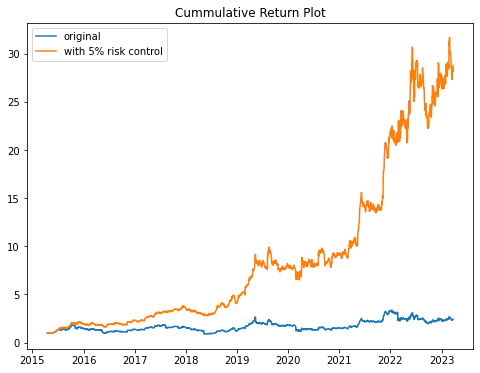

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.32691160058541563
Update 1: 0.24644206968552643
Update 2: 0.24644206968541033
when m = 2
Update 0: 0.3274883856854231
Update 1: 0.24643874431910523
Update 2: 0.24643874431793178
when m = 3
Update 0: 0.3276153110154502
Update 1: 0.24643874431907448
Update 2: 0.24643874431810558
Final loss: 0.24643874431793178
Time taken(s): 14.82
adaptive numeric 0.05 JPM


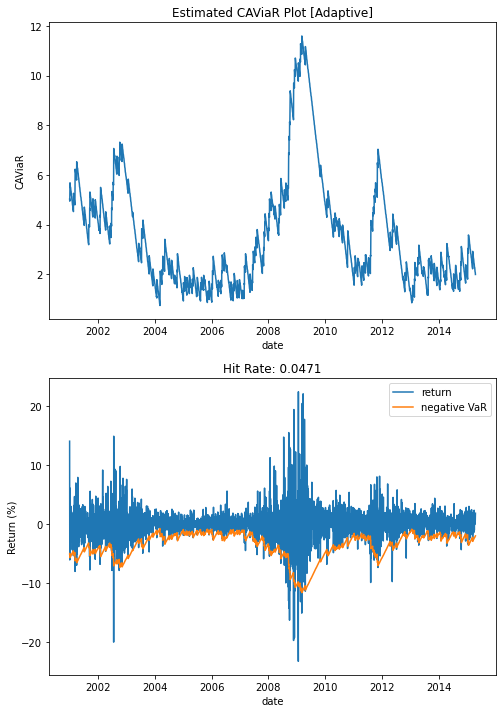

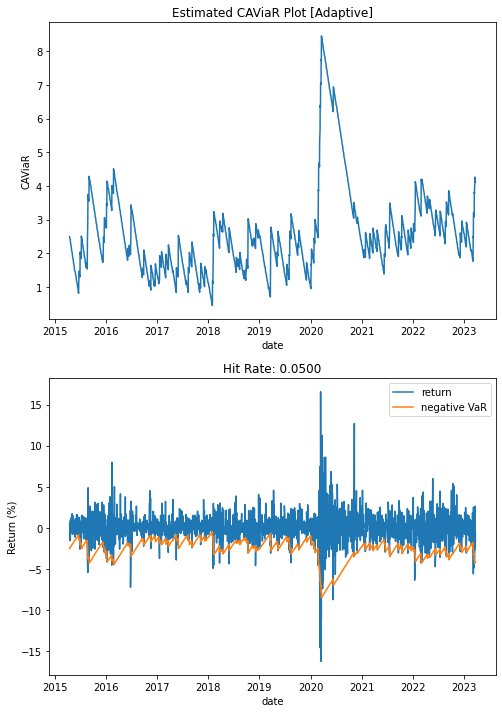

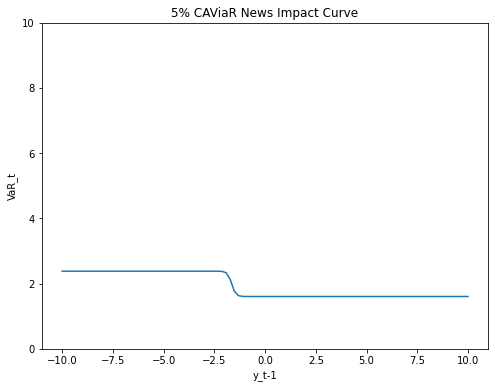

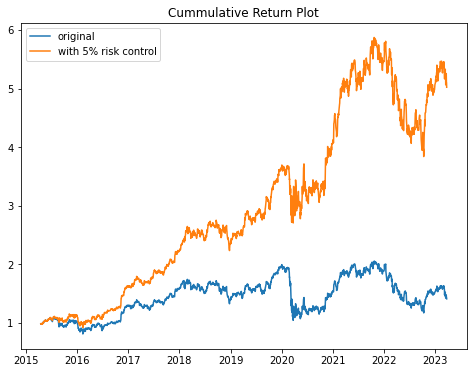

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...


D:\CAViaR-Project\caviar\_caviar_function.py:32: RuntimeWarning: overflow encountered in exp
  1 / (1 + np.exp(G * (returns[t - 1] - VaR[t - 1]))) - quantile


Optimizing...
when m = 1
Update 0: 0.2502940917286384
Update 1: 0.19287522915682861
Update 2: 0.19287522915682861
when m = 2
Update 0: 0.25086855754250054
Update 1: 0.1928752287571245
Update 2: 0.1928752287571245
when m = 3
Update 0: 0.25376431278165484
Update 1: 0.19287522876428193
Update 2: 0.19287522876428193
Final loss: 0.1928752287571245
Time taken(s): 13.85
adaptive numeric 0.05 MSFT


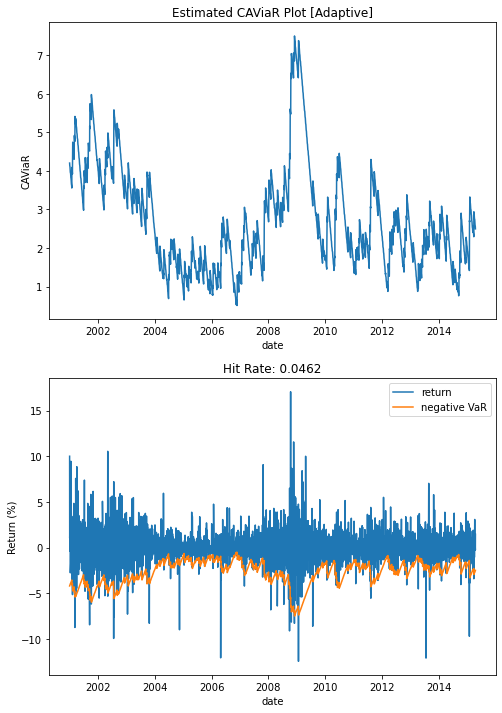

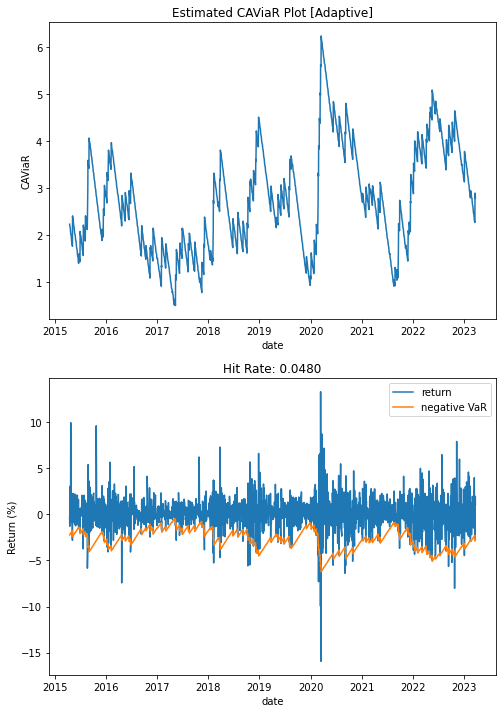

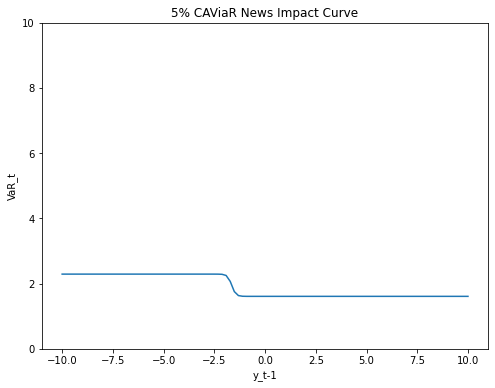

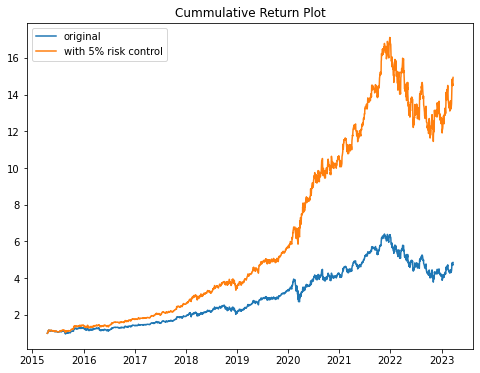

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.18554812241991767
Update 1: 0.1704575396156787
Update 2: 0.1704575396156787
when m = 2
Update 0: 0.1855870597692899
Update 1: 0.17045753961575014
Update 2: 0.17045753961575014
when m = 3
Update 0: 0.18560038744707008
Update 1: 0.17045753961576035
Update 2: 0.17045753961576035
Final loss: 0.1704575396156787
Time taken(s): 11.76
adaptive numeric 0.05 XOM


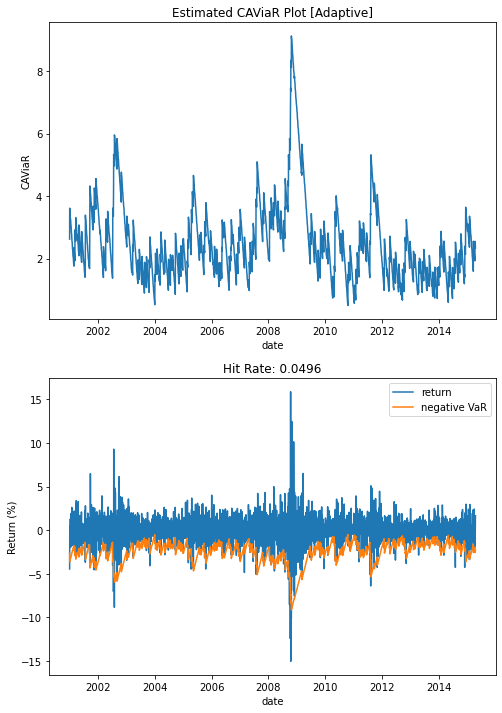

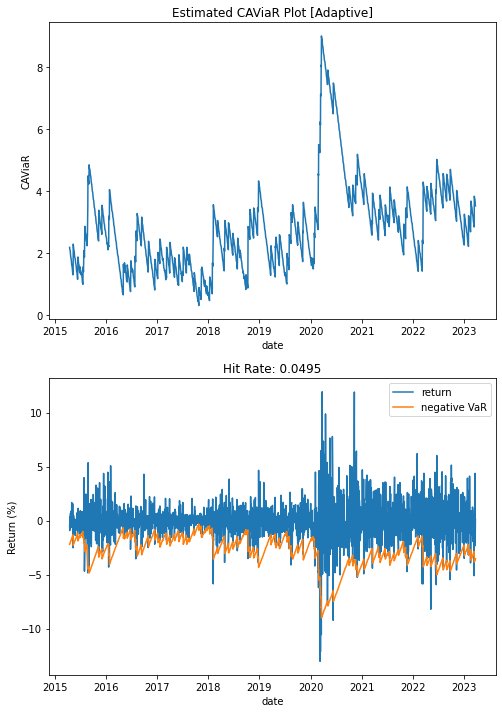

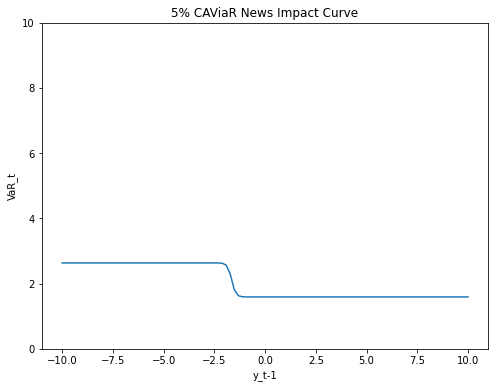

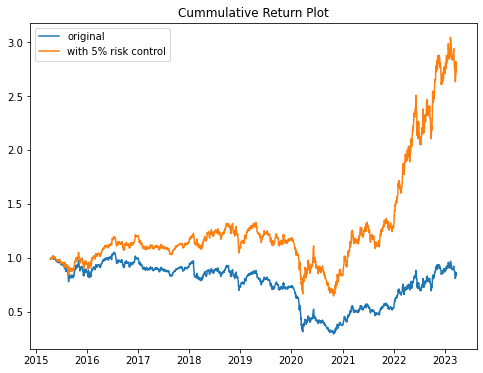

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -5247.938390306564
        x: [ 8.528e-02 -9.142e-01]
      nit: 12
      jac: [-9.422e-02  8.185e-04]
     nfev: 72
     njev: 24
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.08530532908273641
Time taken(s): 1.19
adaptive mle 0.01 AAPL


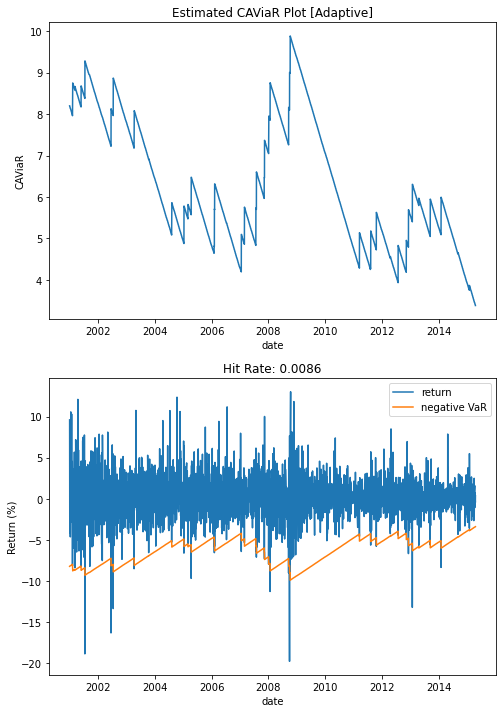

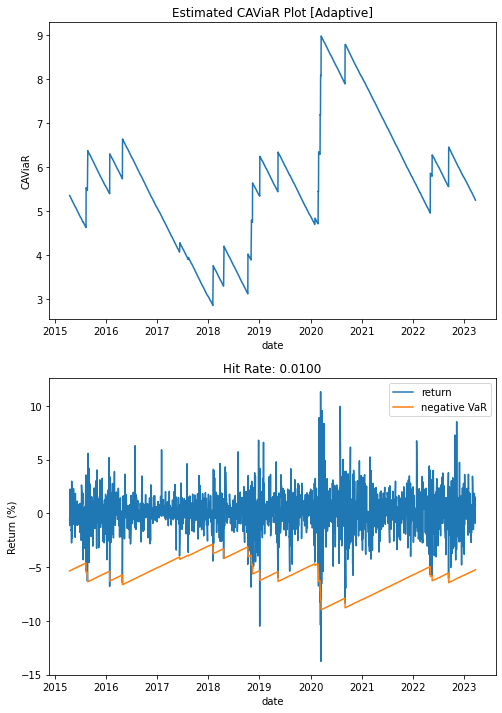

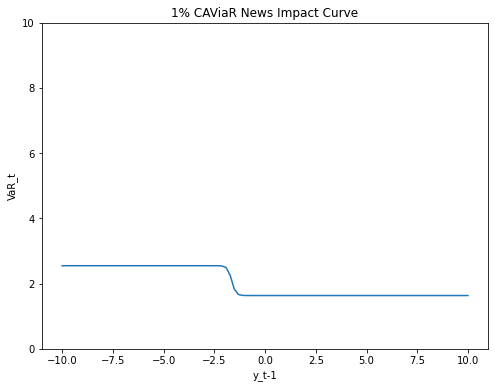

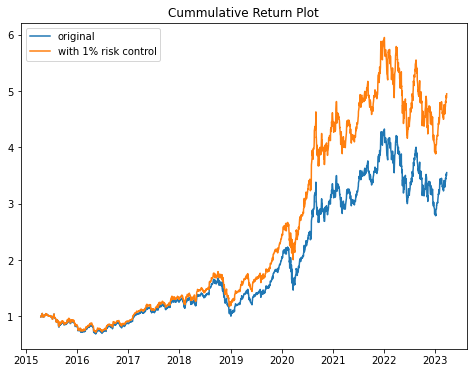

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -6478.730386464814
        x: [ 6.053e-02 -9.405e-01]
      nit: 8
      jac: [ 9.732e-03  8.458e-03]
     nfev: 48
     njev: 16
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.0605300873102307
Time taken(s): 0.92
adaptive mle 0.01 COKE


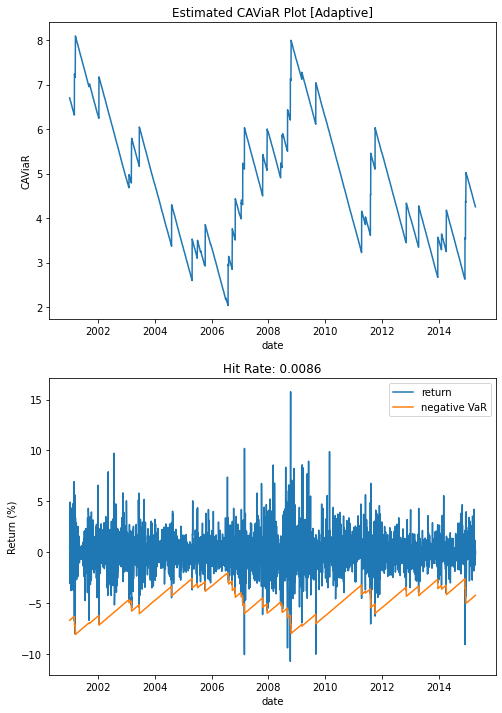

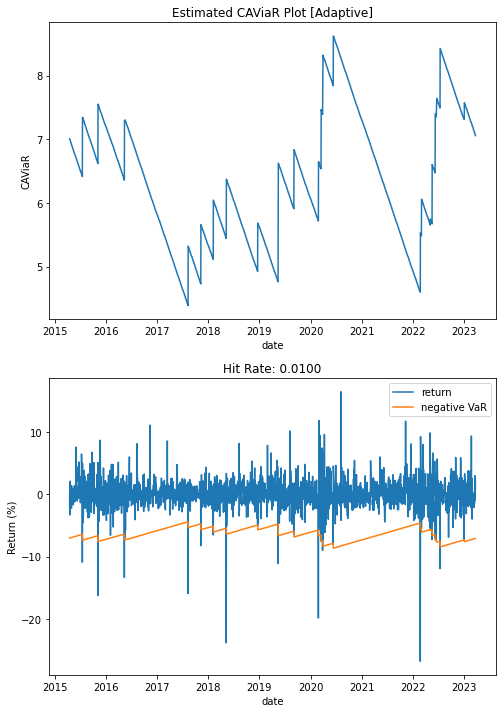

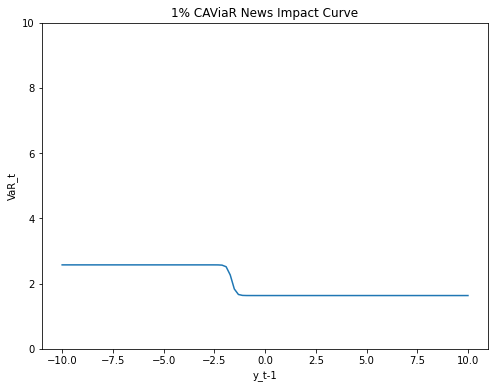

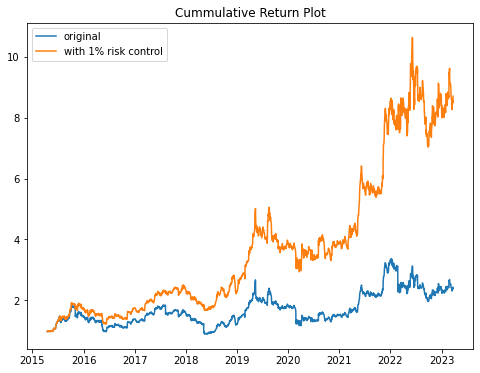

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -5032.146568812362
        x: [ 9.056e-02 -1.000e+00]
      nit: 24
      jac: [-3.911e-03  7.292e+02]
     nfev: 114
     njev: 38
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.09059600433261546
Time taken(s): 2.03
adaptive mle 0.01 JPM


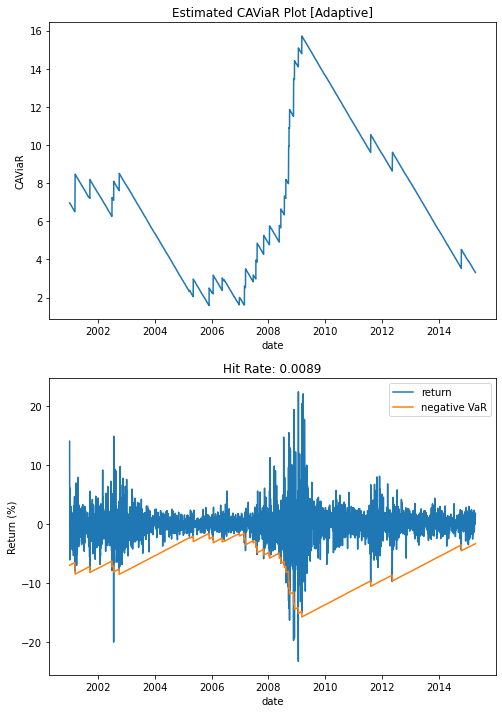

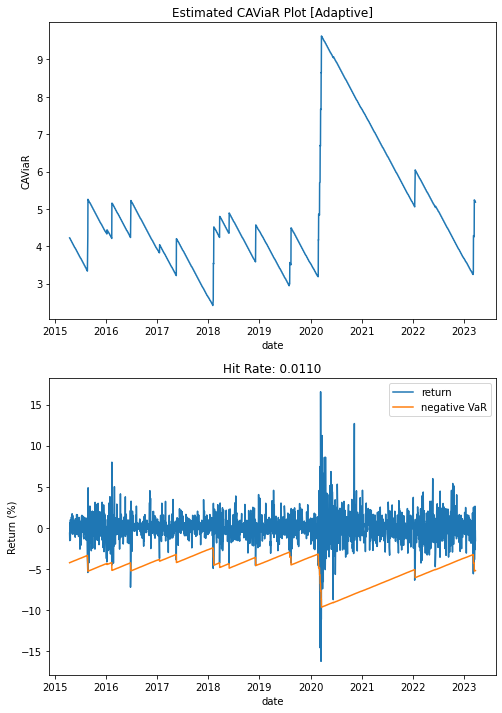

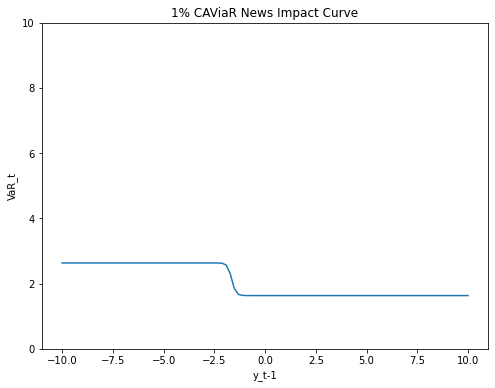

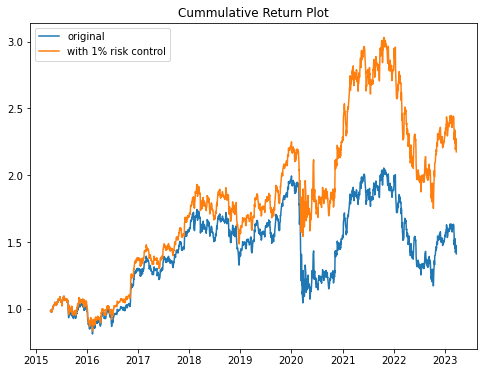

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -5959.870192245879
        x: [ 6.994e-02 -9.896e-01]
      nit: 12
      jac: [-3.010e-02  1.455e-03]
     nfev: 75
     njev: 25
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.0699640024272831
Time taken(s): 1.47
adaptive mle 0.01 MSFT


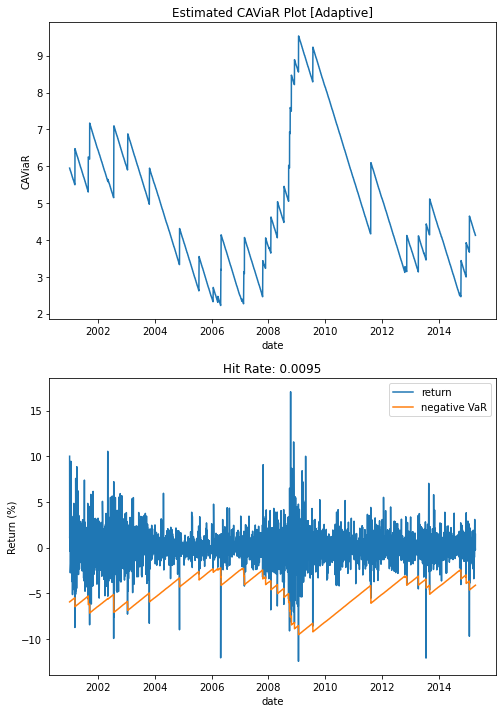

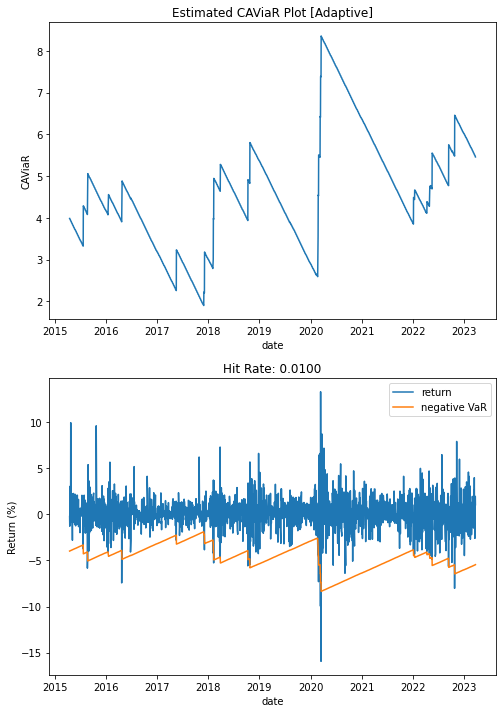

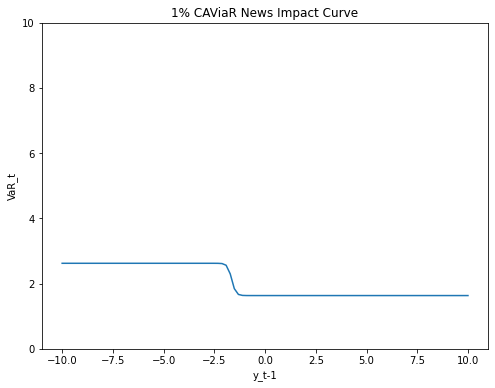

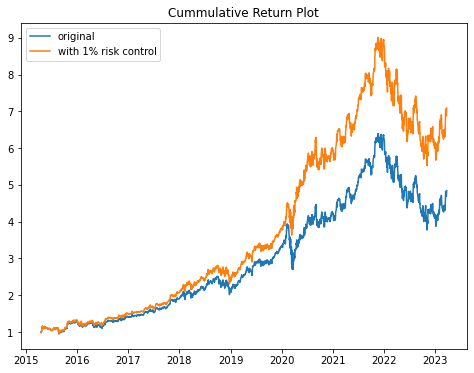

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -6643.477734928361
        x: [ 5.781e-02 -1.000e+00]
      nit: 9
      jac: [ 1.455e-02  2.370e+01]
     nfev: 69
     njev: 23
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.05792437148286364
Time taken(s): 1.26
adaptive mle 0.01 XOM


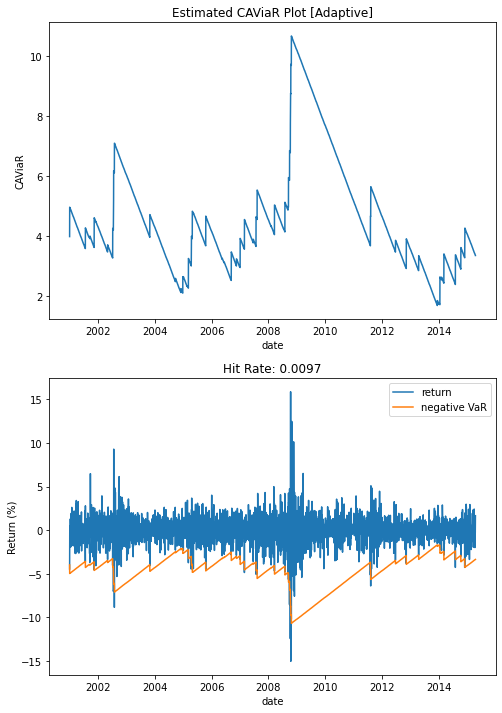

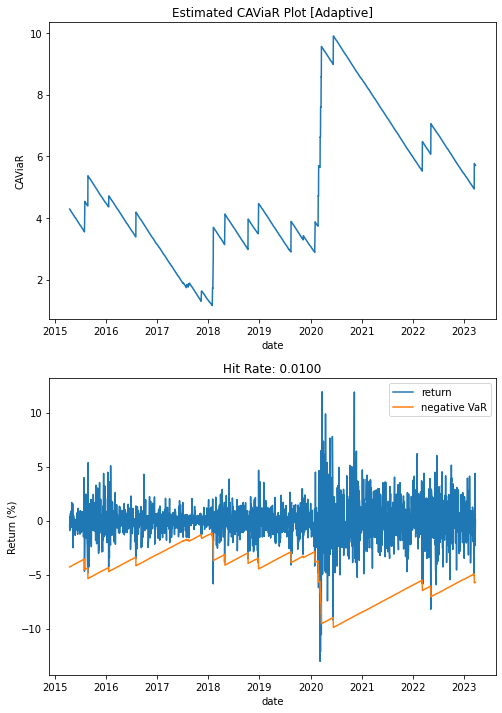

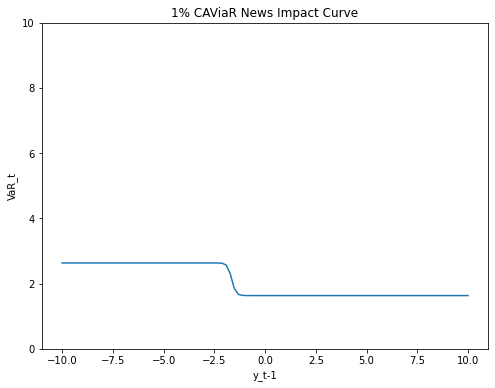

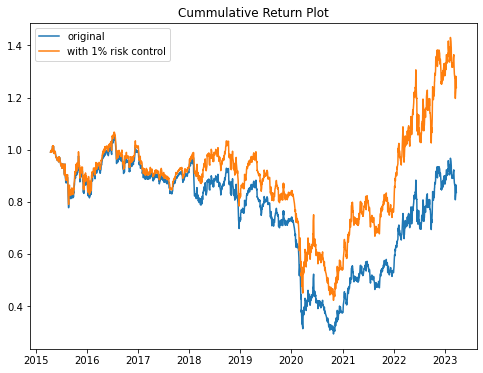

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -1252.1578904781409
        x: [ 2.596e-01 -6.269e-01]
      nit: 14
      jac: [ 2.303e-02  2.505e+00]
     nfev: 147
     njev: 49
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.25969476000422315
Time taken(s): 2.49
adaptive mle 0.05 AAPL


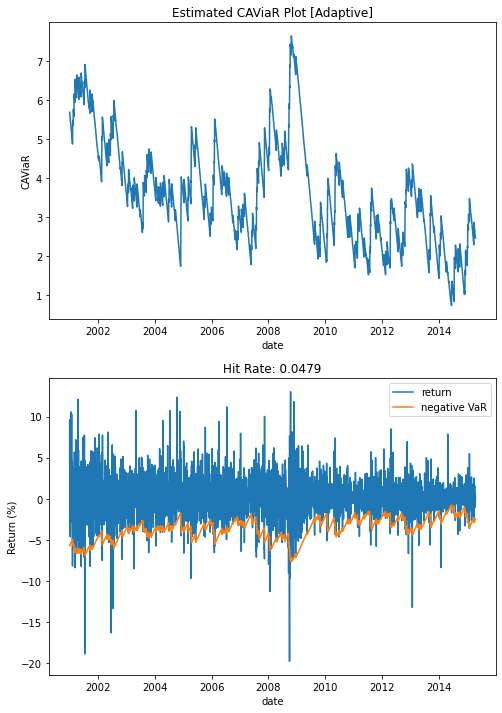

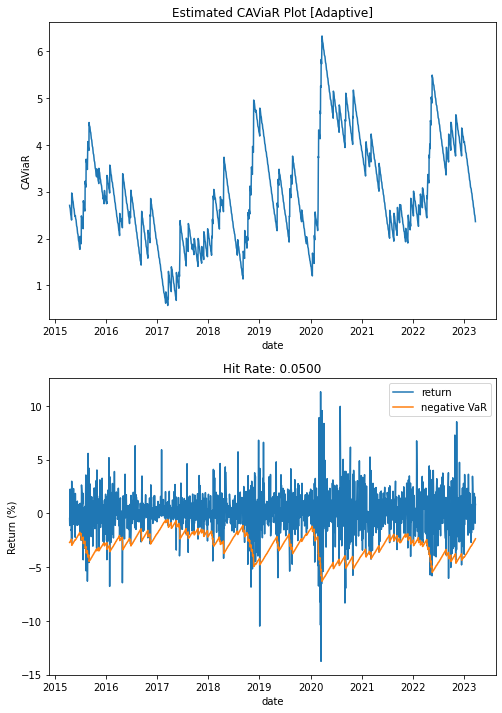

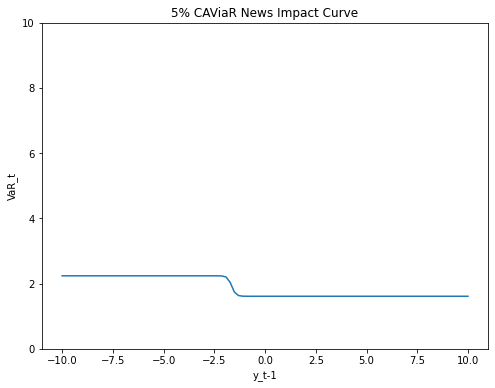

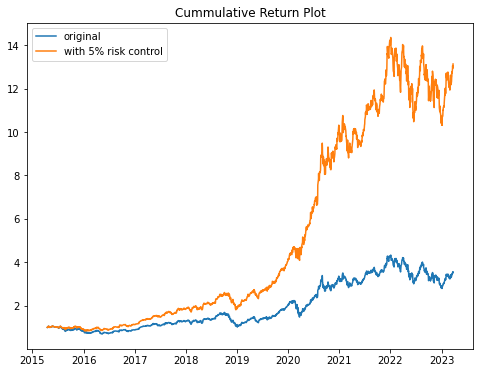

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -2302.3866891877415
        x: [ 1.937e-01 -4.741e-01]
      nit: 14
      jac: [ 2.702e+00 -3.432e+00]
     nfev: 135
     njev: 45
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.19371131324543372
Time taken(s): 2.51
adaptive mle 0.05 COKE


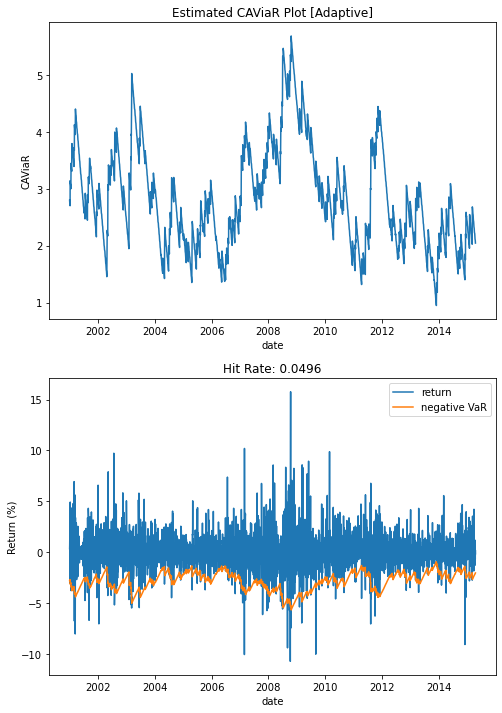

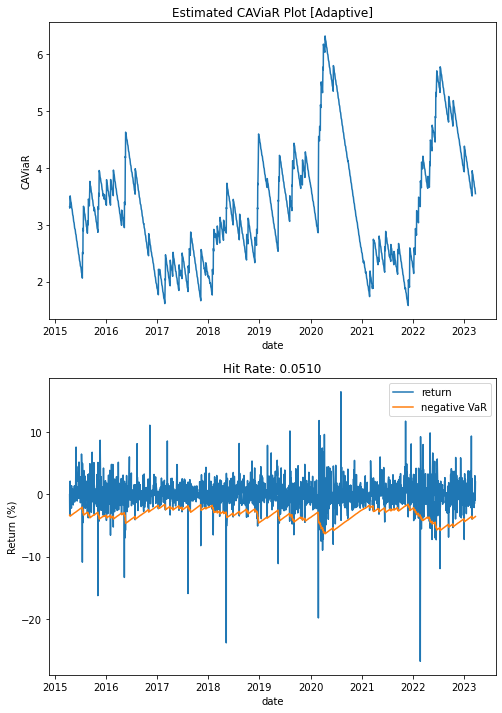

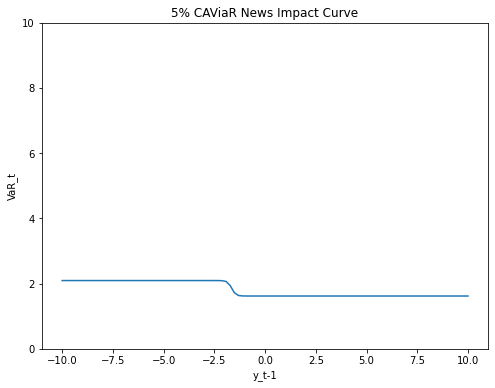

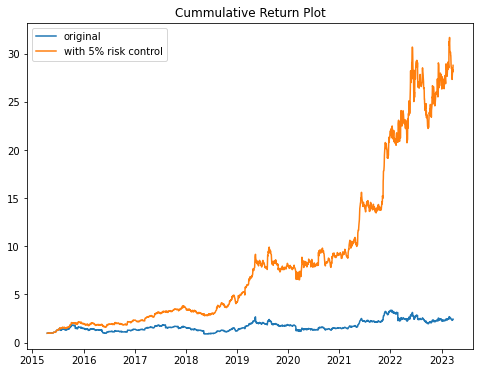

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -1441.1709847550314
        x: [ 2.463e-01 -7.764e-01]
      nit: 15
      jac: [ 6.422e-01 -1.478e+00]
     nfev: 174
     njev: 58
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.24643874431849166
Time taken(s): 3.00
adaptive mle 0.05 JPM


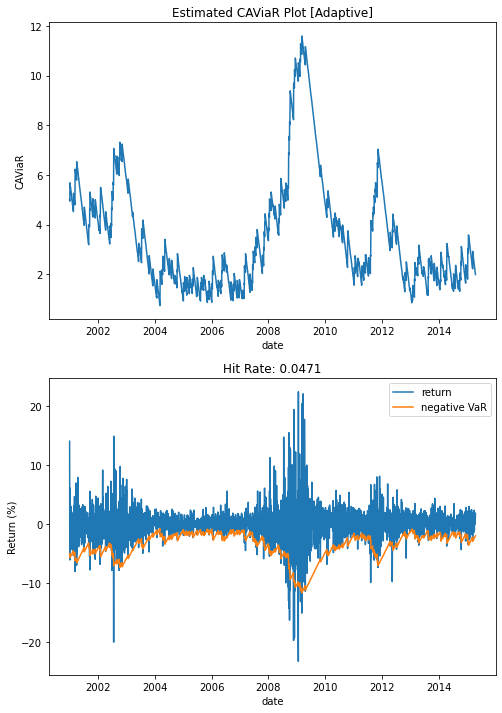

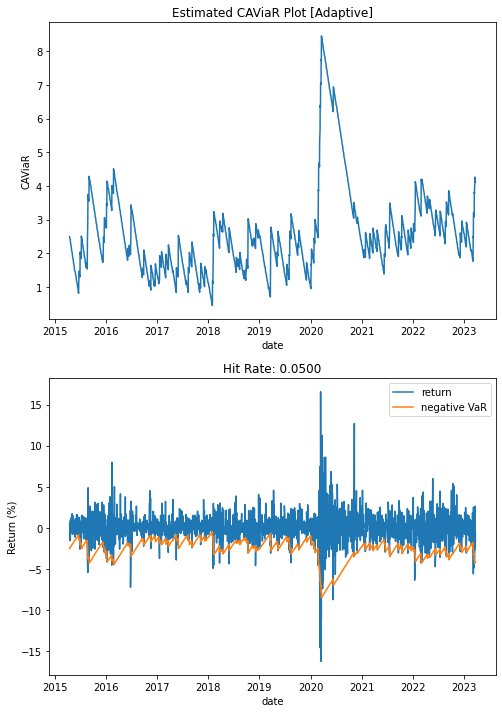

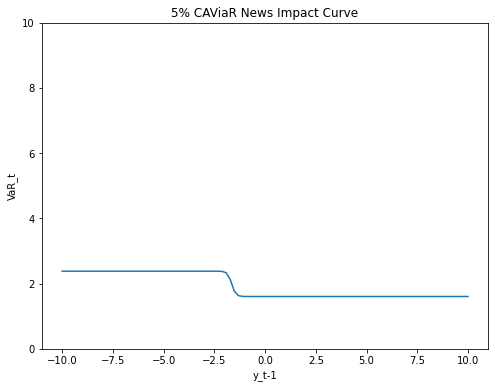

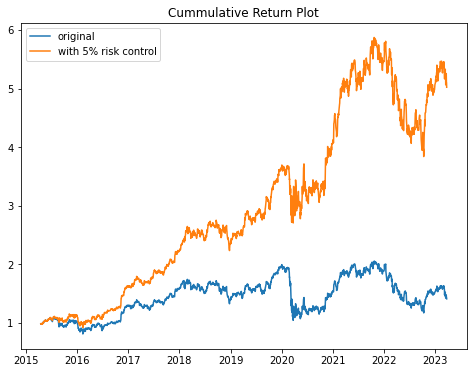

-------------------------------------------------------------------


D:\CAViaR-Project\caviar\_caviar_function.py:32: RuntimeWarning: overflow encountered in exp
  1 / (1 + np.exp(G * (returns[t - 1] - VaR[t - 1]))) - quantile


Fail to converge after 5 times. Start with new param again.
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -2320.7888934450216
        x: [ 1.927e-01 -6.818e-01]
      nit: 11
      jac: [-4.025e-02  7.776e-03]
     nfev: 96
     njev: 32
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.1928752287580638
Time taken(s): 24.18
adaptive mle 0.05 MSFT


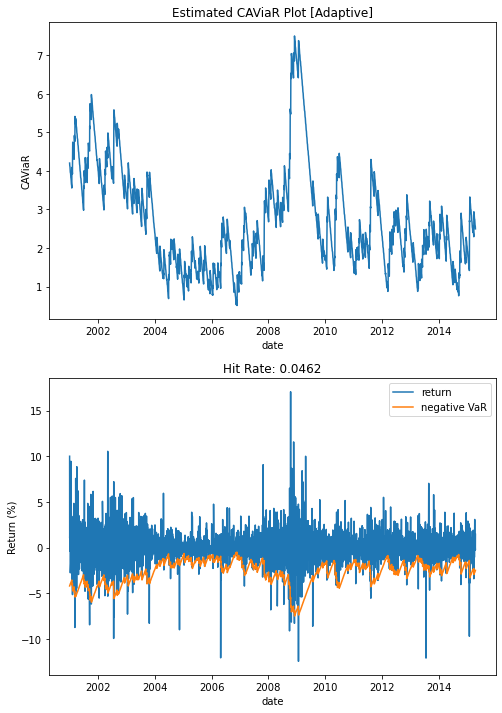

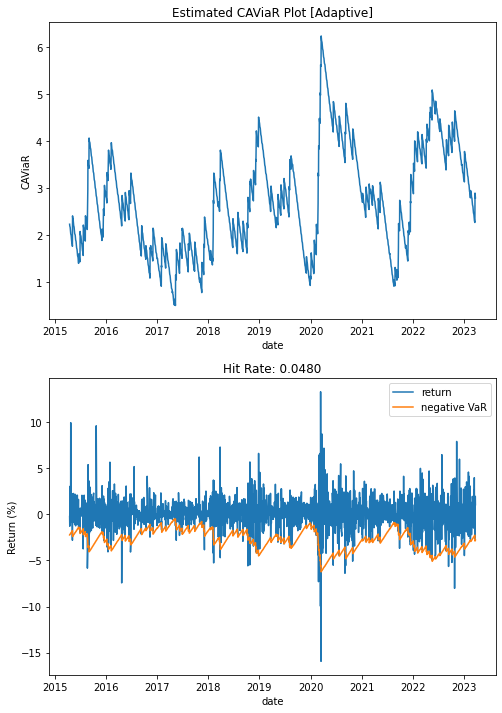

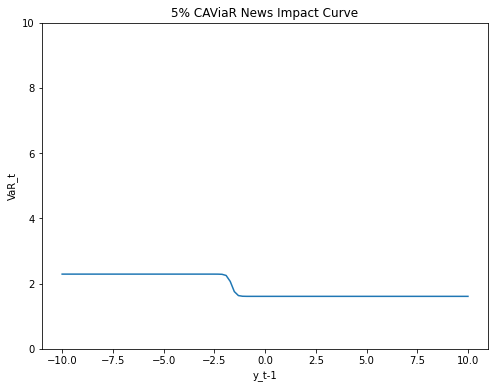

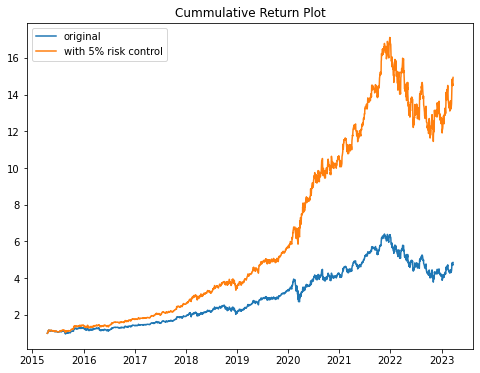

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -2795.930555146
        x: [ 1.688e-01 -4.595e-01]
      nit: 14
      jac: [-2.038e-01  1.592e-03]
     nfev: 72
     njev: 24
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.16927350531849814
Time taken(s): 1.21
adaptive mle 0.05 XOM


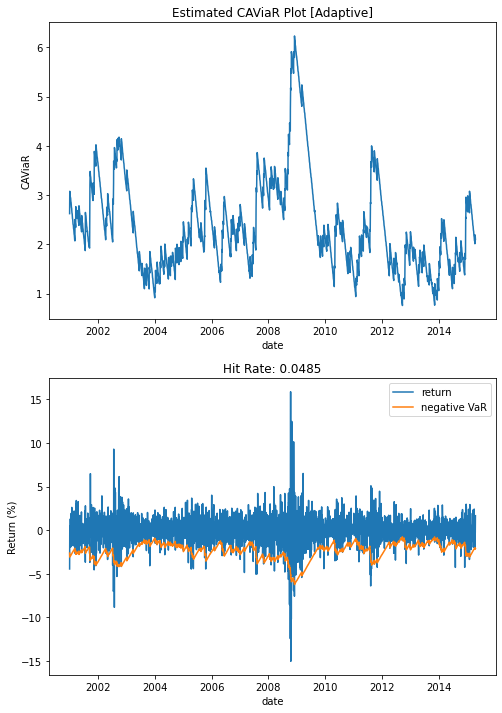

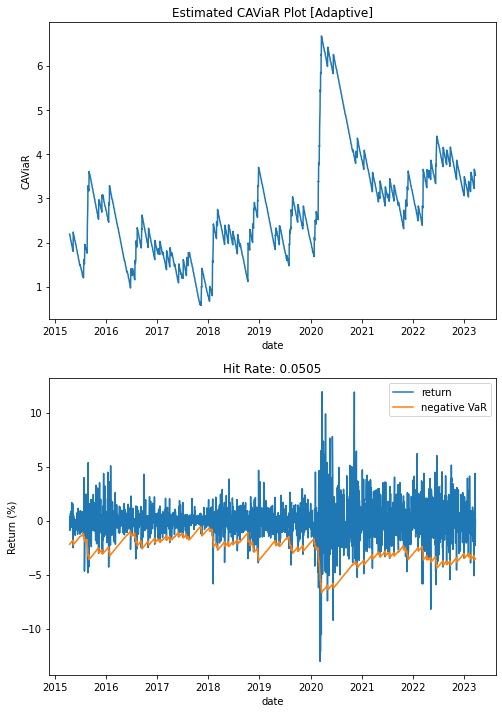

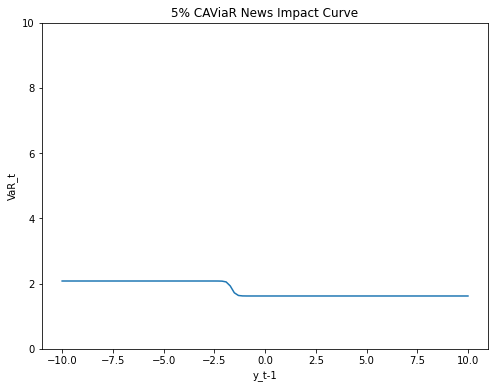

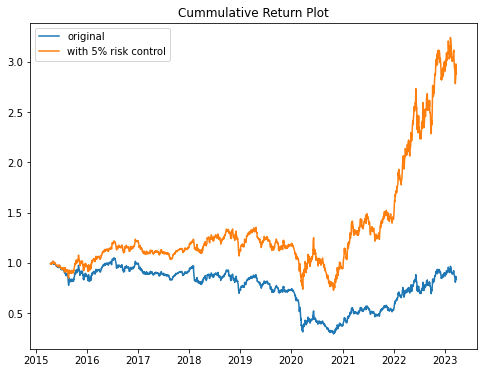

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.10443245500010365
Update 1: 0.0799118026850535
Update 2: 0.07991180268257983
when m = 2
Update 0: 0.15594415640984416
Update 1: 0.07991495045732029
Update 2: 0.0799148815352243
Update 3: 0.0799148815352243
when m = 3
Update 0: 0.20732877992202997
Update 1: 0.07991187590441172
Update 2: 0.07991187588837796
Final loss: 0.07991180268257983
Time taken(s): 15.07
asymmetric numeric 0.01 AAPL


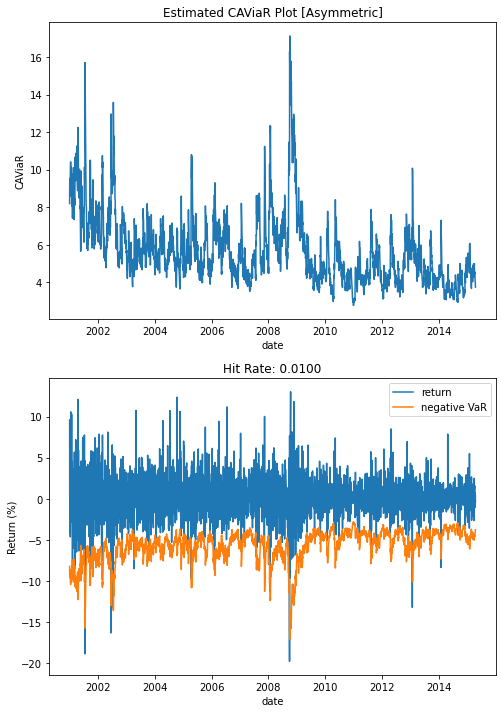

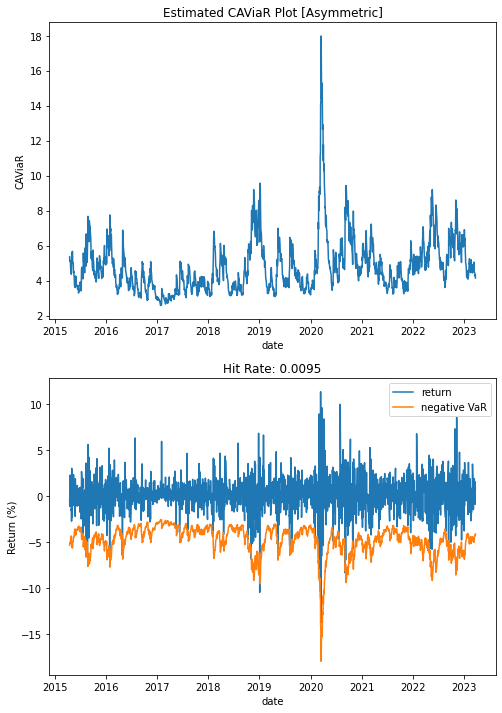

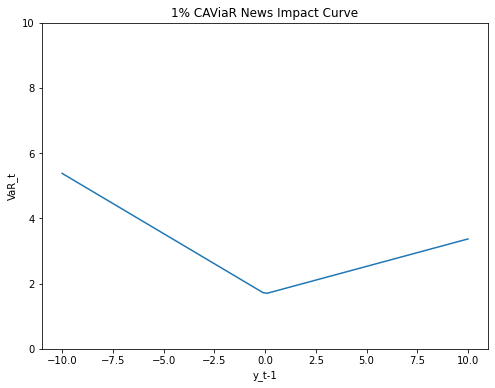

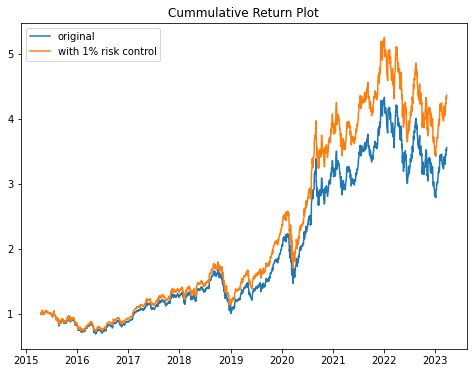

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.09969144685759256
Update 1: 0.05568819953523519
Update 2: 0.05568819288174168
Update 3: 0.05568819279947314
when m = 2
Update 0: 0.15520440522276074
Update 1: 0.05568699986018874
Update 2: 0.05568698765211756
Update 3: 0.0556869707187668
Update 4: 0.05568697071760878
when m = 3
Update 0: 0.17678579954442072
Update 1: 0.055797310500520884
Update 2: 0.05579731049067089
Final loss: 0.05568697071760878
Time taken(s): 15.38
asymmetric numeric 0.01 COKE


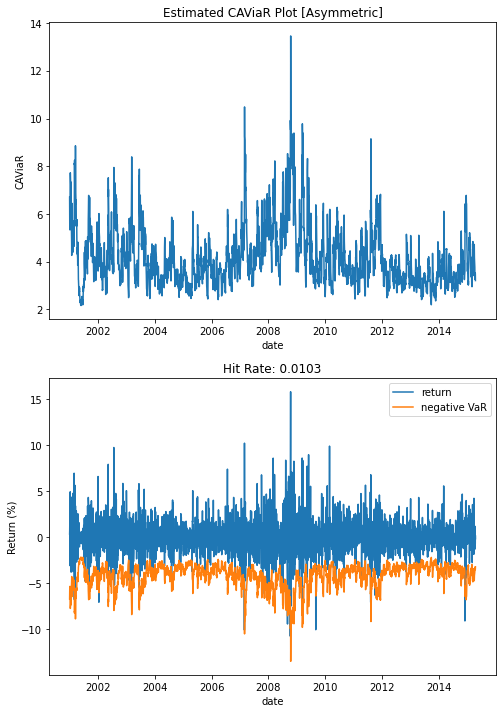

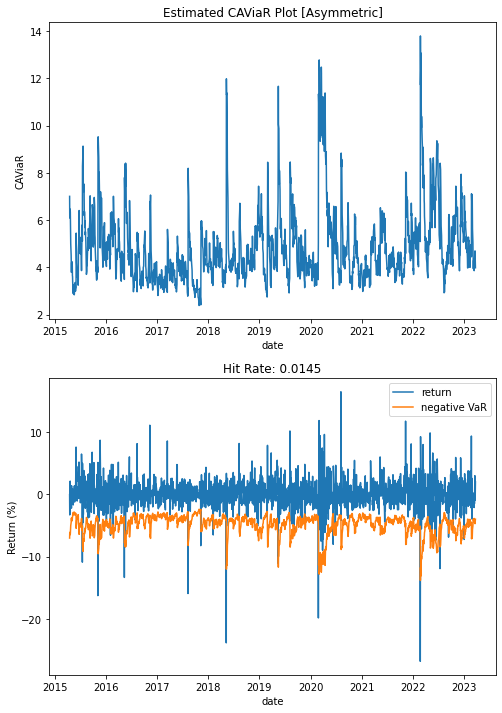

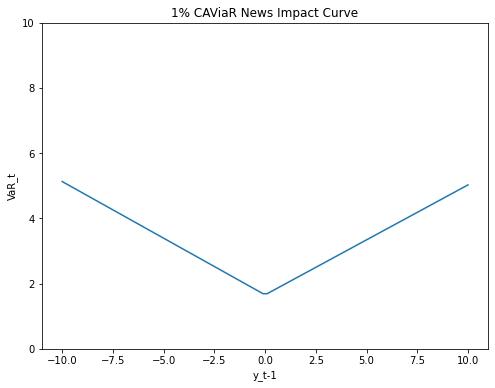

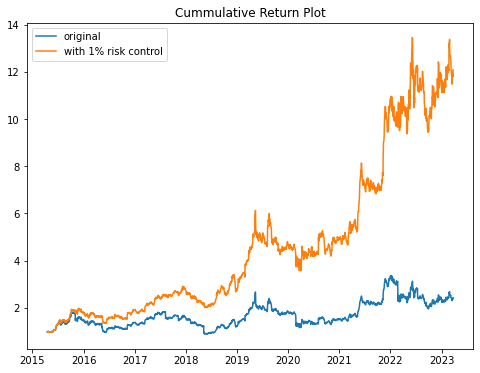

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.13855756454307375
Update 1: 0.06802387069208253
Update 2: 0.06802387055209846
Update 3: 0.06802387055209848
when m = 2
Update 0: 0.15264396298656457
Update 1: 0.06802121921697579
Update 2: 0.06802121921586779
when m = 3
Update 0: 0.1850385704563733
Update 1: 0.06821115513386855
Update 2: 0.06820640476236232
Update 3: 0.06820640476236237
Final loss: 0.06802121921586779
Time taken(s): 16.00
asymmetric numeric 0.01 JPM


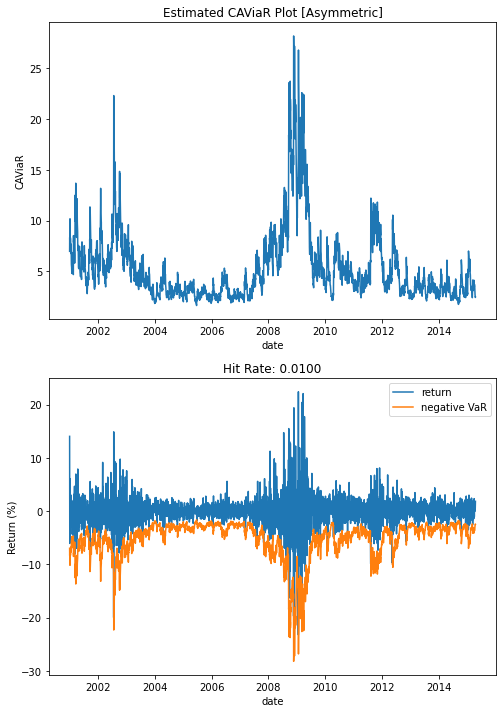

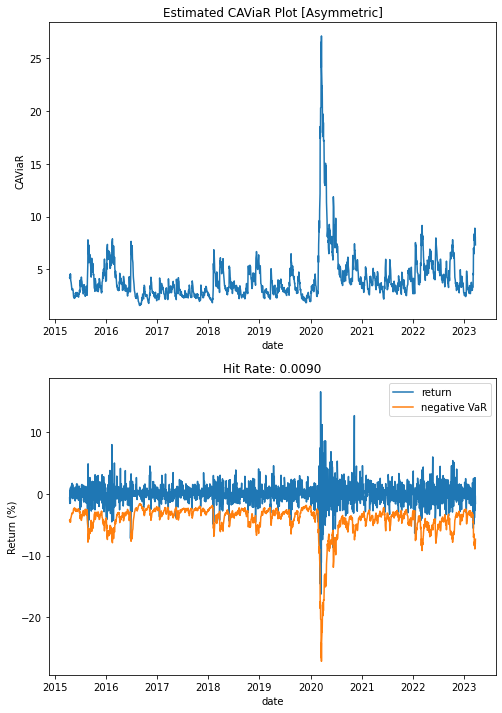

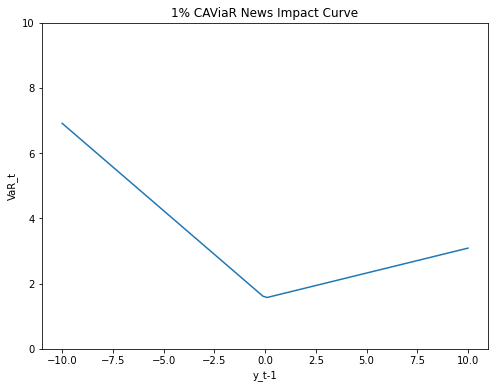

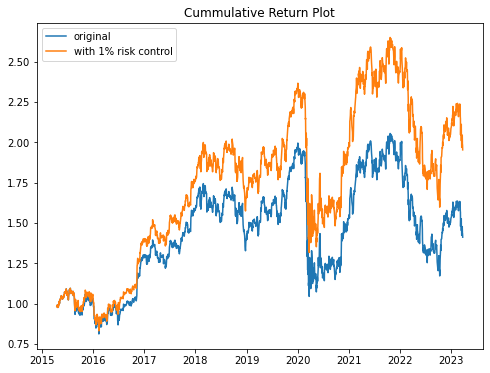

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.13180923688868973
Update 1: 0.0608994201583905
Update 2: 0.06089942015538967
when m = 2
Update 0: 0.33883641886183447
Update 1: 0.060909427763581096
Update 2: 0.0609034403203023
Update 3: 0.06090344031293505
when m = 3
Update 0: 0.38077024079175825
Update 1: 0.06089985421512829
Update 2: 0.0608998542074831
Final loss: 0.06089942015538967
Time taken(s): 16.26
asymmetric numeric 0.01 MSFT


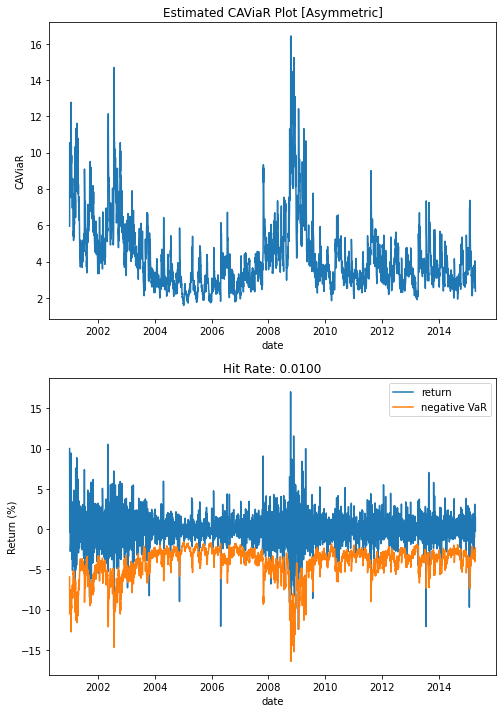

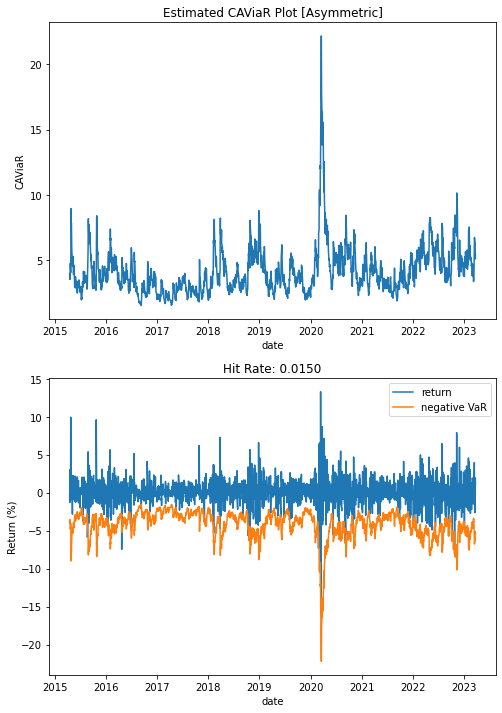

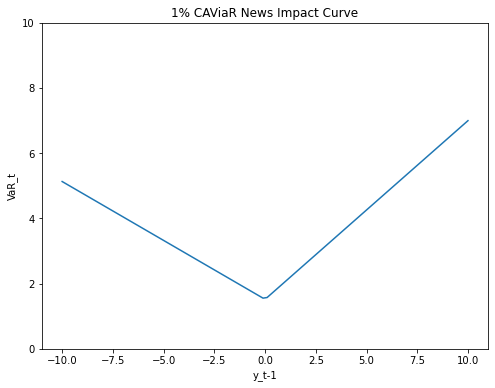

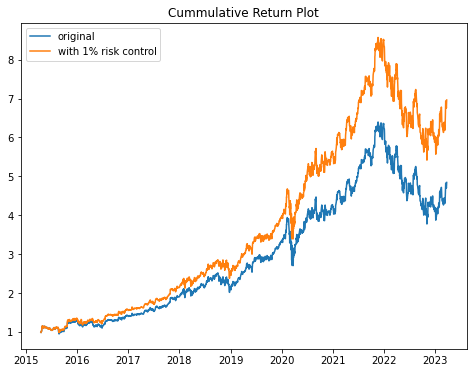

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.07159884497180412
Update 1: 0.046356378129891566
Update 2: 0.04635637626583939
Update 3: 0.04635637048706604
Update 4: 0.046356370482939814
when m = 2
Update 0: 0.0750601884381409
Update 1: 0.04636468702095128
Update 2: 0.04636468702095129
when m = 3
Update 0: 0.09018864068340118
Update 1: 0.04636260469447173
Update 2: 0.046362604664955516
Final loss: 0.046356370482939814
Time taken(s): 15.65
asymmetric numeric 0.01 XOM


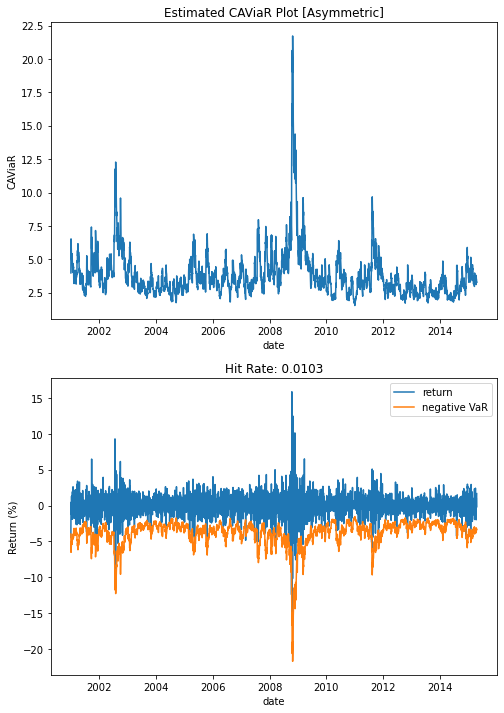

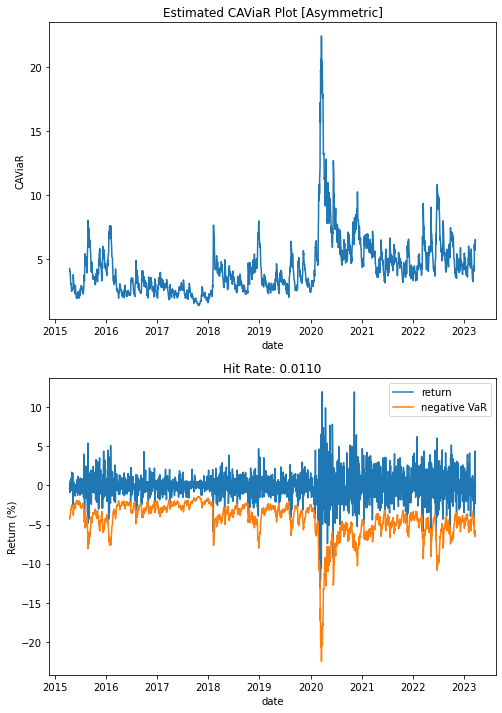

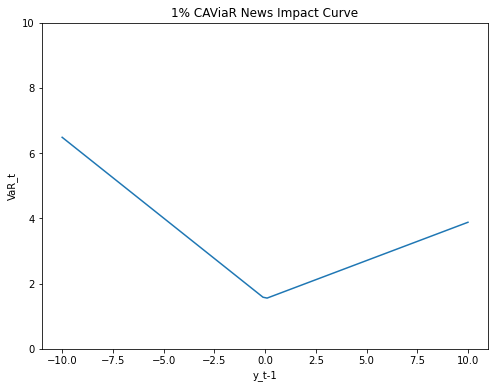

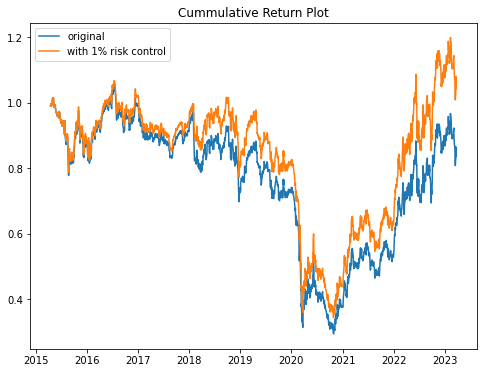

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.3583968066487492
Update 1: 0.25487733105021687
Update 2: 0.2548773310476028
when m = 2
Update 0: 0.46160723173247875
Update 1: 0.2548788948676257
Update 2: 0.2548788948560643
when m = 3
Update 0: 0.560965708586434
Update 1: 0.25487790076944056
Update 2: 0.2548779007168483
Final loss: 0.2548773310476028
Time taken(s): 13.92
asymmetric numeric 0.05 AAPL


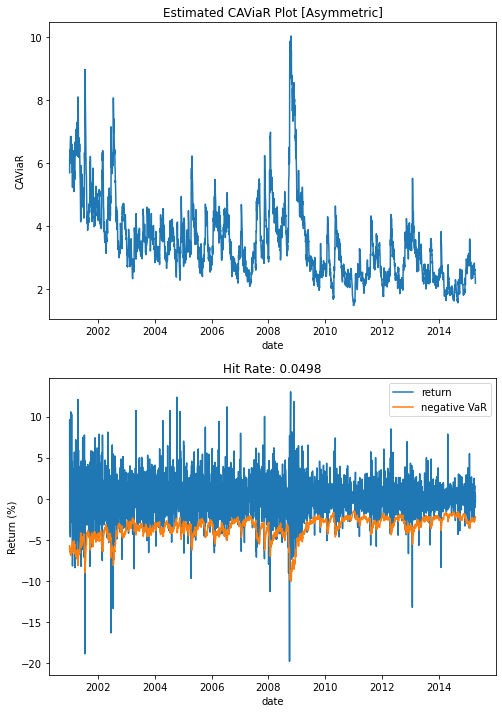

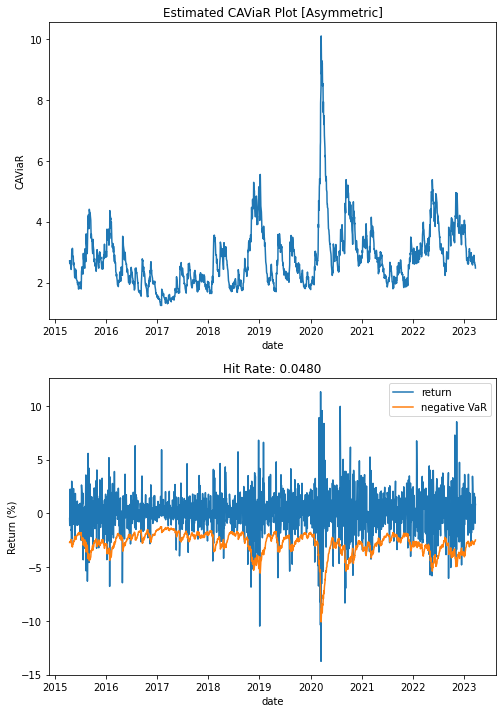

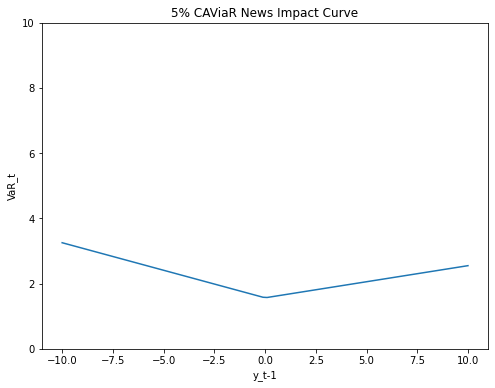

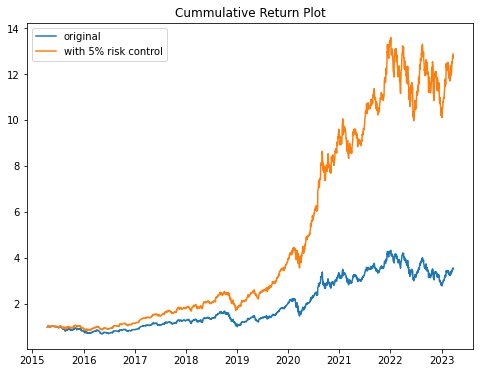

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.3042179861316976
Update 1: 0.18752094022653396
Update 2: 0.18752094021737692
when m = 2
Update 0: 0.3091635479340322
Update 1: 0.18752038993313908
Update 2: 0.1875203899283592
when m = 3
Update 0: 0.32021049820744213
Update 1: 0.18752115226954605
Update 2: 0.18752115226954605
Final loss: 0.1875203899283592
Time taken(s): 12.92
asymmetric numeric 0.05 COKE


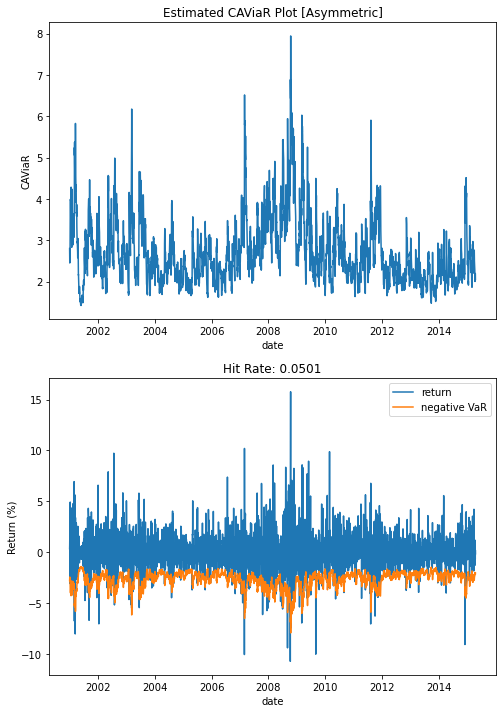

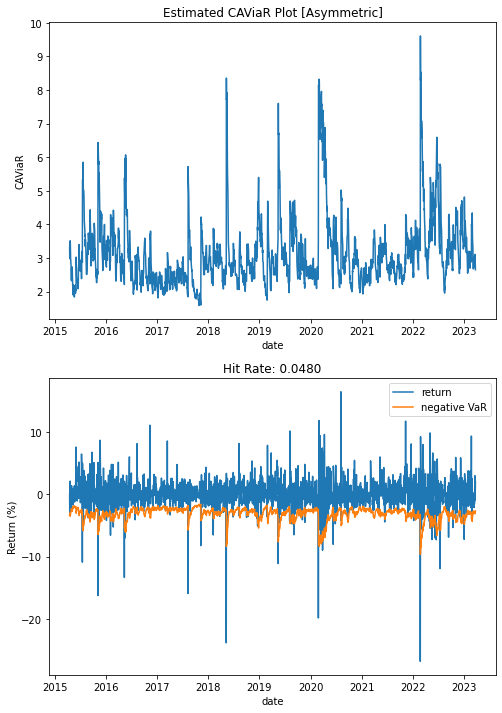

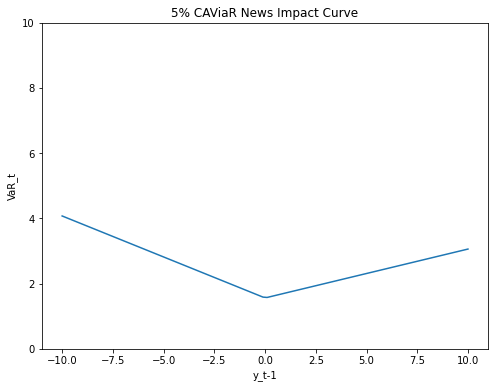

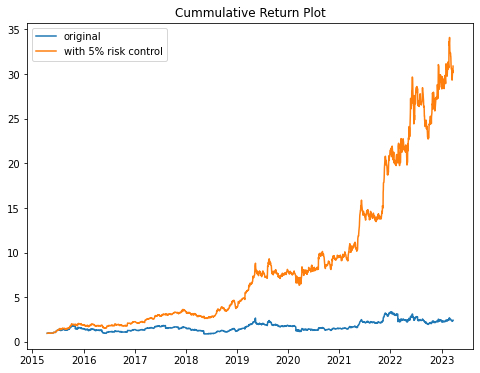

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.3434865935609452
Update 1: 0.23416713359290842
Update 2: 0.23415819172119498
Update 3: 0.2341581916019826
Update 4: 0.23415819159894558
when m = 2
Update 0: 0.39775151955240445
Update 1: 0.23415648201178918
Update 2: 0.23415648193685773
when m = 3
Update 0: 0.44591037113587756
Update 1: 0.2341622814027055
Update 2: 0.23415791696123855
Update 3: 0.23415791663916097
Update 4: 0.234157916467552
Update 5: 0.2341579164585667
Final loss: 0.23415648193685773
Time taken(s): 14.72
asymmetric numeric 0.05 JPM


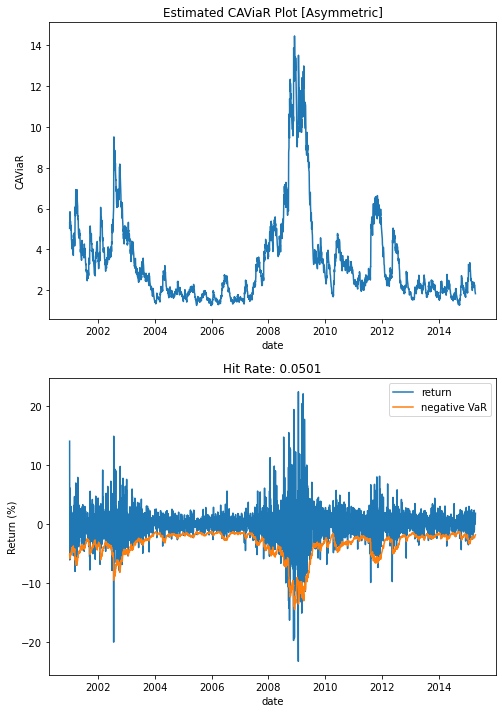

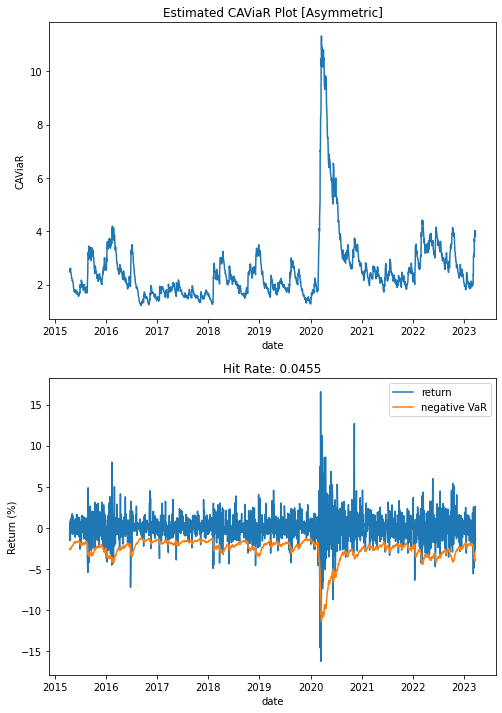

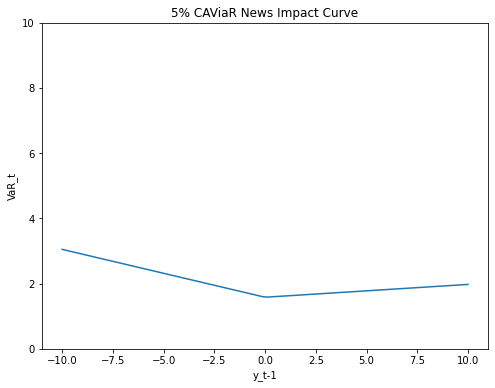

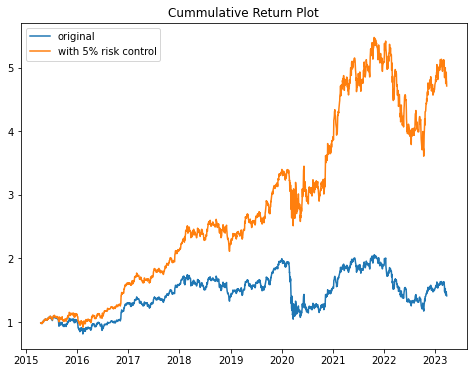

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.2629873076705942
Update 1: 0.18813162710947245
Update 2: 0.18813160940296556
Update 3: 0.18813160915582092
Update 4: 0.18813160915582094
when m = 2
Update 0: 0.2631472247124515
Update 1: 0.188131022910281
Update 2: 0.18813102290099906
when m = 3
Update 0: 0.3256914176428141
Update 1: 0.18812838682606264
Update 2: 0.1881283859011768
Update 3: 0.188128378608514
Update 4: 0.188128378608514
Final loss: 0.188128378608514
Time taken(s): 13.03
asymmetric numeric 0.05 MSFT


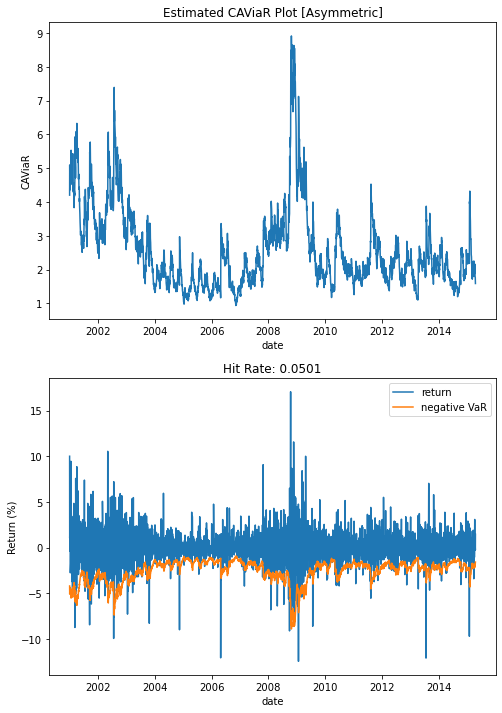

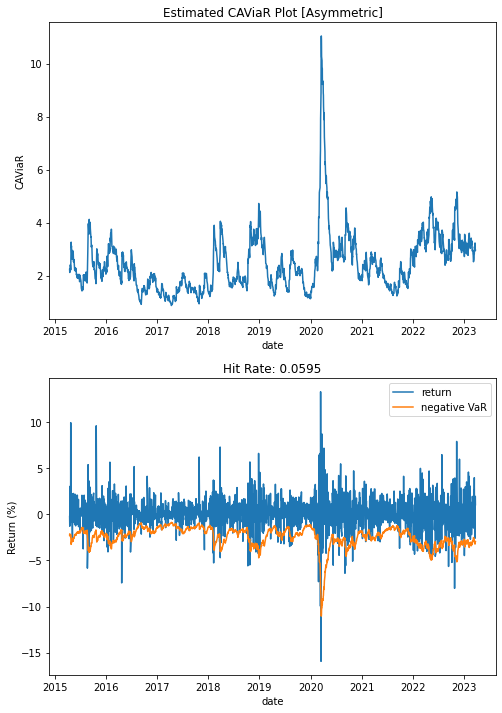

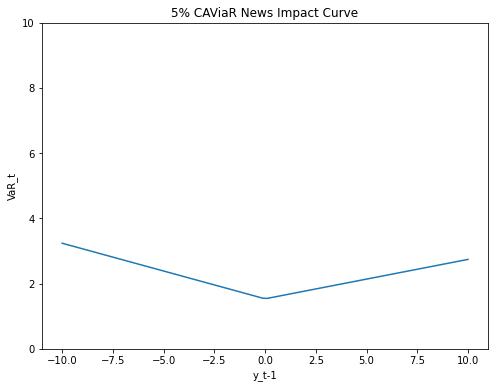

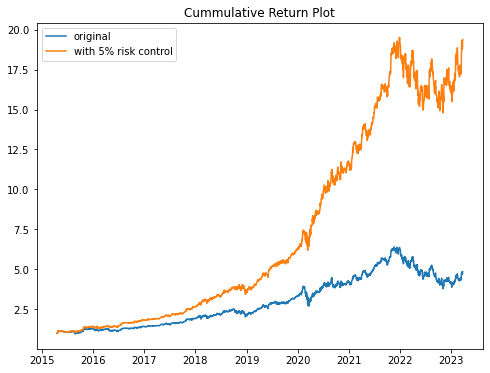

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.201781819839489
Update 1: 0.16246302701462045
Update 2: 0.16246302701462043
when m = 2
Update 0: 0.22828784232184413
Update 1: 0.16246282422202846
Update 2: 0.16246282345220234
Update 3: 0.16246282288169323
Update 4: 0.16246282288169323
when m = 3
Update 0: 0.2518137120871846
Update 1: 0.16246271937362777
Update 2: 0.1624627192183378
Update 3: 0.1624627188719288
Update 4: 0.16246271883832575
Final loss: 0.16246271883832575
Time taken(s): 12.06
asymmetric numeric 0.05 XOM


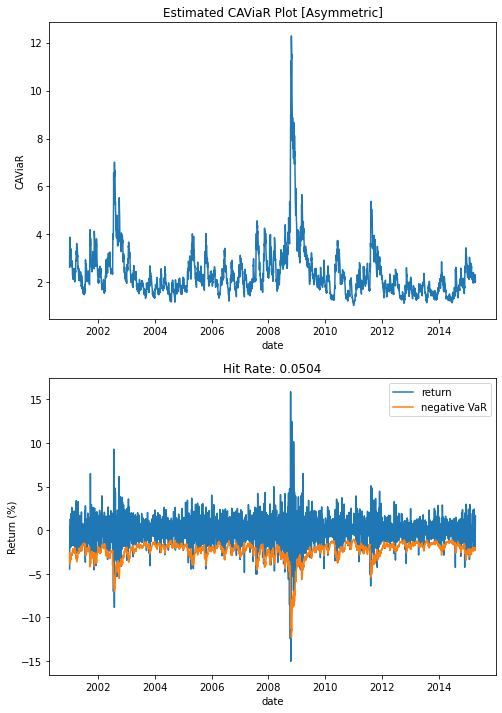

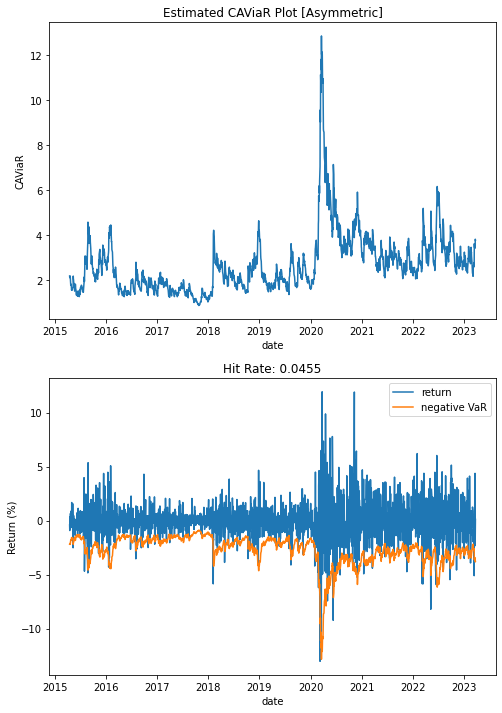

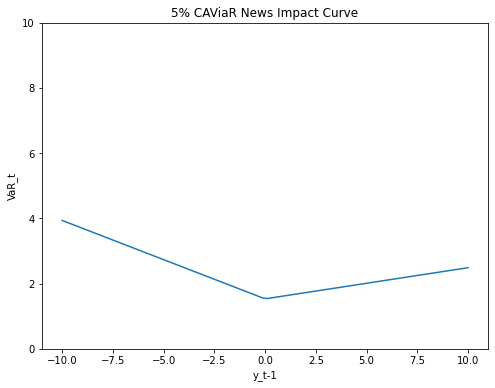

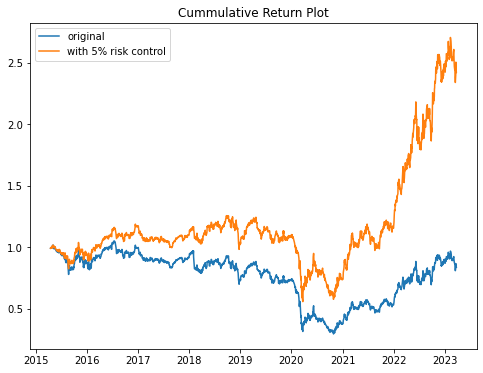

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -5463.996724294194
        x: [ 8.029e-02 -5.615e-01  7.909e-01 -1.318e-01  5.740e-01]
      nit: 33
      jac: [-5.220e+00  8.073e+00 -2.070e+02  5.358e+01 -1.650e+01]
     nfev: 510
     njev: 85
 hess_inv: <5x5 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.08032569816286292
Time taken(s): 5.35
asymmetric mle 0.01 AAPL


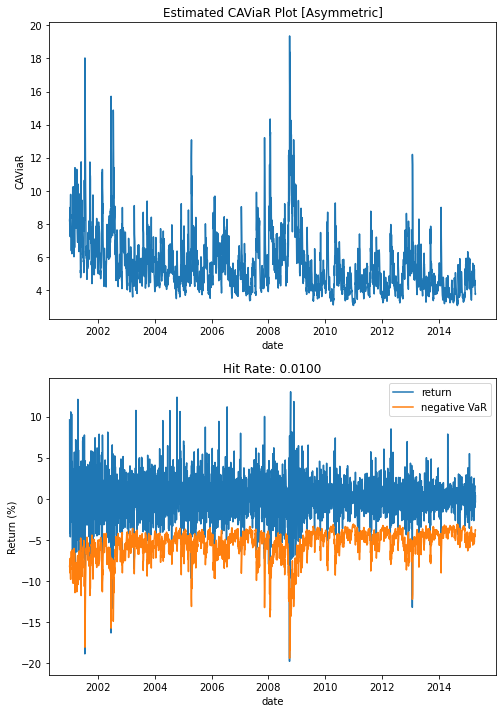

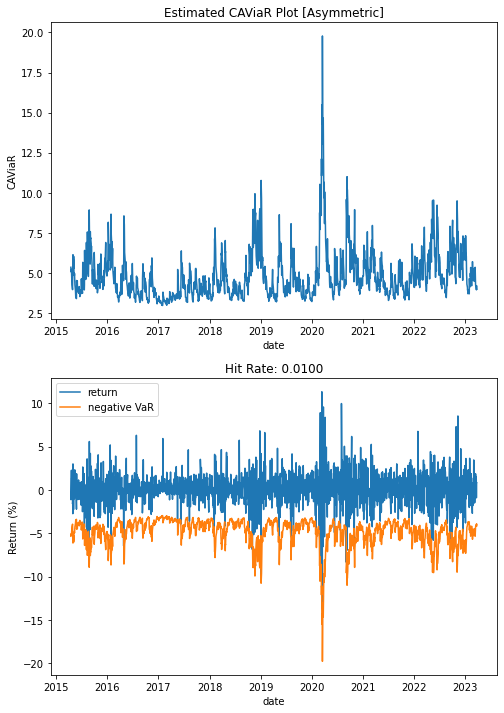

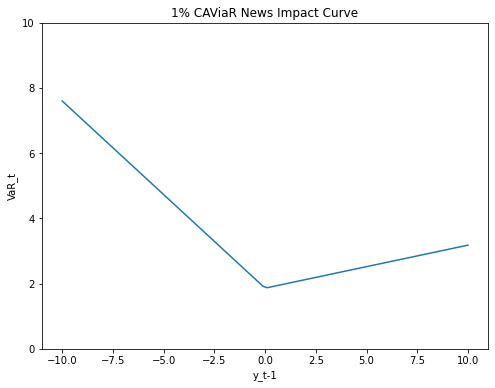

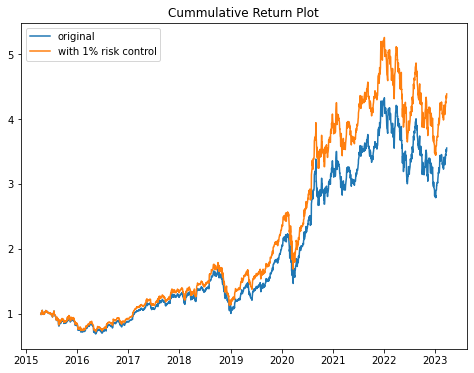

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -6777.751867799541
        x: [ 5.568e-02 -3.188e-01  8.172e-01 -3.489e-01  3.536e-01]
      nit: 76
      jac: [-1.030e+01  9.148e+01 -6.529e+01  1.586e+01  2.185e+01]
     nfev: 1038
     njev: 173
 hess_inv: <5x5 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.05569418766810063
Time taken(s): 10.56
asymmetric mle 0.01 COKE


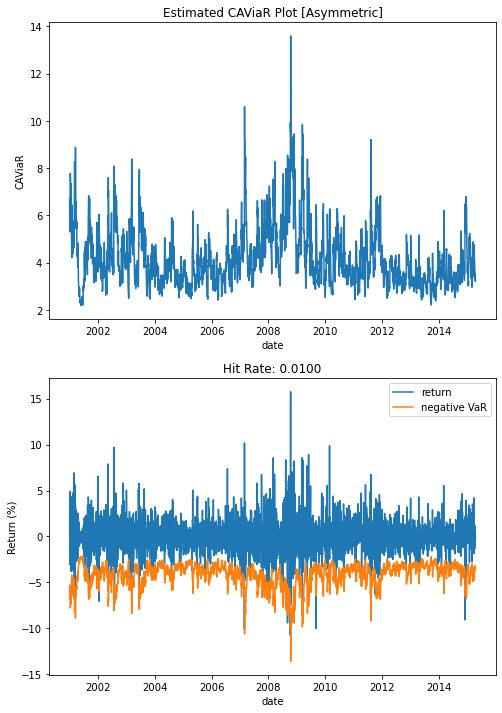

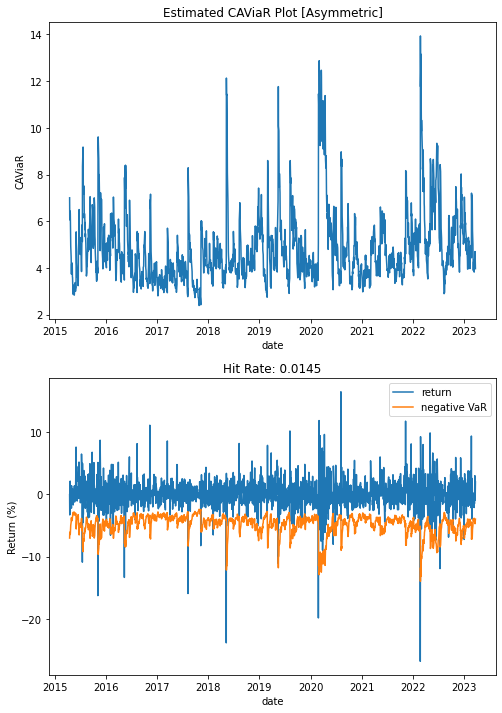

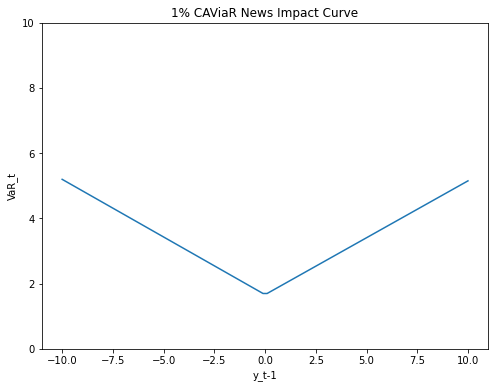

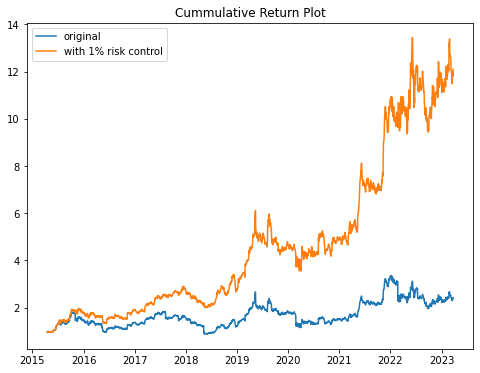

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -6061.5502974764095
        x: [ 6.809e-02 -1.378e-01  8.704e-01 -1.497e-01  5.368e-01]
      nit: 45
      jac: [ 7.995e+01  1.830e+01  4.975e+02  1.100e+02  2.665e+01]
     nfev: 678
     njev: 113
 hess_inv: <5x5 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.06802540465402082
Time taken(s): 7.21
asymmetric mle 0.01 JPM


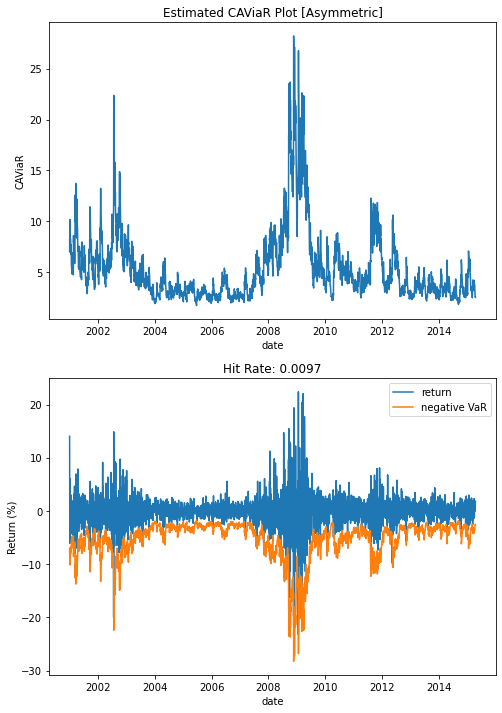

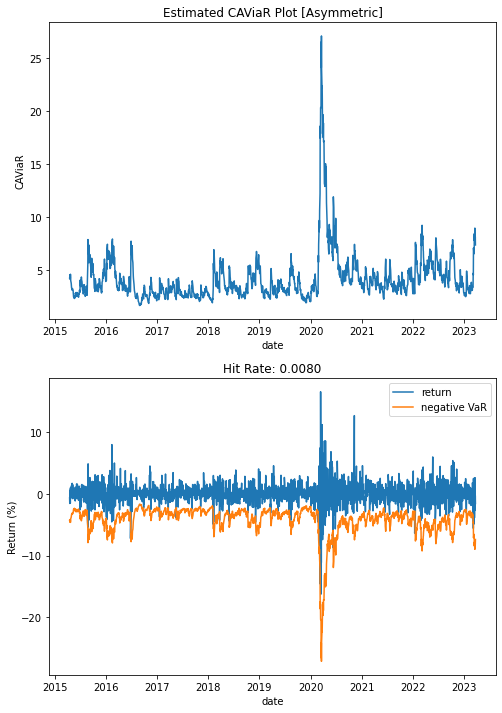

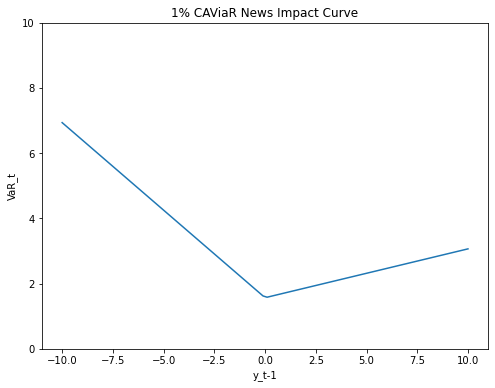

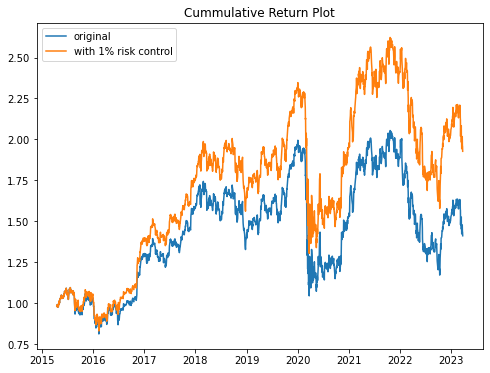

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -6458.216340607708
        x: [ 6.095e-02 -1.809e-01  8.145e-01 -5.521e-01  3.975e-01]
      nit: 44
      jac: [ 6.864e+01  1.272e+01 -2.089e+02 -1.400e+01 -5.596e+01]
     nfev: 702
     njev: 117
 hess_inv: <5x5 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.06090161120609717
Time taken(s): 7.51
asymmetric mle 0.01 MSFT


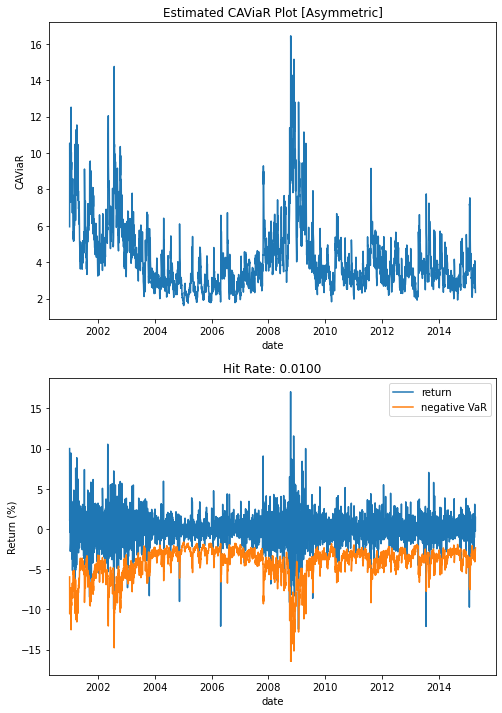

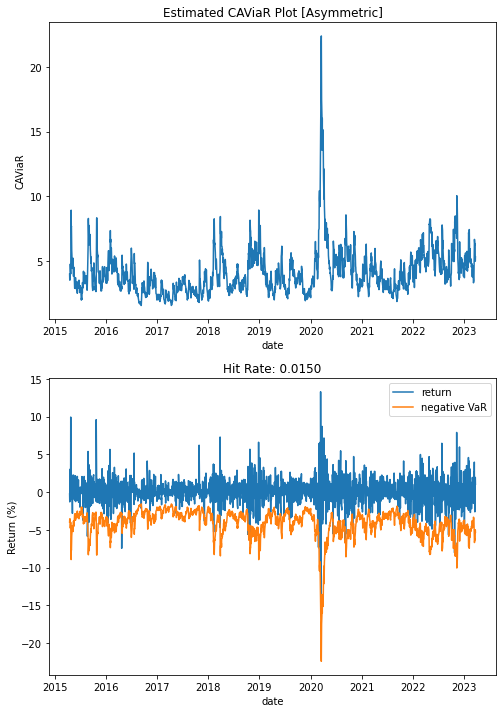

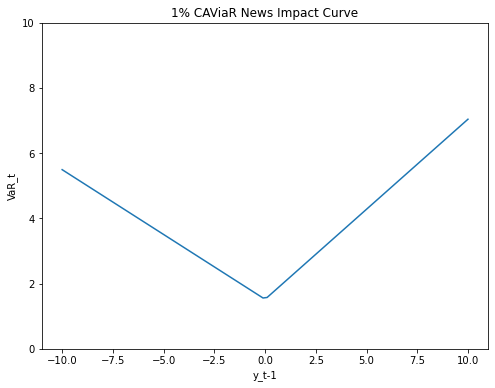

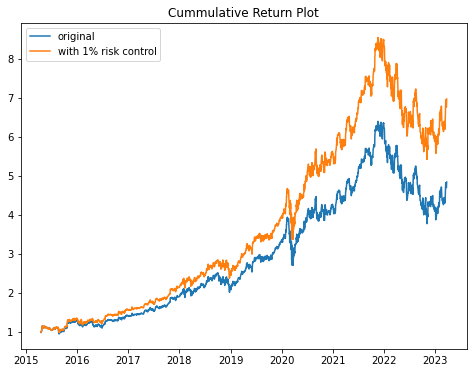

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -7444.936313703437
        x: [ 4.622e-02 -8.956e-02  8.740e-01 -2.360e-01  4.887e-01]
      nit: 35
      jac: [-4.947e+01  2.908e+01  1.400e+03  3.210e+01  2.638e+02]
     nfev: 486
     njev: 81
 hess_inv: <5x5 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.04636028260267211
Time taken(s): 5.39
asymmetric mle 0.01 XOM


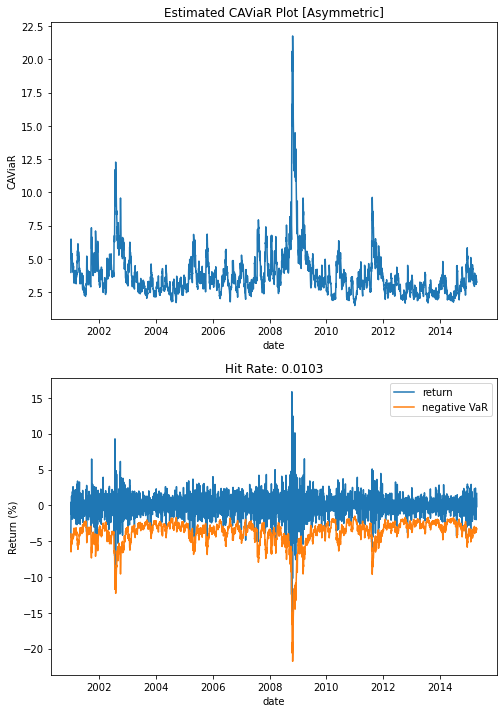

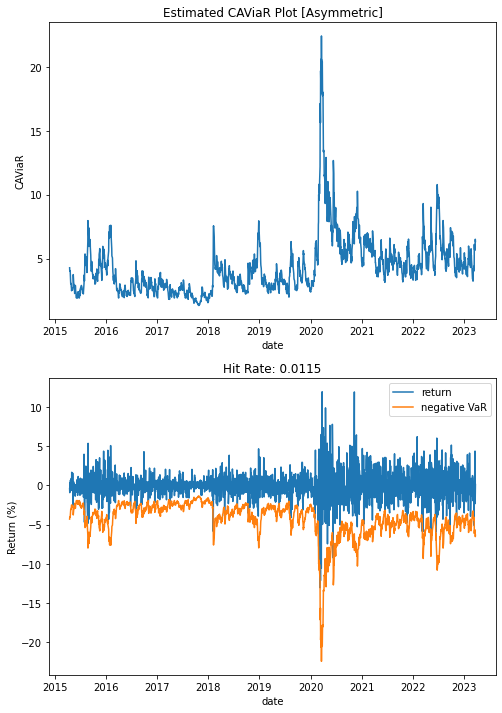

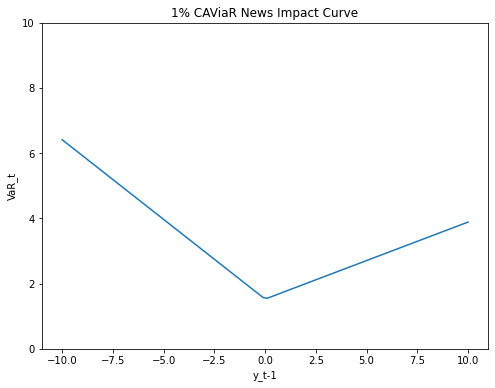

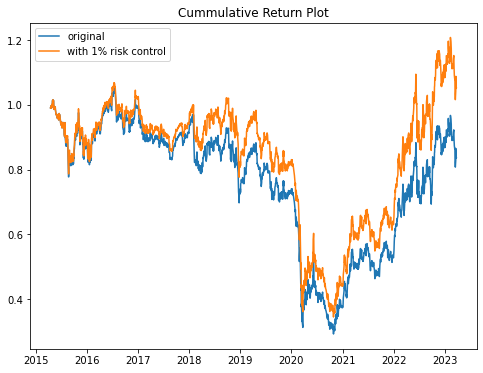

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -1319.4275314944648
        x: [ 2.548e-01 -6.729e-02  9.141e-01 -9.588e-02  1.769e-01]
      nit: 49
      jac: [ 2.392e+00  4.027e+01 -1.880e+02  6.662e+01 -6.694e+01]
     nfev: 654
     njev: 109
 hess_inv: <5x5 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.2548778425940886
Time taken(s): 7.42
asymmetric mle 0.05 AAPL


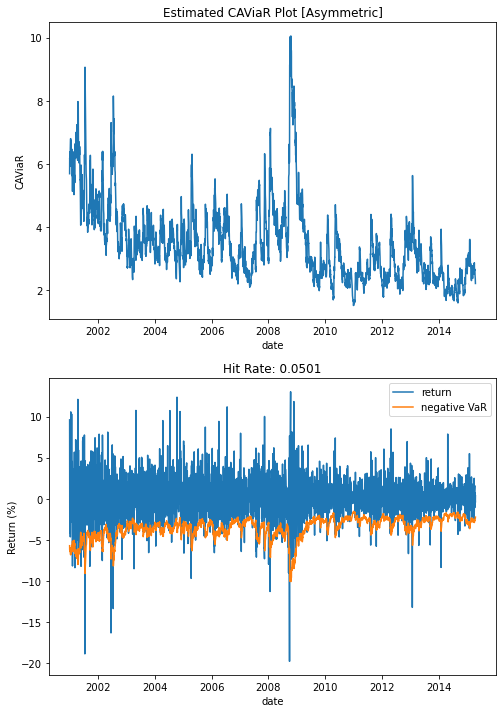

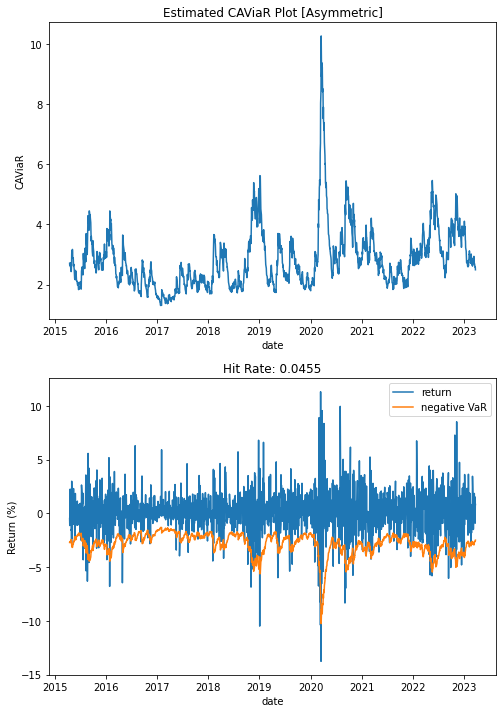

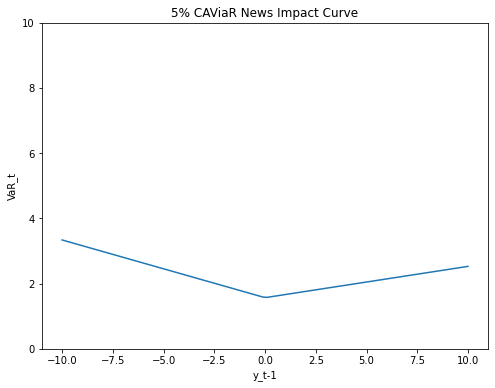

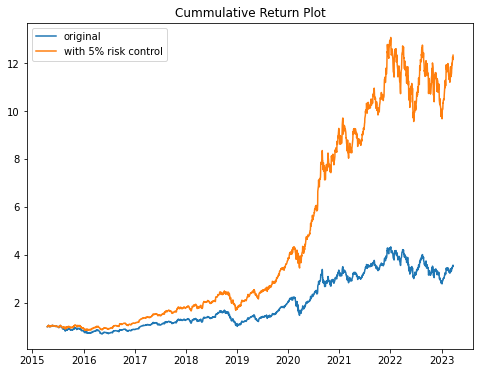

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -2419.0315430038513
        x: [ 1.875e-01 -1.798e-01  8.401e-01 -1.512e-01  2.513e-01]
      nit: 49
      jac: [-6.401e-01  3.575e+01 -1.296e+01  1.564e+01  8.866e+00]
     nfev: 678
     njev: 113
 hess_inv: <5x5 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.1875198732207571
Time taken(s): 7.72
asymmetric mle 0.05 COKE


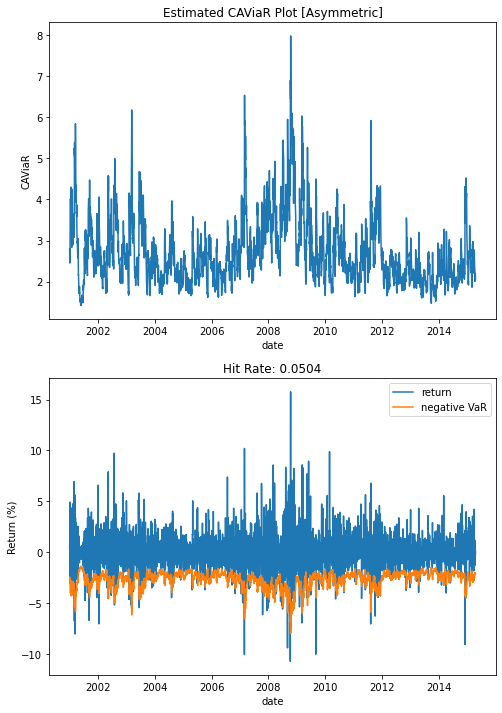

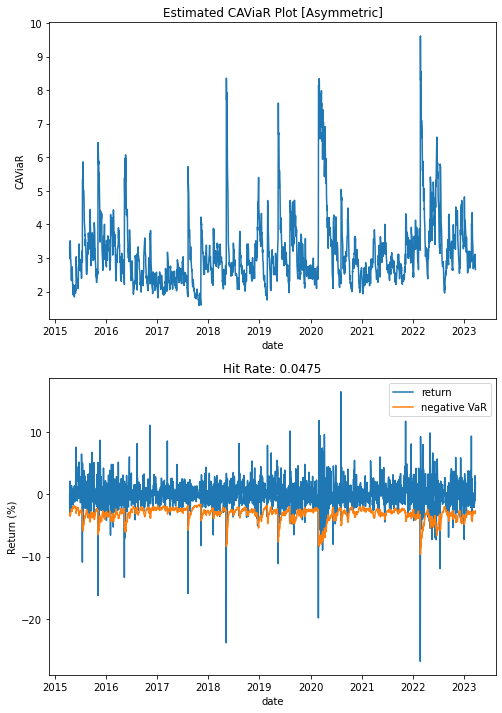

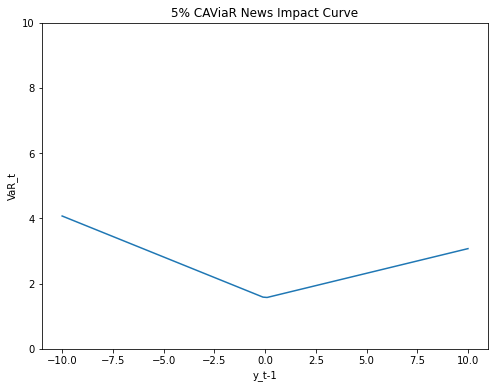

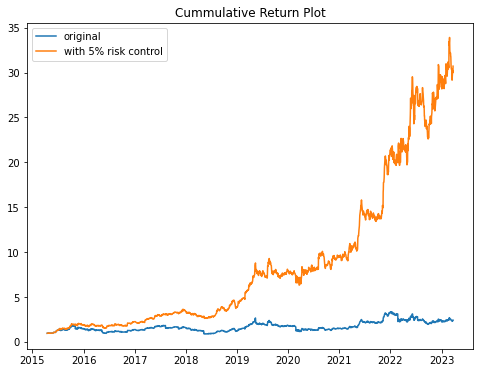

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -1624.8167613214318
        x: [ 2.344e-01 -2.514e-02  9.464e-01 -4.252e-02  1.486e-01]
      nit: 46
      jac: [ 3.003e+01  9.170e+01 -2.116e+02  6.564e+01 -2.449e+01]
     nfev: 582
     njev: 97
 hess_inv: <5x5 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.23416201005934148
Time taken(s): 6.49
asymmetric mle 0.05 JPM


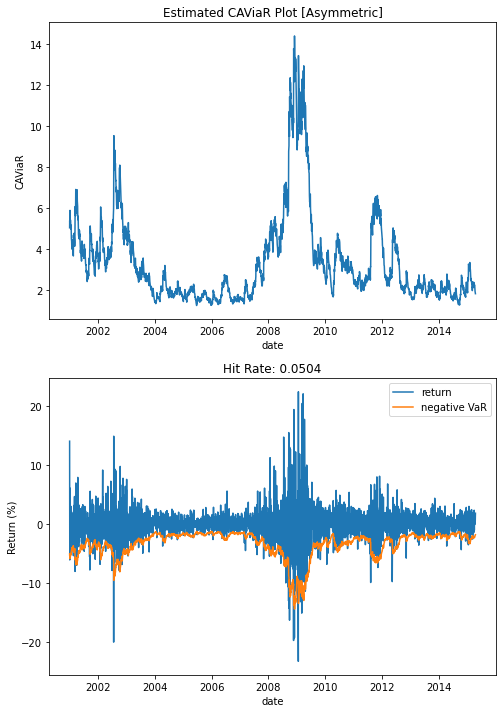

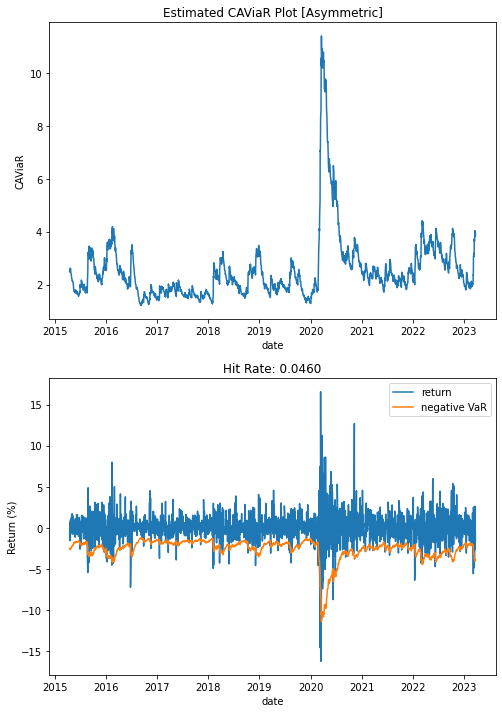

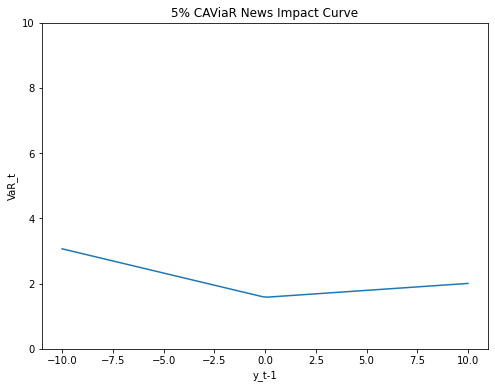

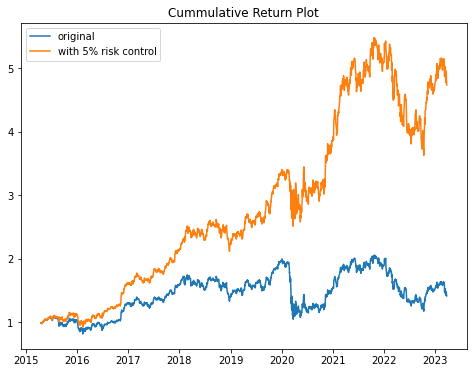

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -2410.3681880533345
        x: [ 1.880e-01 -1.966e-02  9.229e-01 -1.189e-01  1.659e-01]
      nit: 39
      jac: [-9.254e-01 -6.963e+01  3.021e+02 -8.798e+01  1.045e+02]
     nfev: 546
     njev: 91
 hess_inv: <5x5 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.18812694160566798
Time taken(s): 6.20
asymmetric mle 0.05 MSFT


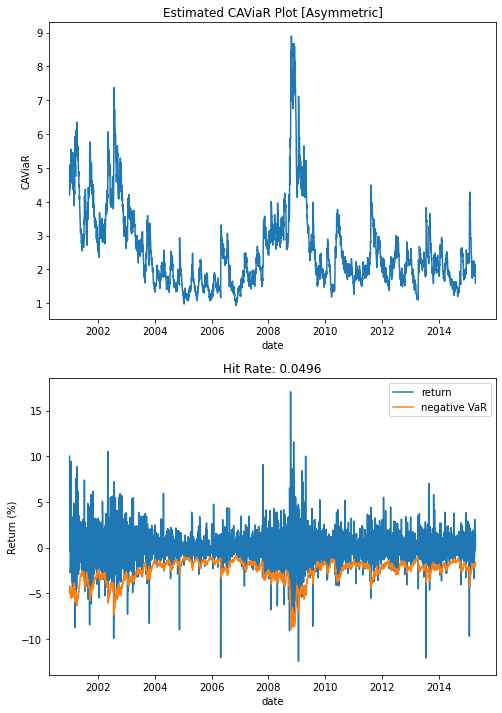

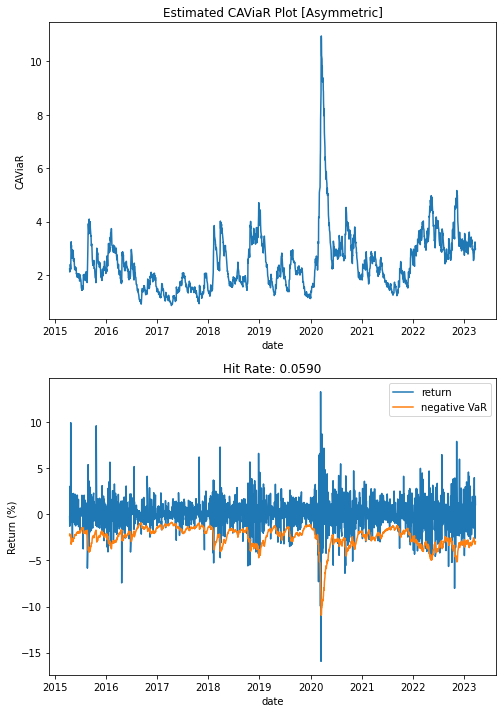

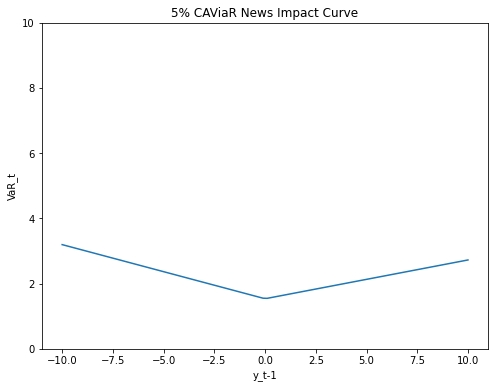

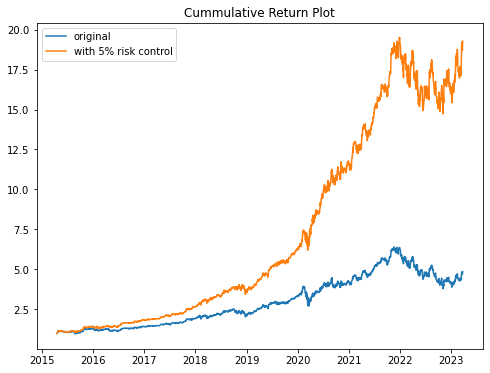

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -2943.715620019986
        x: [ 1.620e-01 -4.907e-02  9.005e-01 -9.892e-02  2.498e-01]
      nit: 37
      jac: [-4.990e+00 -3.683e+00  2.141e+02  1.445e+01  5.129e+01]
     nfev: 654
     njev: 109
 hess_inv: <5x5 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.16246613543882357
Time taken(s): 7.19
asymmetric mle 0.05 XOM


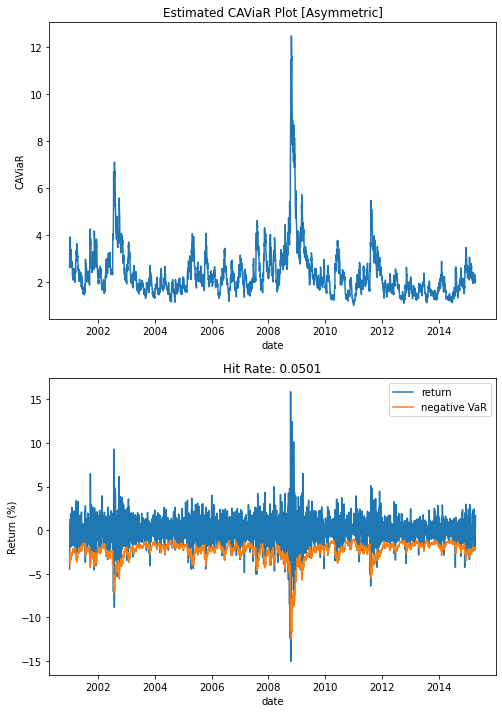

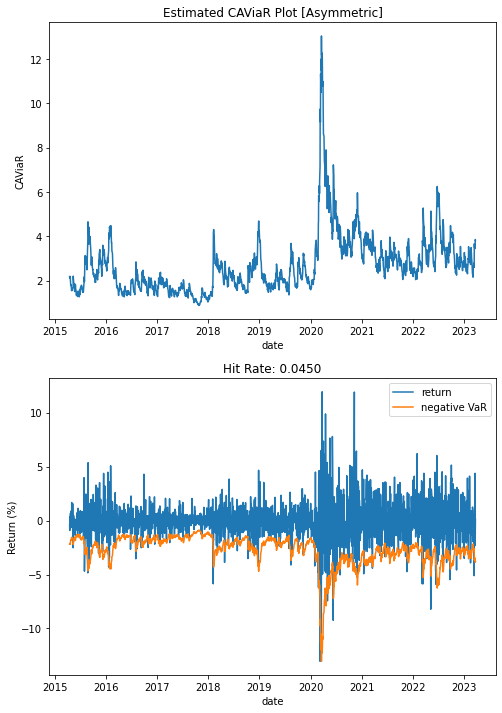

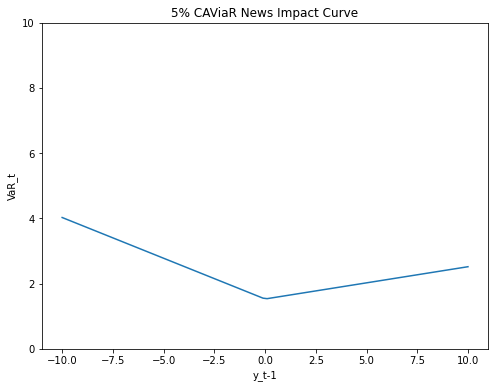

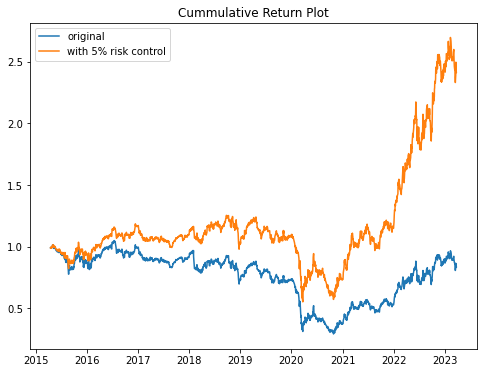

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.8298158927459338
Update 1: 0.08064019418549069
Update 2: 0.08064015510764726
Update 3: 0.08064015499005452
Update 4: 0.08064015498314575
when m = 2
Update 0: 0.839341476976093
Update 1: 0.08063961483185324
Update 2: 0.08063961305977319
Update 3: 0.08063961230575262
Update 4: 0.08063961170445239
Update 5: 0.08063961063985393
Fail for the initialized beta. Skip.
when m = 3
Update 0: 0.885295623421584
Update 1: 0.0806379946834841
Update 2: 0.08063799468006579
Final loss: 0.08063799468006579
Time taken(s): 7.65
symmetric numeric 0.01 AAPL


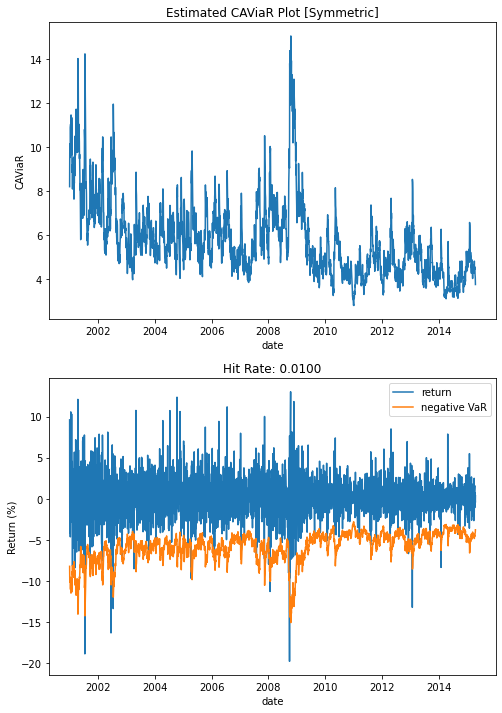

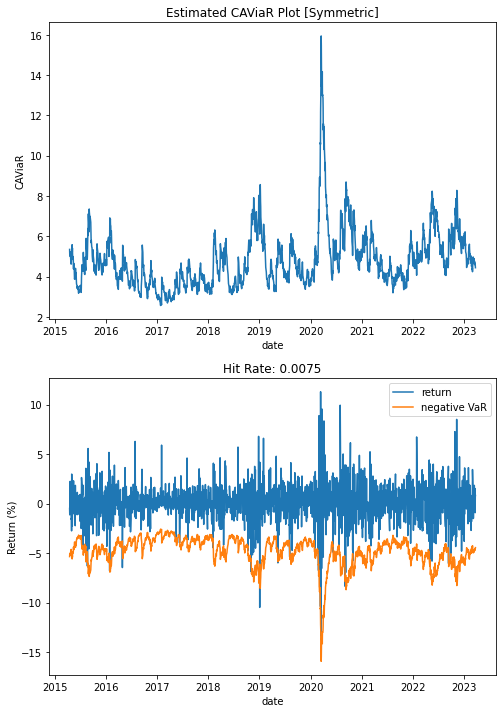

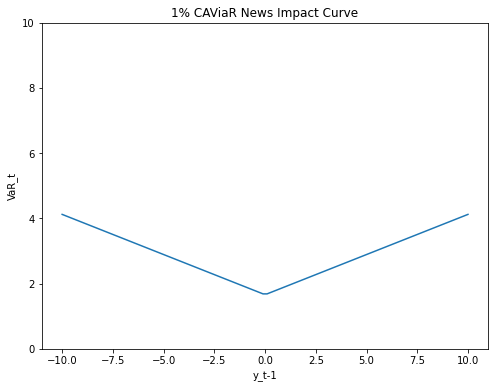

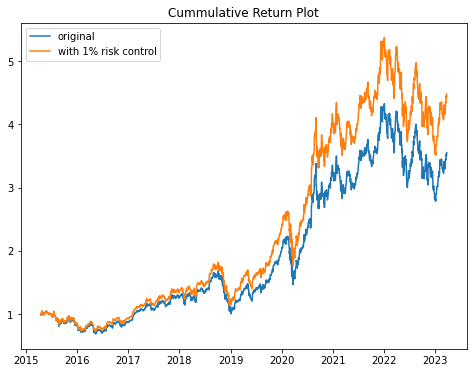

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.6941255793067405
Update 1: 0.05569492708440469
Update 2: 0.055694926604637957
Update 3: 0.05569492637406046
Update 4: 0.05569492633763111
when m = 2
Update 0: 0.7316457315885819
Update 1: 0.05570157098475167
Update 2: 0.055701568970058096
Update 3: 0.055701557731970386
Update 4: 0.05570155770462137
when m = 3
Update 0: 0.740798831664288
Update 1: 0.05569492194328175
Update 2: 0.055694921914397316
Final loss: 0.055694921914397316
Time taken(s): 7.24
symmetric numeric 0.01 COKE


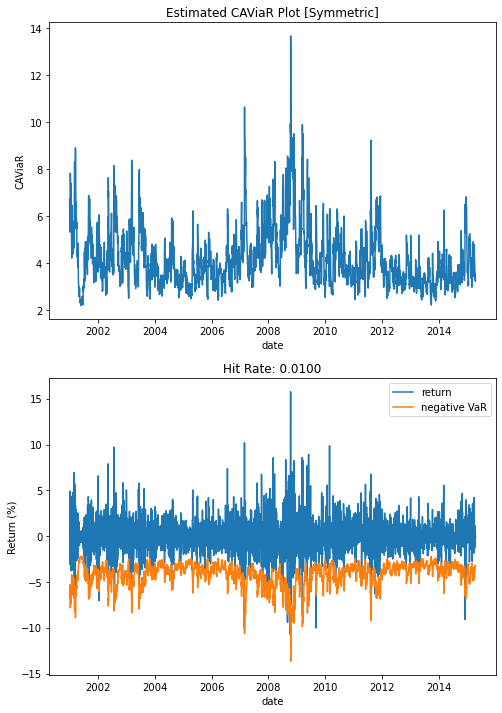

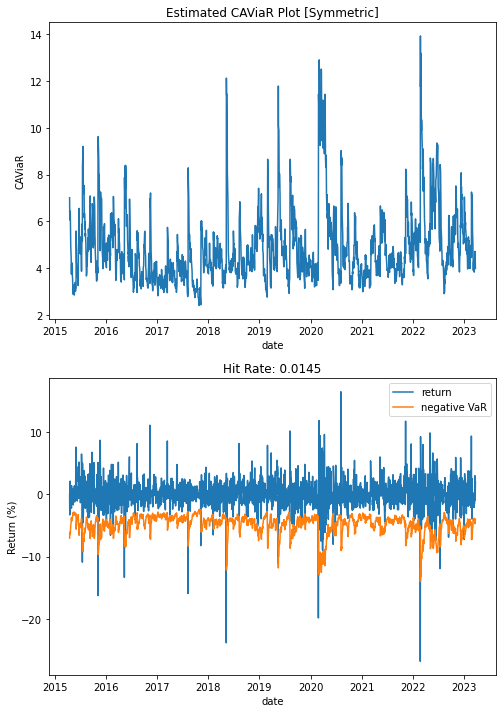

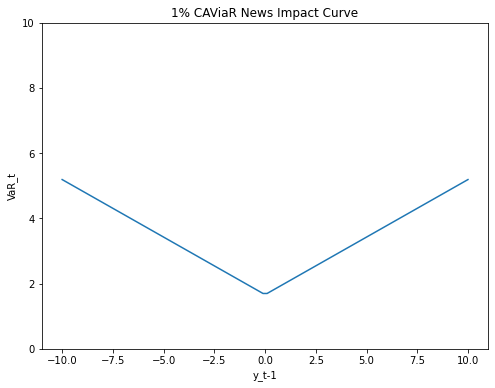

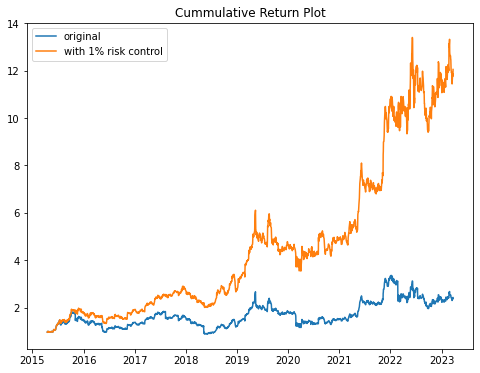

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.8303221120927281
Update 1: 0.07149510582843852
Update 2: 0.07149510582843852
when m = 2
Update 0: 0.8509663571642209
Update 1: 0.07148832940708992
Update 2: 0.07148832825560272
Update 3: 0.07148832788841965
Update 4: 0.07148832735562534
Update 5: 0.07148831835662106
Fail for the initialized beta. Skip.
when m = 3
Update 0: 0.853858563774441
Update 1: 0.07149446781269796
Update 2: 0.07149414117878716
Update 3: 0.07149414117878716
Final loss: 0.07148831688071405
Time taken(s): 8.06
symmetric numeric 0.01 JPM


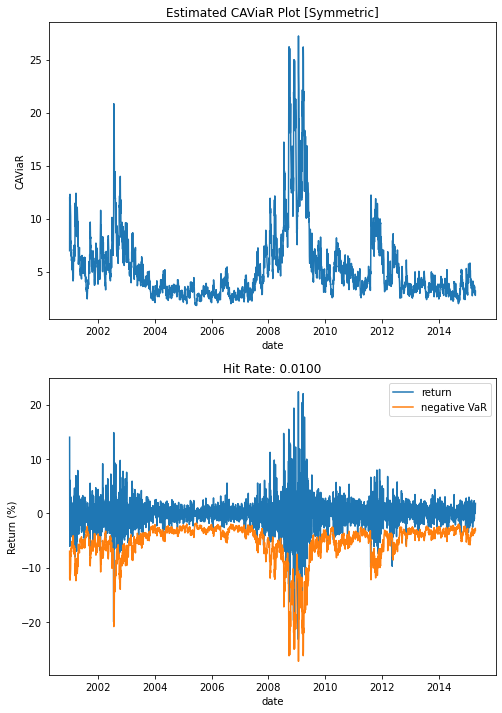

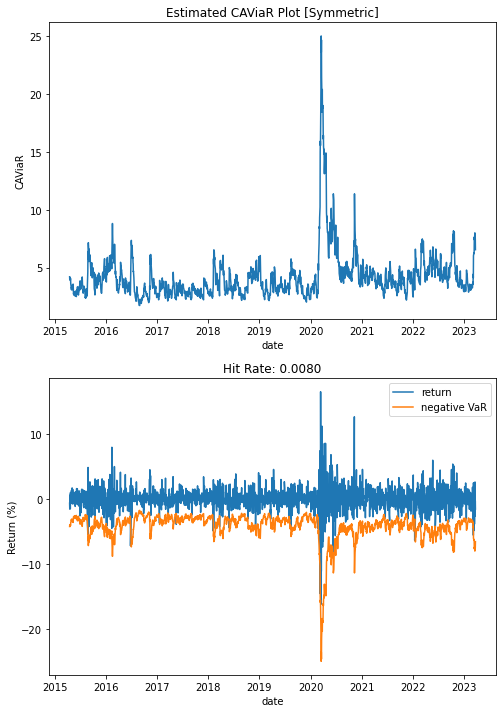

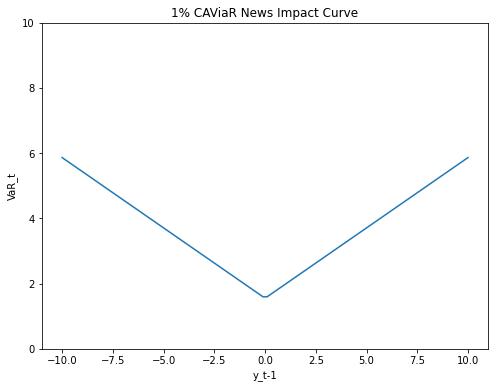

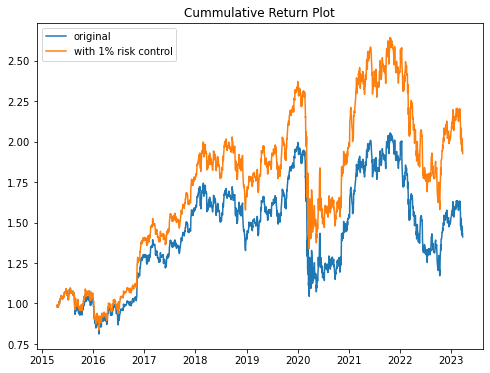

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.6858237859579894
Update 1: 0.061106055923126276
Update 2: 0.06110604292446371
Update 3: 0.061106042917477364
when m = 2
Update 0: 0.7358662666563378
Update 1: 0.06110601754164821
Update 2: 0.06110601376701569
Update 3: 0.06110601376701569
when m = 3
Update 0: 0.7411296833282732
Update 1: 0.06110665059575726
Update 2: 0.061106628440730164
Update 3: 0.06110662838785987
Final loss: 0.06110601376701569
Time taken(s): 7.67
symmetric numeric 0.01 MSFT


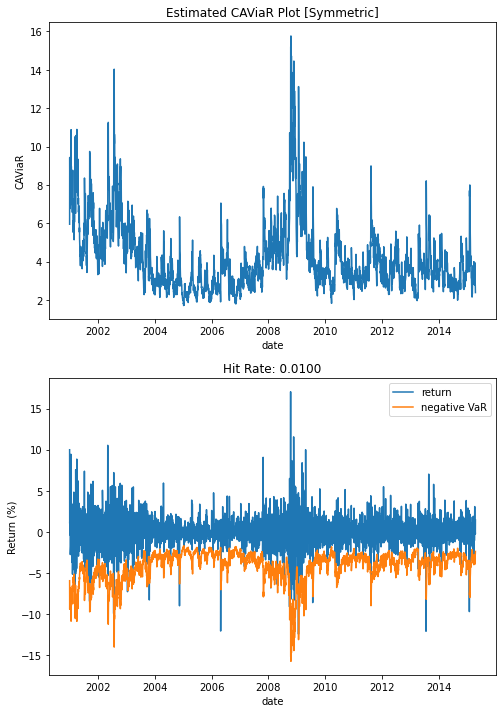

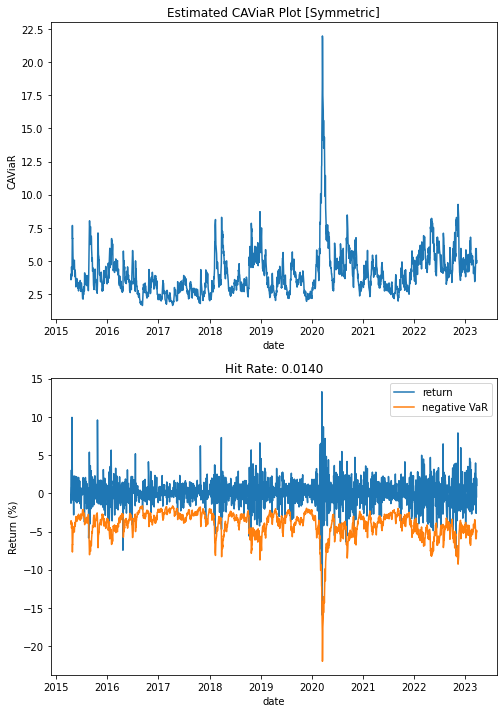

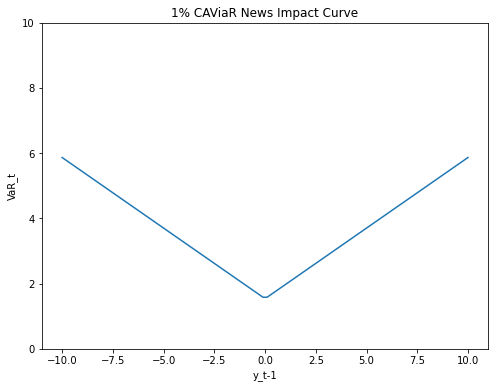

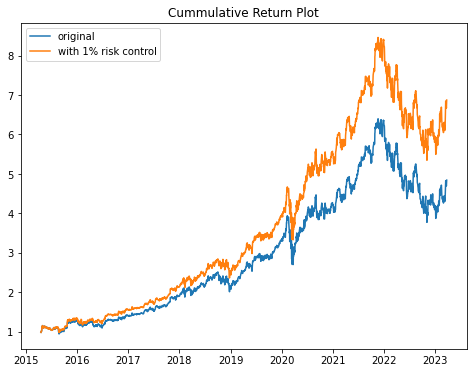

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.5366689547321825
Update 1: 0.046650145727041625
Update 2: 0.04665014532956253
Update 3: 0.046650145329562534
when m = 2
Update 0: 0.5521179446267208
Update 1: 0.046650011224454724
Update 2: 0.046650011223824187
when m = 3
Update 0: 0.5891339548971558
Update 1: 0.046650243893927114
Update 2: 0.046650237343551344
Update 3: 0.04665023734355134
Final loss: 0.046650011223824187
Time taken(s): 6.63
symmetric numeric 0.01 XOM


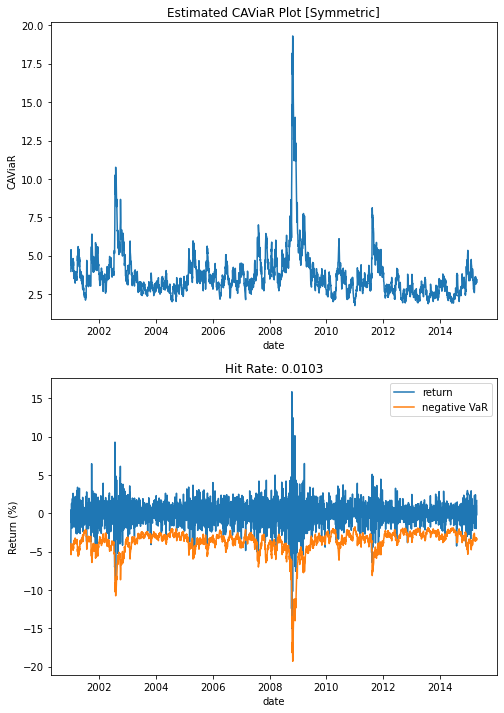

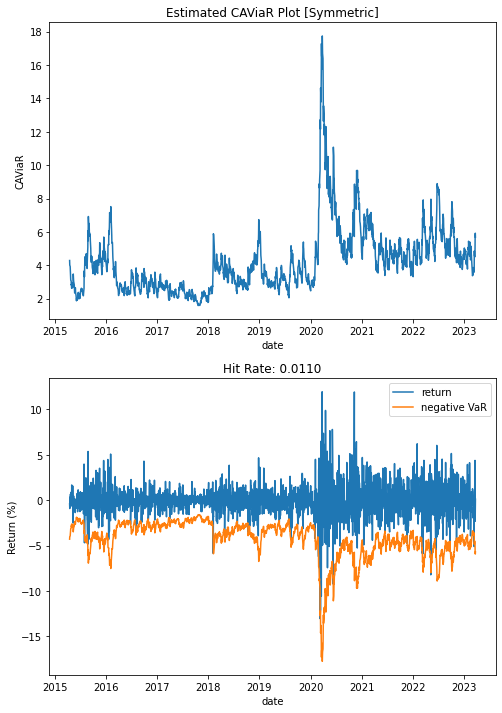

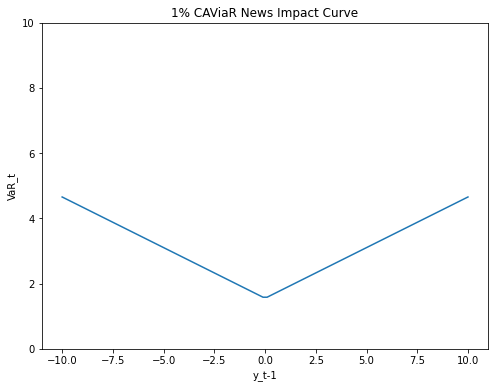

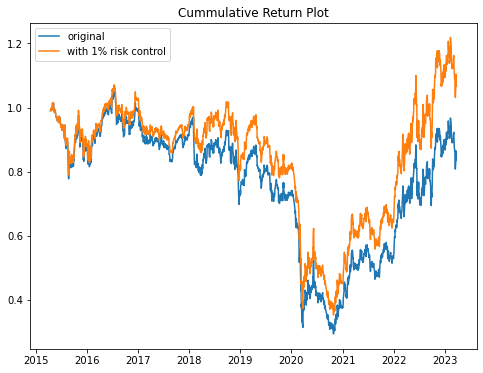

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.8444981236018548
Update 1: 0.2559644616594233
Update 2: 0.25596446147239826
Update 3: 0.2559644608458625
Update 4: 0.2559644608420691
when m = 2
Update 0: 0.8446452292734026
Update 1: 0.2559648590156099
Update 2: 0.25596485901543514
when m = 3
Update 0: 0.8552473088856754
Update 1: 0.25596469910120484
Update 2: 0.25596469906712704
Final loss: 0.2559644608420691
Time taken(s): 6.96
symmetric numeric 0.05 AAPL


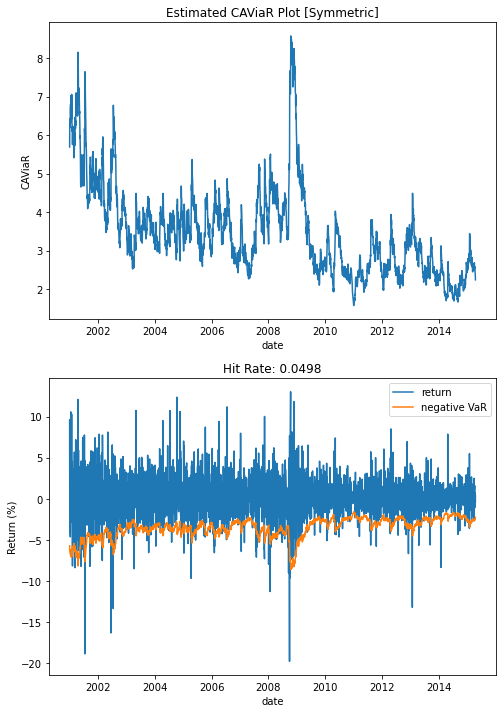

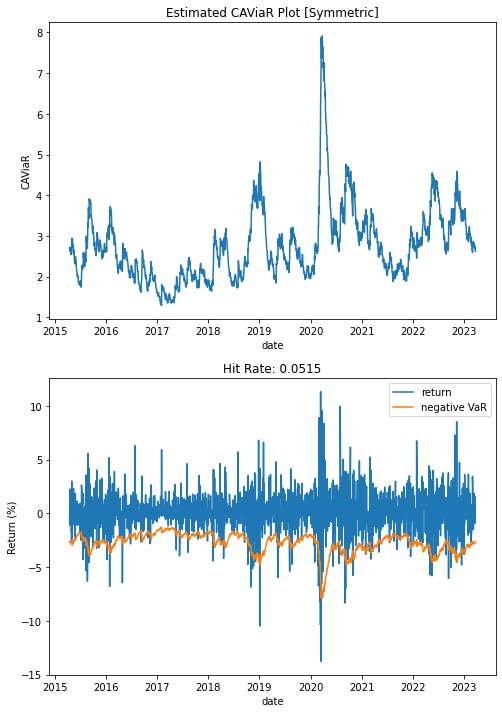

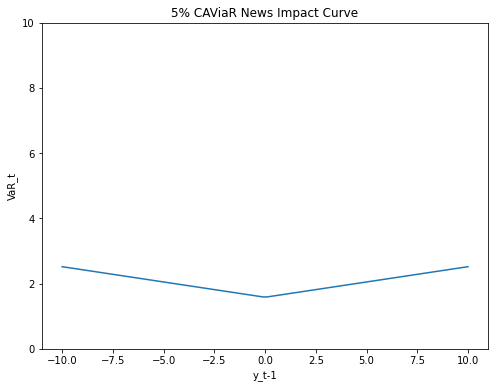

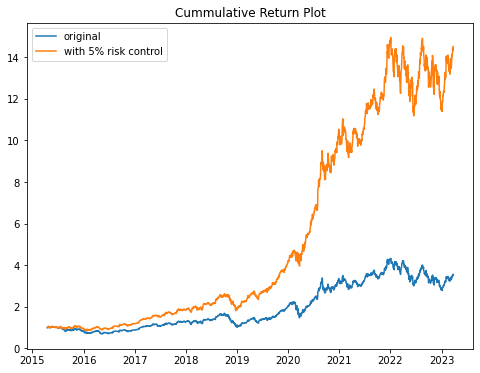

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.6239144939671204
Update 1: 0.18809945195516678
Update 2: 0.18809943735498924
Update 3: 0.18809943735498924
when m = 2
Update 0: 0.6431335967749016
Update 1: 0.18809975457024156
Update 2: 0.18809975423346847
Update 3: 0.18809975399282974
Update 4: 0.18809975398725046
when m = 3
Update 0: 0.6551282008241371
Update 1: 0.18810042952452258
Update 2: 0.18810029998315095
Update 3: 0.18810029998315095
Final loss: 0.18809943735498924
Time taken(s): 8.20
symmetric numeric 0.05 COKE


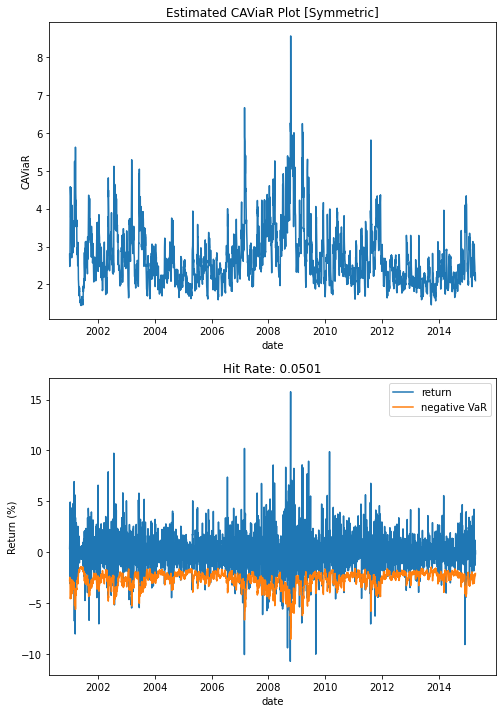

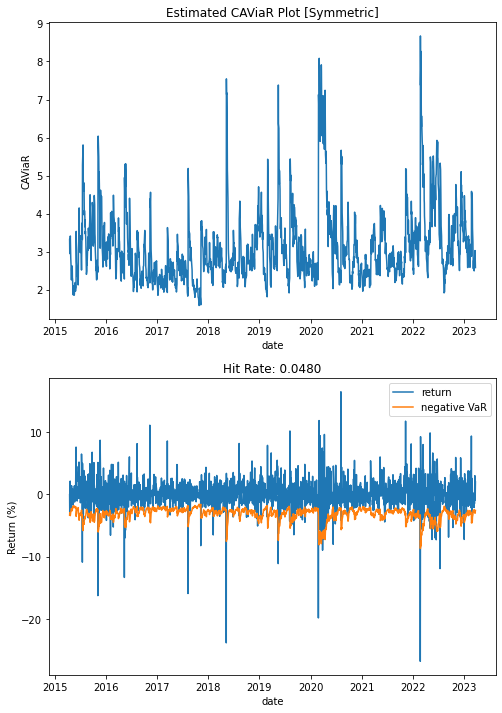

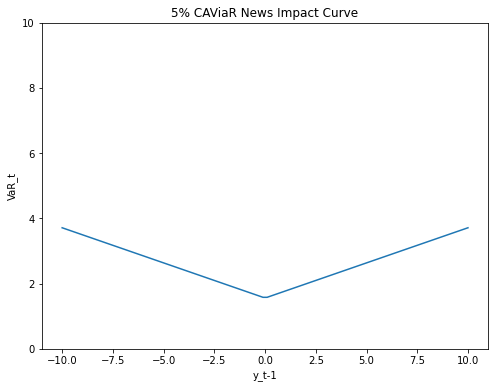

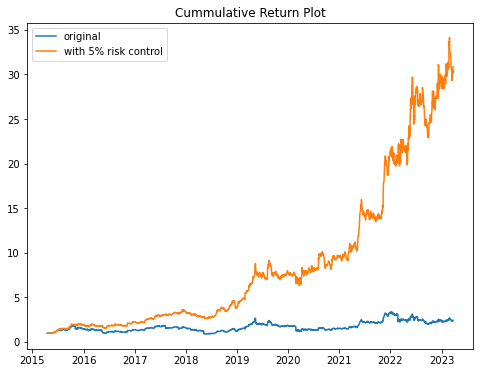

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.8373258075501036
Update 1: 0.23674216761702663
Update 2: 0.2367421675847583
when m = 2
Update 0: 0.8645353551259156
Update 1: 0.23674592910017747
Update 2: 0.23674202724147544
Update 3: 0.2367420217487182
Update 4: 0.23674202173243838
when m = 3
Update 0: 0.8853681828365036
Update 1: 0.23674204934771786
Update 2: 0.23674203560972515
Update 3: 0.23674203557498497
Final loss: 0.23674202173243838
Time taken(s): 6.70
symmetric numeric 0.05 JPM


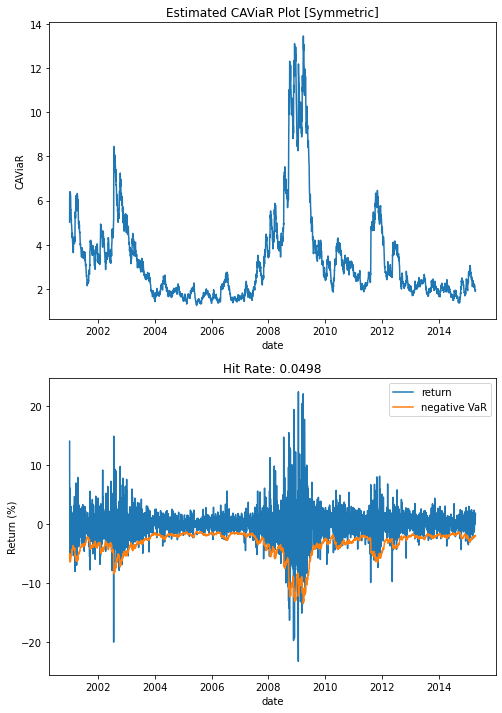

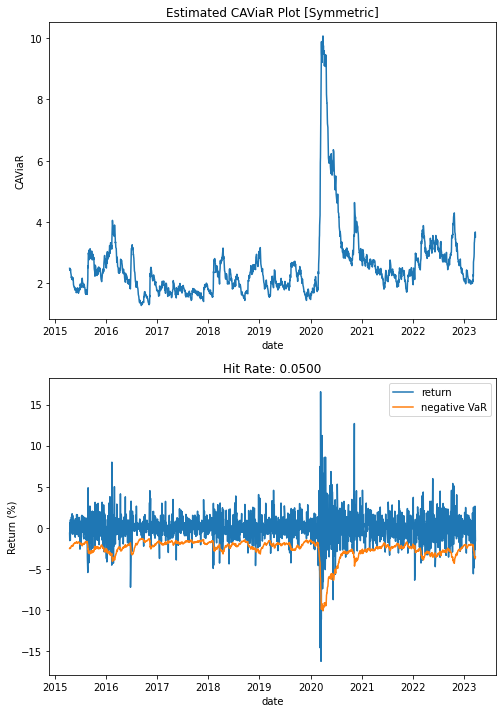

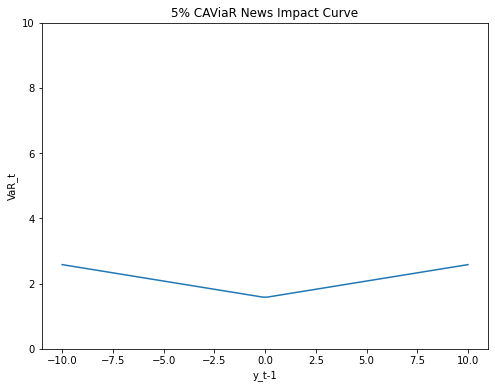

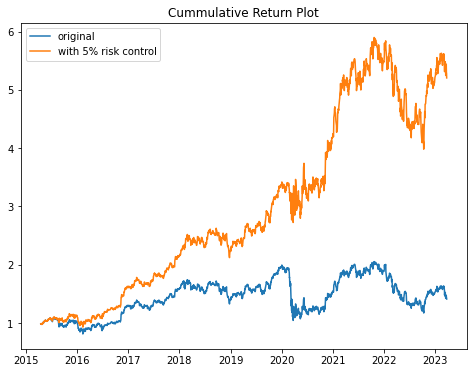

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.63521066895947
Update 1: 0.1883472685493563
Update 2: 0.18834726852663186
when m = 2
Update 0: 0.693251884631636
Update 1: 0.18834715324091061
Update 2: 0.188347152226637
Update 3: 0.18834715220221757
when m = 3
Update 0: 0.7184005833133544
Update 1: 0.18834703455034454
Update 2: 0.18834700224076192
Update 3: 0.1883470022407619
Final loss: 0.1883470022407619
Time taken(s): 6.82
symmetric numeric 0.05 MSFT


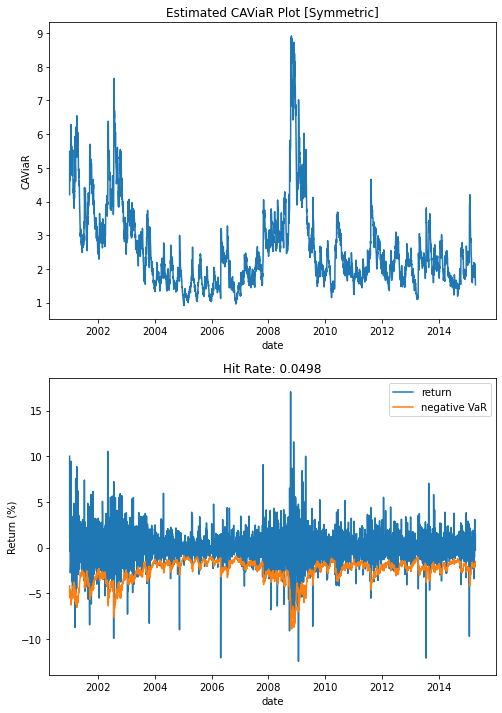

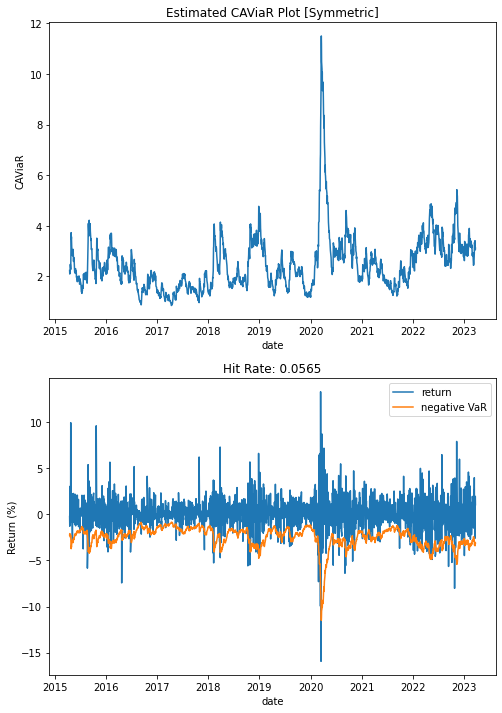

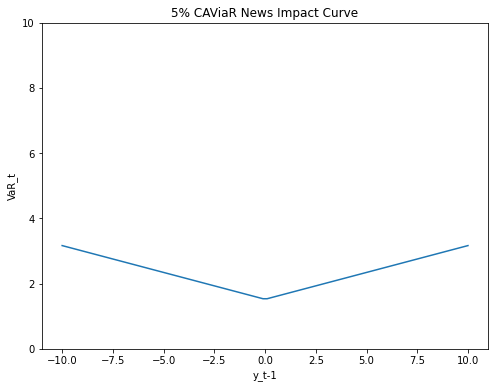

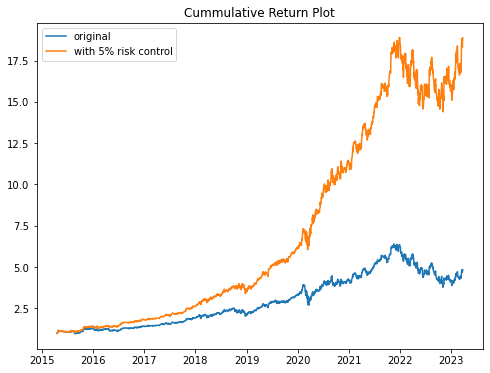

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.5570963555540251
Update 1: 0.16357638905987396
Update 2: 0.16357638597676352
Update 3: 0.1635763859666674
when m = 2
Update 0: 0.6000900591659234
Update 1: 0.1635769404012688
Update 2: 0.16357693868634163
Update 3: 0.16357693864666498
when m = 3
Update 0: 0.6061104867476133
Update 1: 0.1635763752952182
Update 2: 0.1635763653569458
Update 3: 0.1635763653472445
Final loss: 0.1635763653472445
Time taken(s): 6.66
symmetric numeric 0.05 XOM


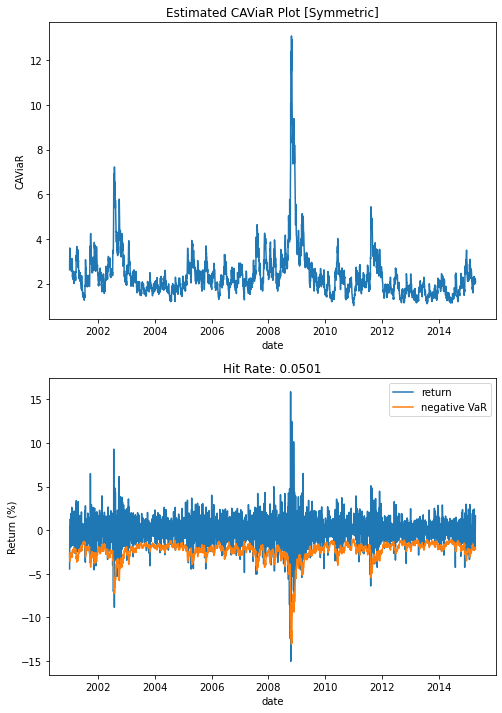

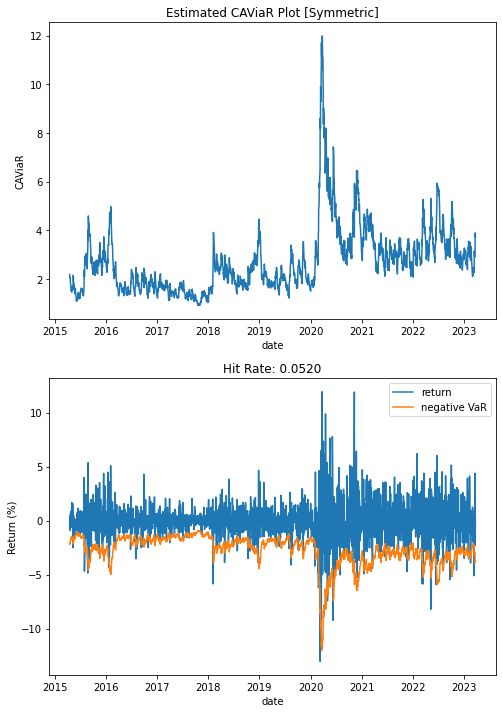

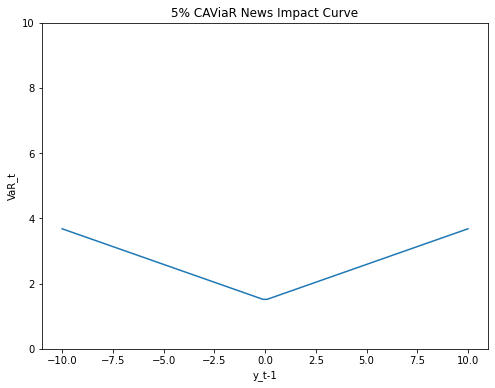

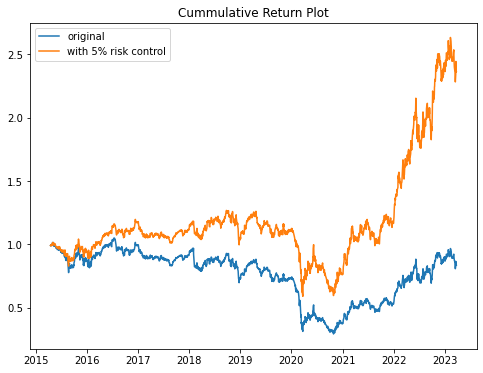

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -5446.520798512606
        x: [ 8.031e-02 -2.429e-01  8.925e-01 -2.177e-01]
      nit: 26
      jac: [-2.111e+02 -1.006e+02  4.189e+02  3.504e+01]
     nfev: 410
     njev: 82
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.08071653416962779
Time taken(s): 3.33
symmetric mle 0.01 AAPL


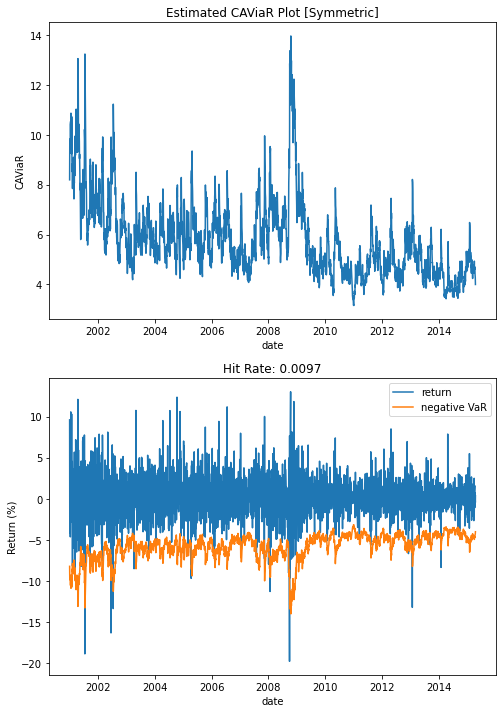

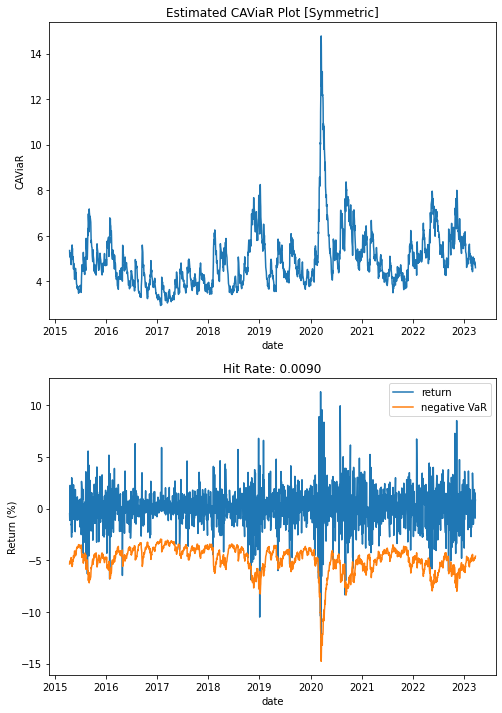

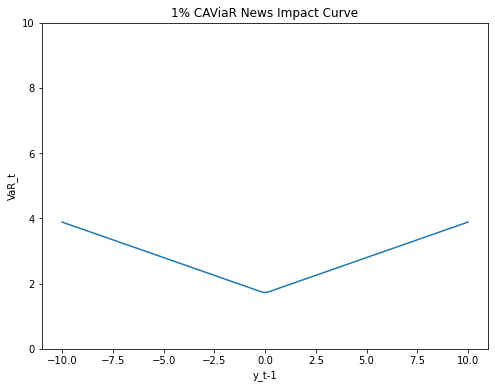

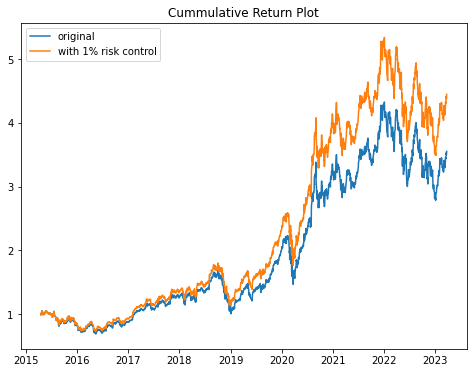

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -6777.669099657099
        x: [ 5.589e-02 -3.194e-01  8.170e-01 -3.528e-01]
      nit: 25
      jac: [ 2.307e+02  1.047e+02  2.285e+02  8.336e+01]
     nfev: 355
     njev: 71
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.0556951121448081
Time taken(s): 3.03
symmetric mle 0.01 COKE


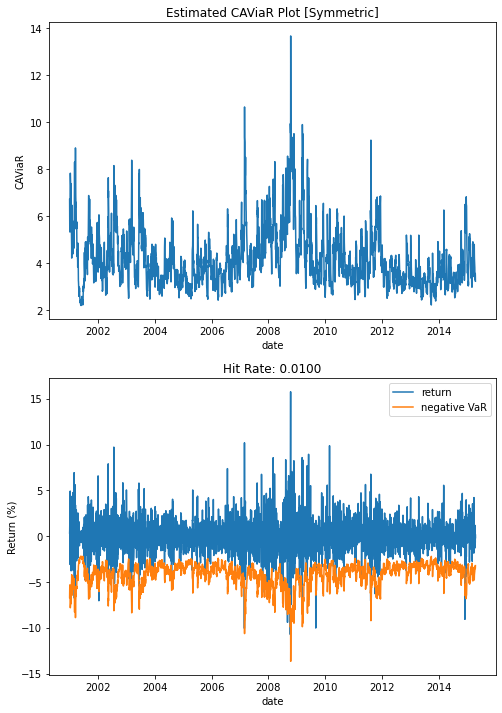

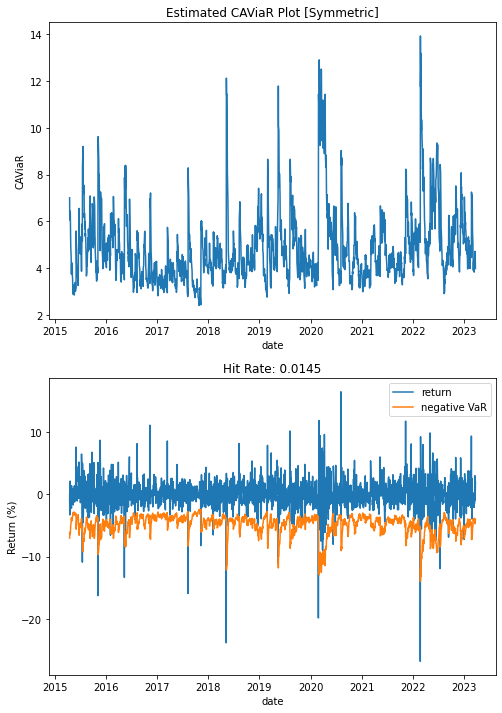

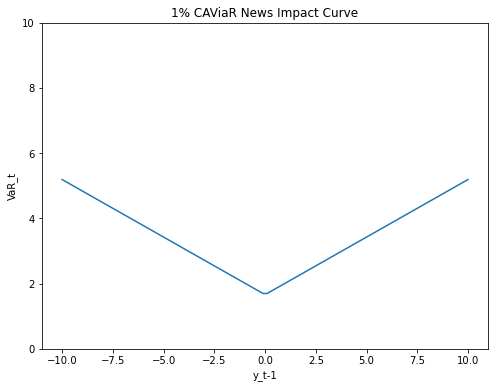

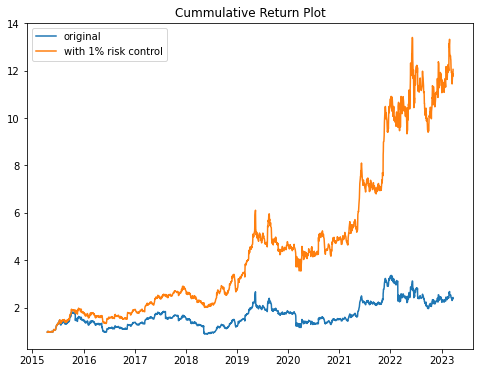

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -5883.117123140324
        x: [ 7.155e-02 -1.798e-01  8.347e-01 -4.305e-01]
      nit: 32
      jac: [ 7.224e+01  9.724e+01  2.185e+02  9.173e+01]
     nfev: 560
     njev: 112
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.07148892272343609
Time taken(s): 4.50
symmetric mle 0.01 JPM


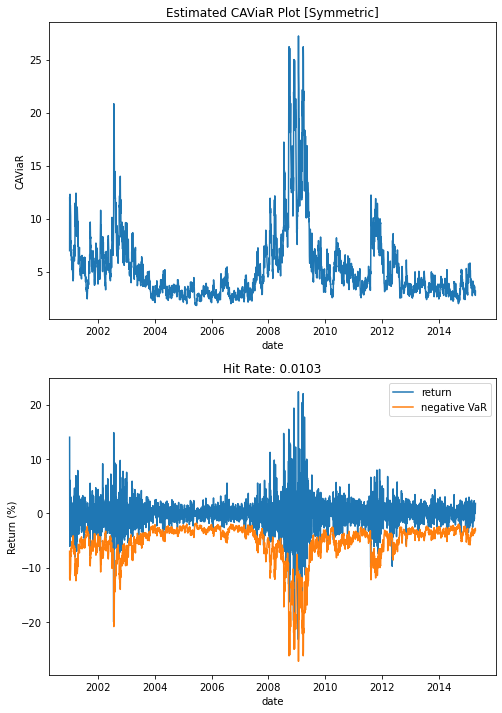

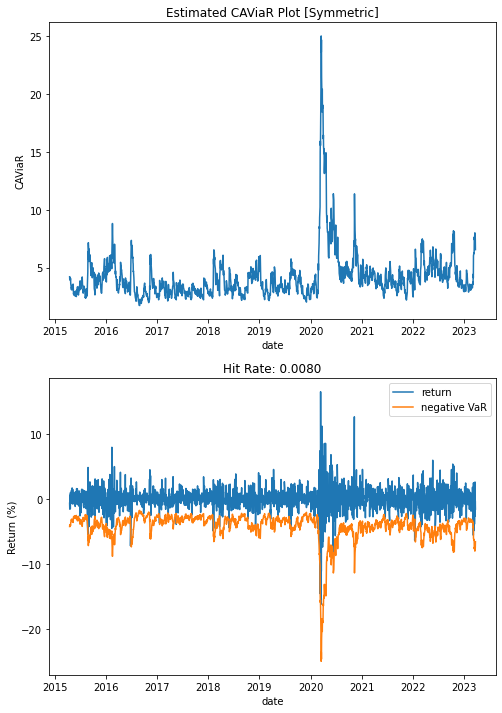

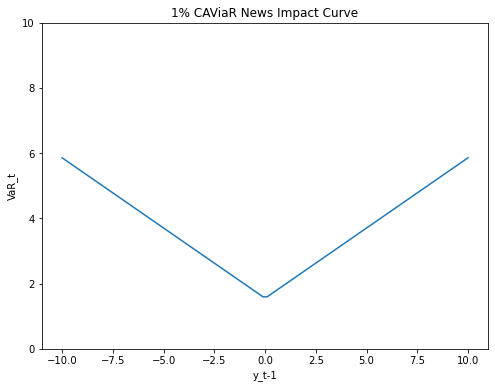

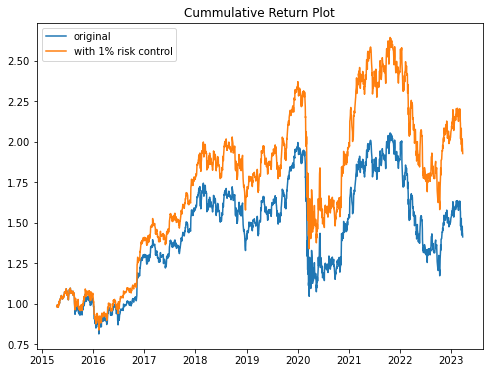

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -6446.180106030091
        x: [ 6.108e-02 -1.785e-01  8.274e-01 -4.330e-01]
      nit: 38
      jac: [ 2.775e+00  1.402e+01  5.346e+01 -2.449e+00]
     nfev: 630
     njev: 126
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.06110603165503181
Time taken(s): 5.33
symmetric mle 0.01 MSFT


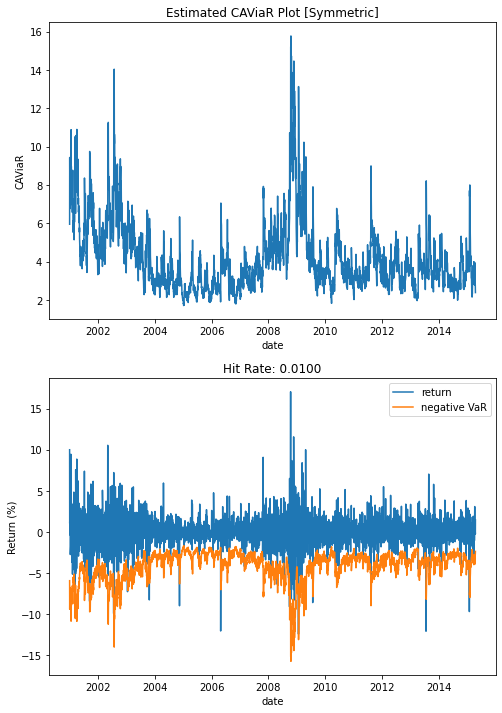

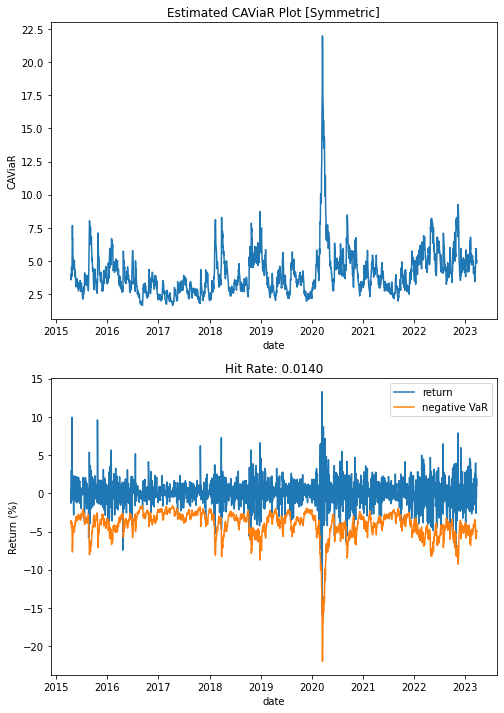

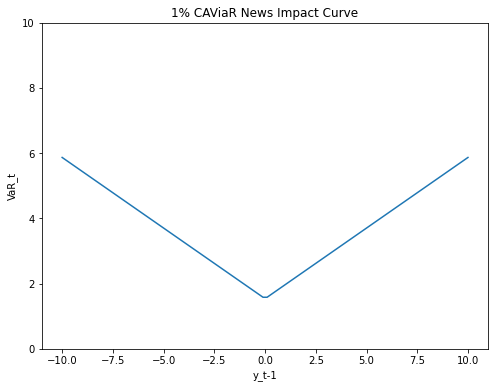

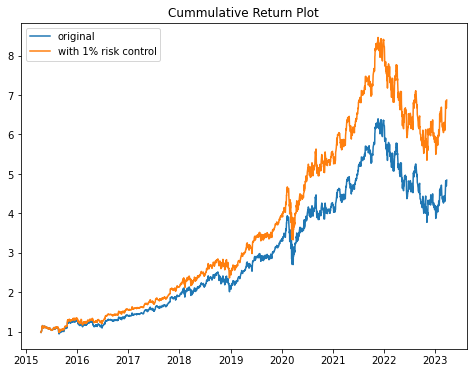

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -7422.509535319314
        x: [ 4.653e-02 -9.960e-02  8.837e-01 -3.105e-01]
      nit: 39
      jac: [-2.973e+00 -9.503e+01  5.018e+02 -5.727e+01]
     nfev: 505
     njev: 101
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.04665000964008886
Time taken(s): 4.26
symmetric mle 0.01 XOM


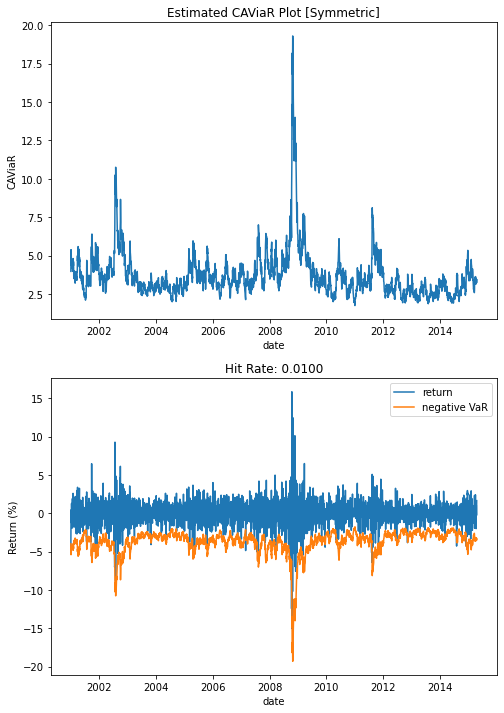

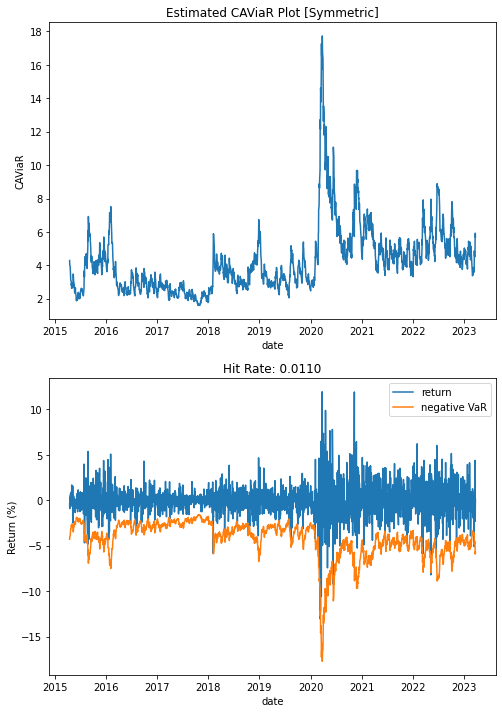

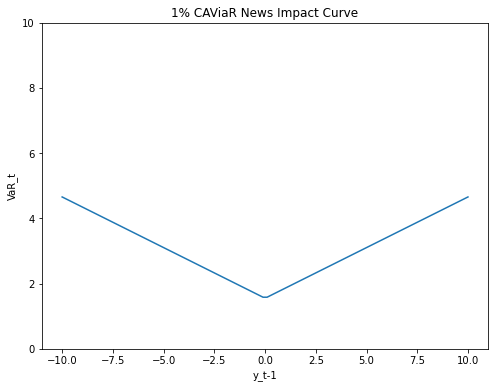

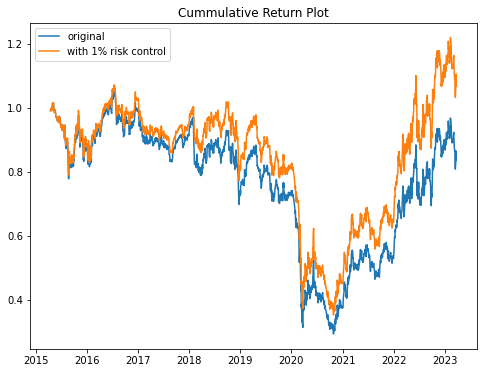

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -1304.131800317504
        x: [ 2.559e-01 -3.266e-02  9.443e-01 -9.208e-02]
      nit: 41
      jac: [ 2.472e+00  6.111e+01 -6.720e+01  1.511e+02]
     nfev: 440
     njev: 88
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.2559651945153808
Time taken(s): 3.67
symmetric mle 0.05 AAPL


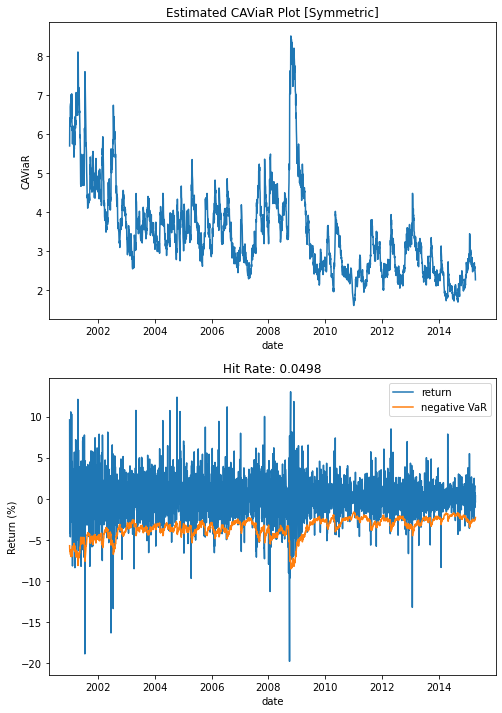

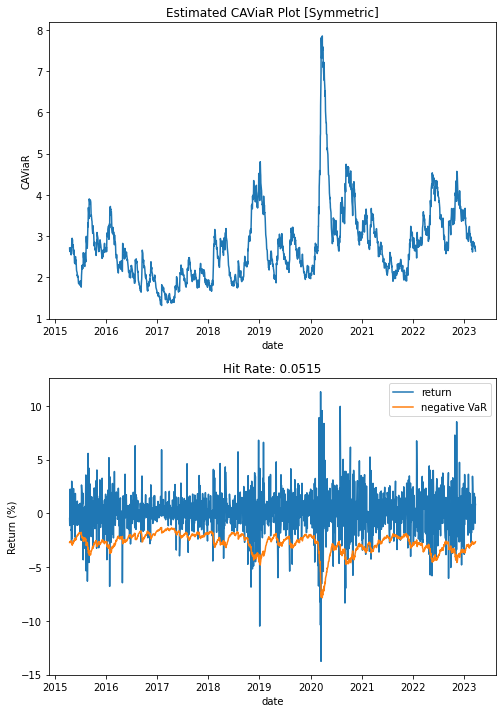

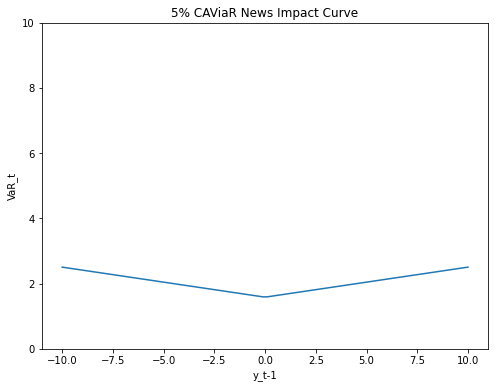

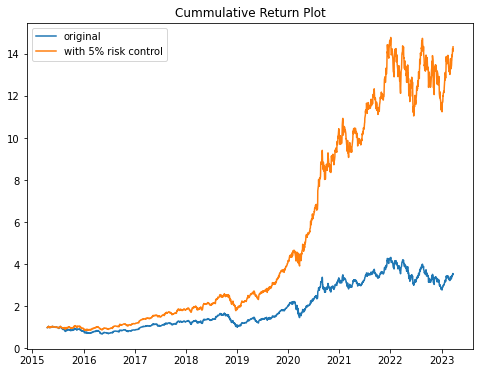

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -2407.9507985009095
        x: [ 1.881e-01 -2.062e-01  8.228e-01 -2.154e-01]
      nit: 30
      jac: [ 2.424e+00 -1.536e+01  8.866e+01 -1.924e+01]
     nfev: 365
     njev: 73
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.18809942194306808
Time taken(s): 3.28
symmetric mle 0.05 COKE


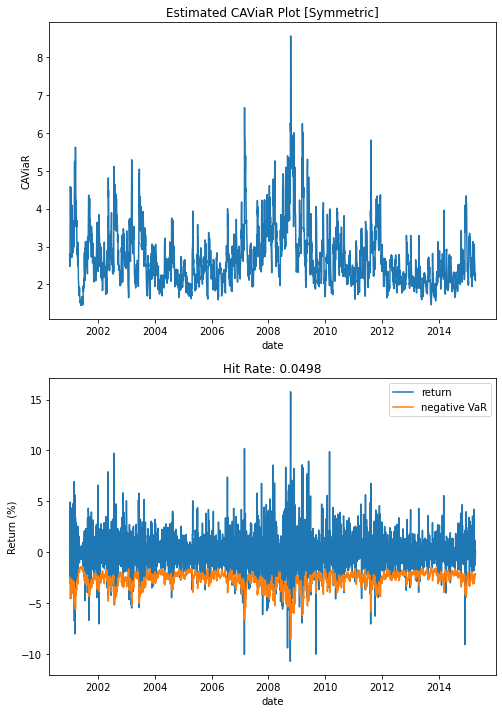

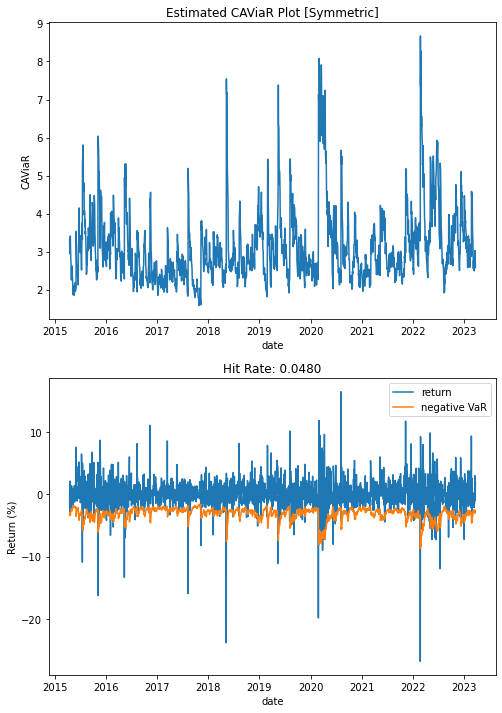

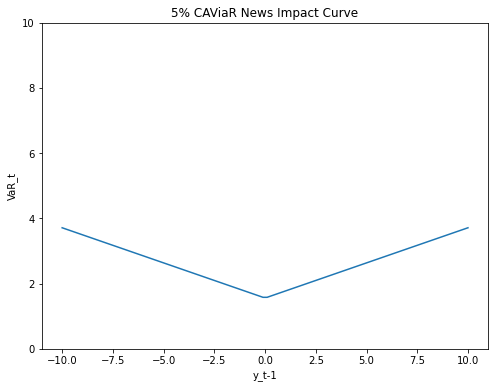

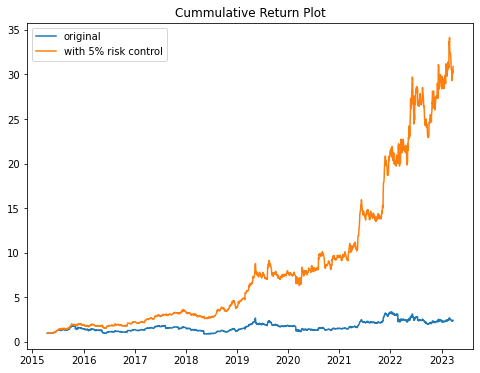

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -1585.4408381444796
        x: [ 2.365e-01 -2.531e-02  9.428e-01 -1.007e-01]
      nit: 48
      jac: [-3.960e-01  1.128e+02 -2.682e+02  1.259e+02]
     nfev: 550
     njev: 110
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.2367420173222569
Time taken(s): 4.69
symmetric mle 0.05 JPM


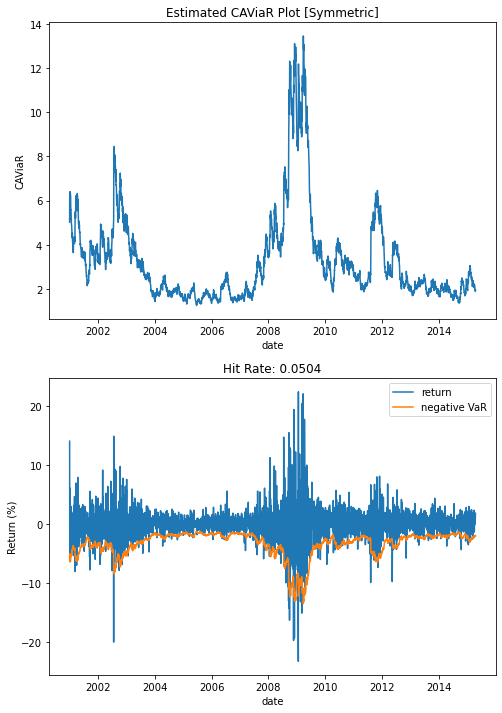

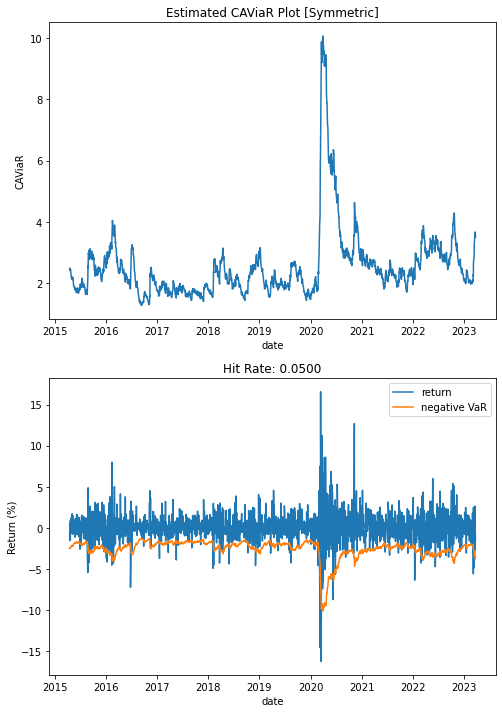

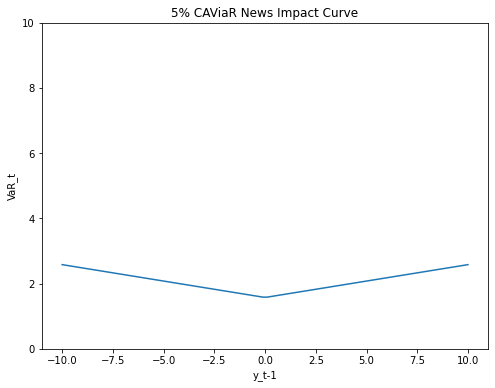

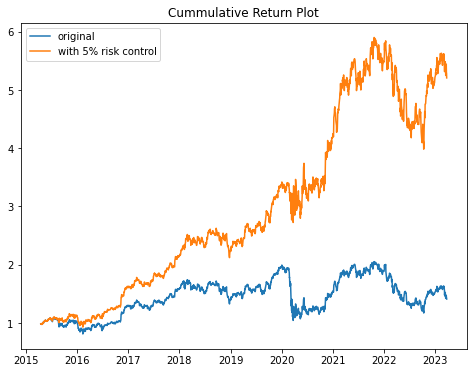

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -2406.1614969064567
        x: [ 1.882e-01 -2.355e-02  9.104e-01 -1.643e-01]
      nit: 29
      jac: [-3.100e+00  5.114e+01  5.054e+00  1.070e+02]
     nfev: 365
     njev: 73
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.1883472800879953
Time taken(s): 2.91
symmetric mle 0.05 MSFT


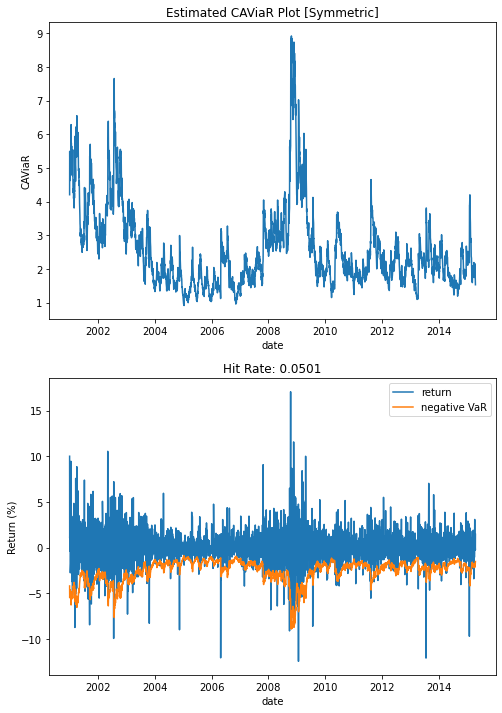

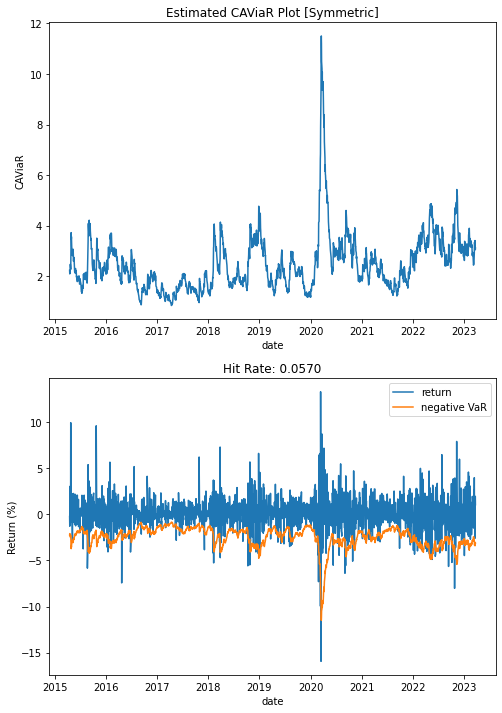

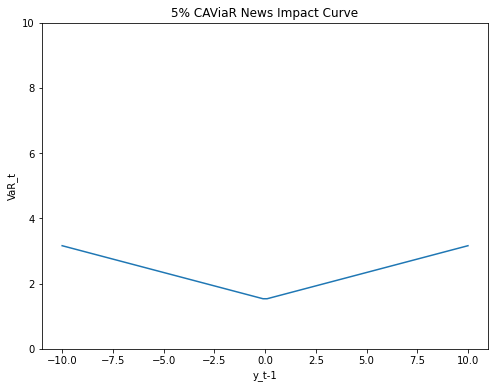

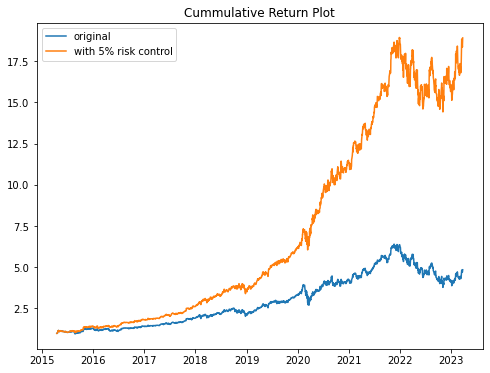

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -2919.192662066151
        x: [ 1.631e-01 -5.054e-02  8.794e-01 -2.188e-01]
      nit: 47
      jac: [-7.330e+00 -7.077e+00  1.574e+02 -2.421e+01]
     nfev: 495
     njev: 99
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.16357641903380185
Time taken(s): 4.32
symmetric mle 0.05 XOM


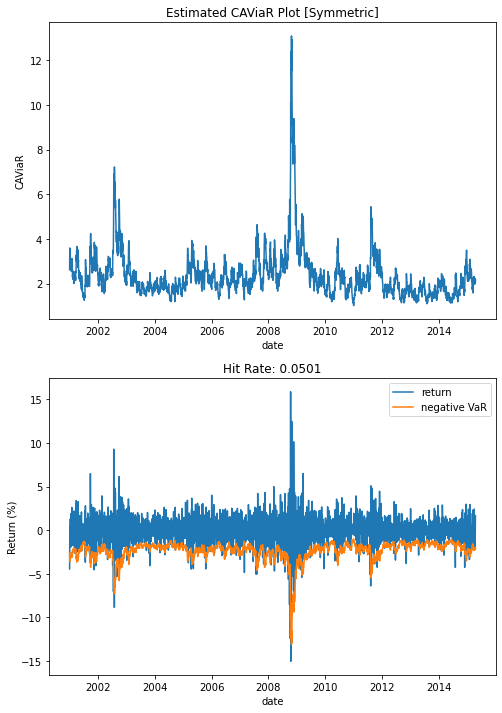

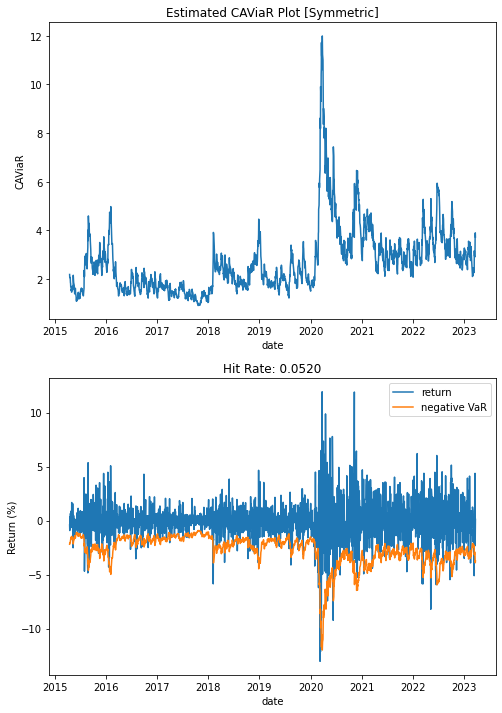

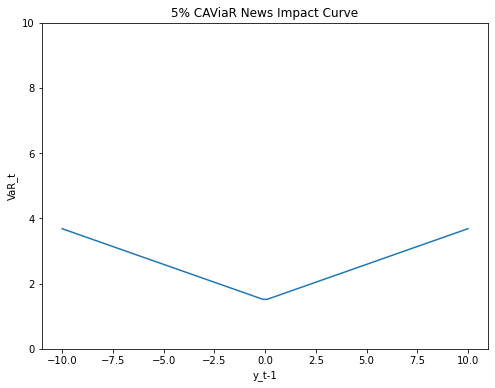

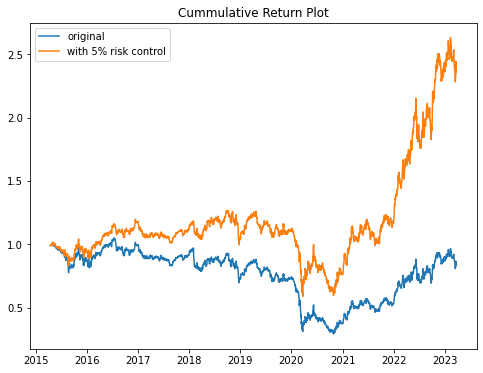

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.08156688999984045
Update 1: 0.08148371106946183
Update 2: 0.08148371105311716
when m = 2
Update 0: 0.08160697509450544
Update 1: 0.08138298104618405
Update 2: 0.08138293148709336
Update 3: 0.08138293148249007
when m = 3
Update 0: 0.08167159762257843
Update 1: 0.08150572802723749
Update 2: 0.08150572802723749
Final loss: 0.08138293148249007
Time taken(s): 9.70
igarch numeric 0.01 AAPL


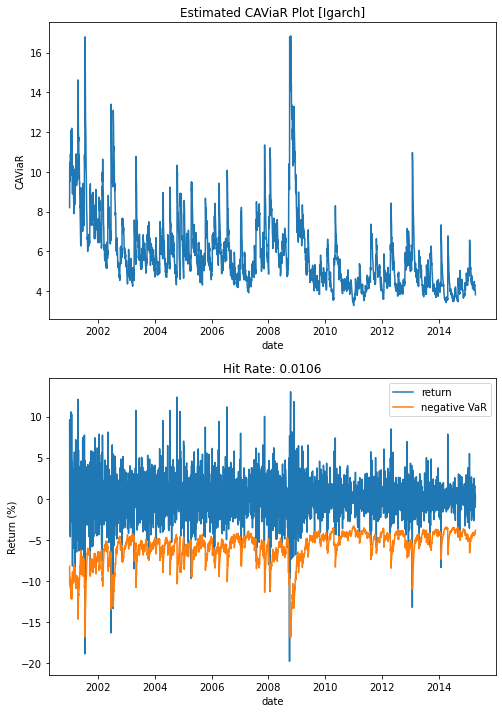

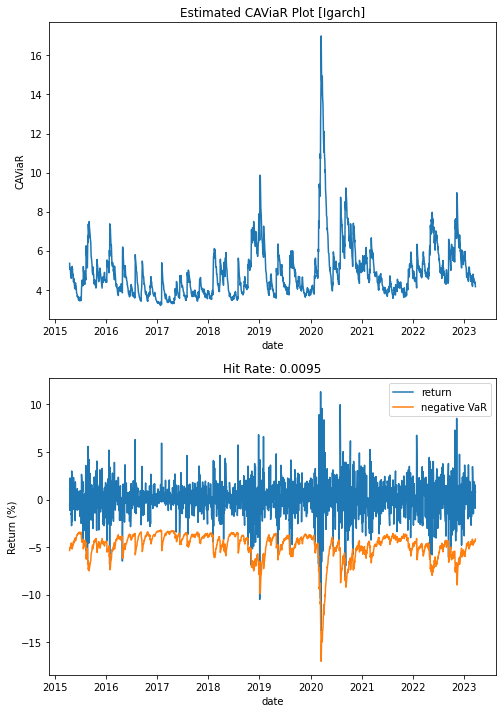

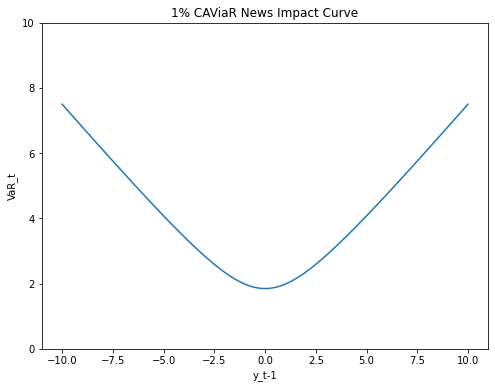

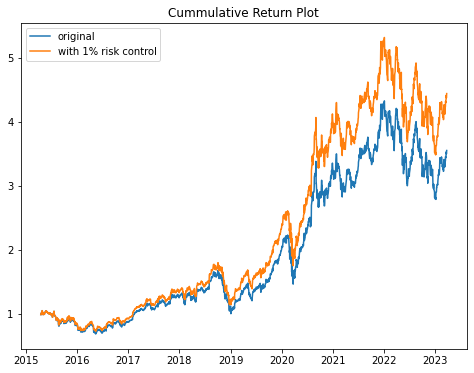

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.055819782525286965
Update 1: 0.05573747946780866
Update 2: 0.05573747902798451
Update 3: 0.055737478290794645
Update 4: 0.05573747826998734
when m = 2
Update 0: 0.055868964461151985
Update 1: 0.05579365185202074
Update 2: 0.055793651792563174
when m = 3
Update 0: 0.05588561862350249
Update 1: 0.055764086037088094
Update 2: 0.0557640860370881
Final loss: 0.05573747826998734
Time taken(s): 9.10
igarch numeric 0.01 COKE


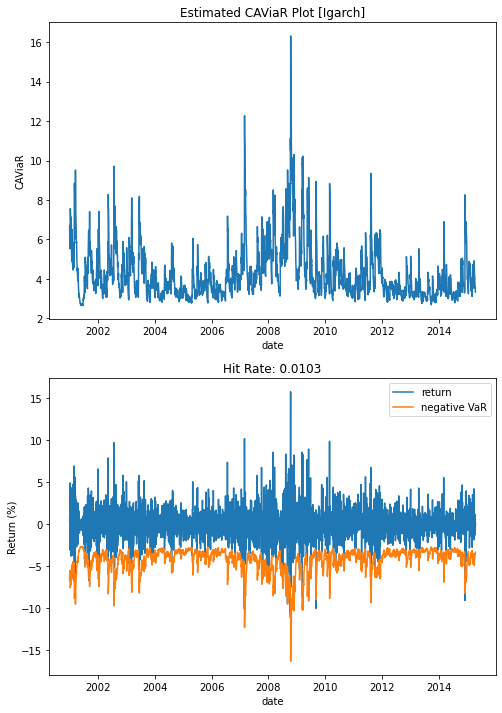

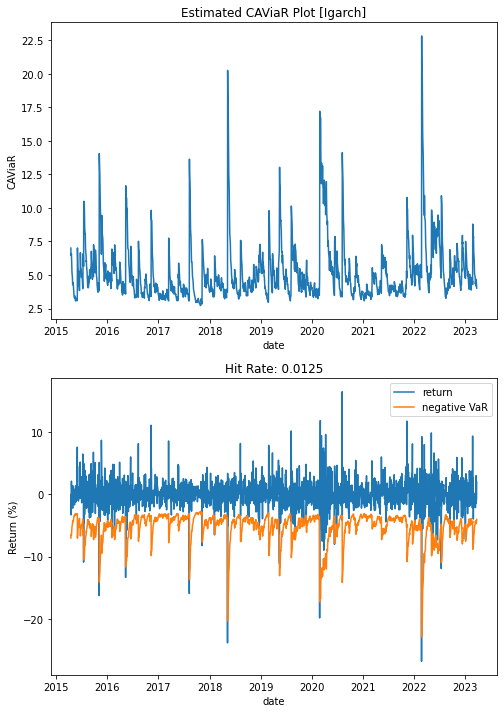

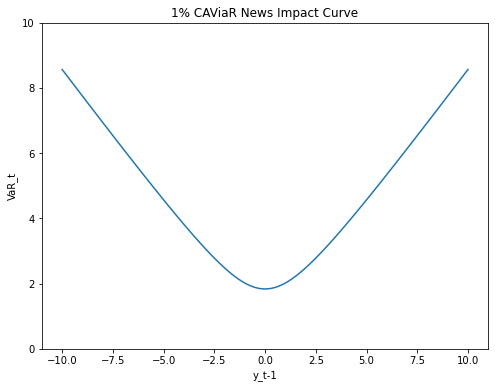

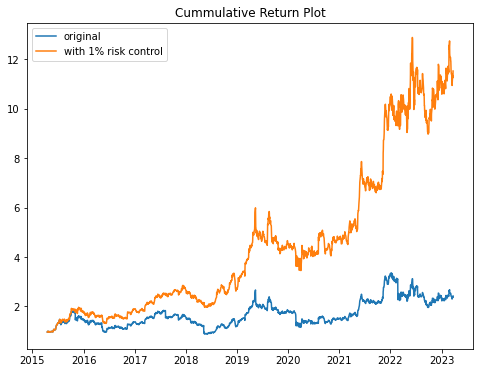

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.07241941559133903
Update 1: 0.07232995831115414
Update 2: 0.07232927178212895
Update 3: 0.07232926618430142
Update 4: 0.0723292661761961
when m = 2
Update 0: 0.07262136814347823
Update 1: 0.07238513805689266
Update 2: 0.07238513450494831
Update 3: 0.07238513450142399
when m = 3
Update 0: 0.0727085471111433
Update 1: 0.07269996742059966
Update 2: 0.07269996742059964
Final loss: 0.0723292661761961
Time taken(s): 10.73
igarch numeric 0.01 JPM


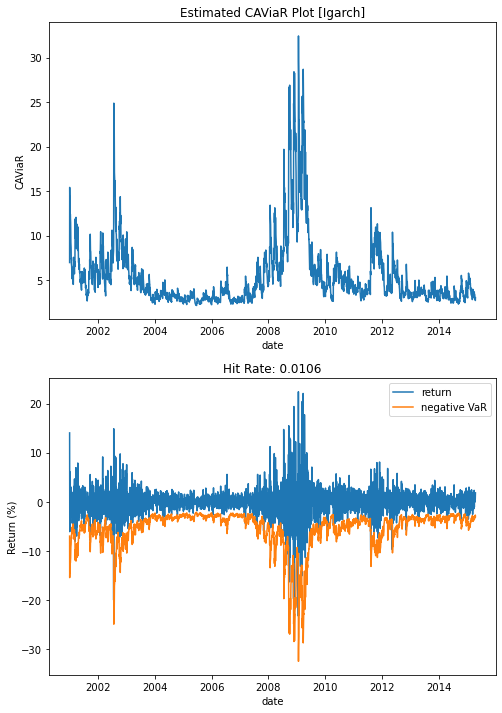

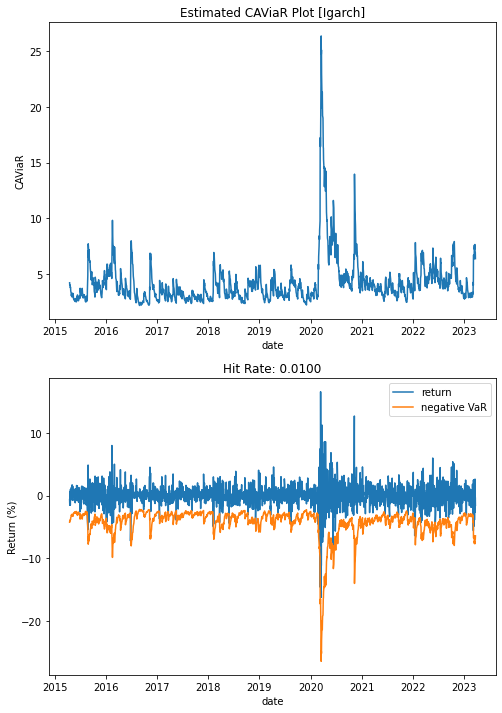

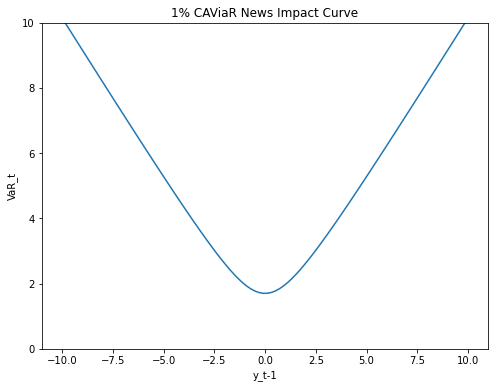

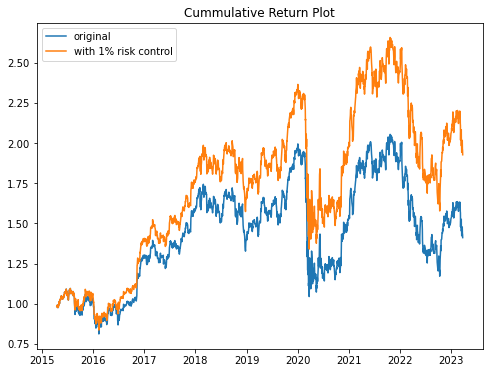

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.062033234383236636
Update 1: 0.06190105969011229
Update 2: 0.061901059677382
when m = 2
Update 0: 0.06205086421149325
Update 1: 0.06190108698479487
Update 2: 0.06190108691786247
when m = 3
Update 0: 0.06210506565095771
Update 1: 0.061923502650958855
Update 2: 0.06190681561219457
Update 3: 0.06190681561219457
Final loss: 0.061901059677382
Time taken(s): 10.92
igarch numeric 0.01 MSFT


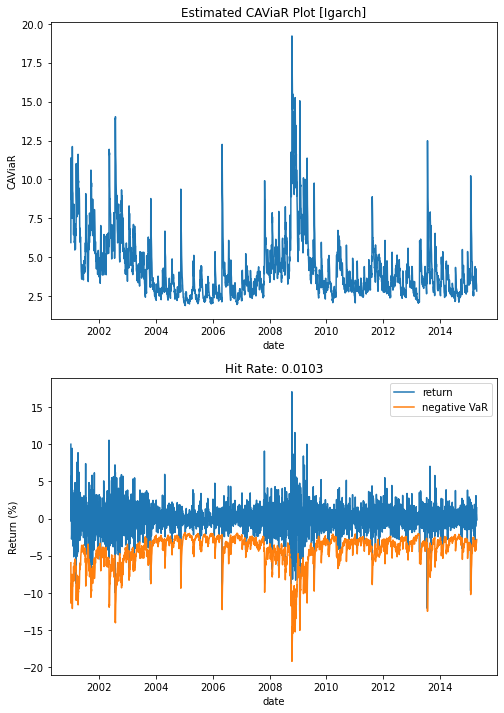

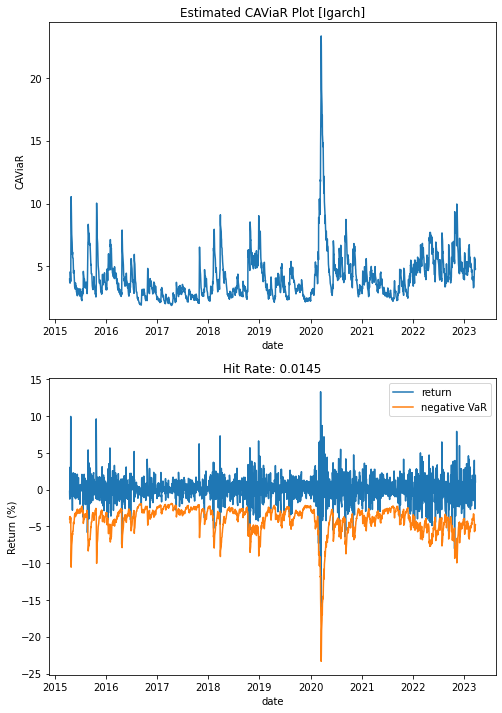

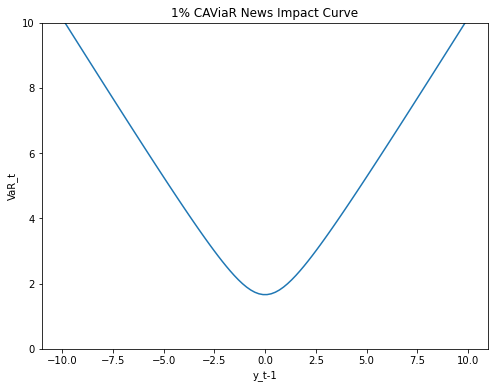

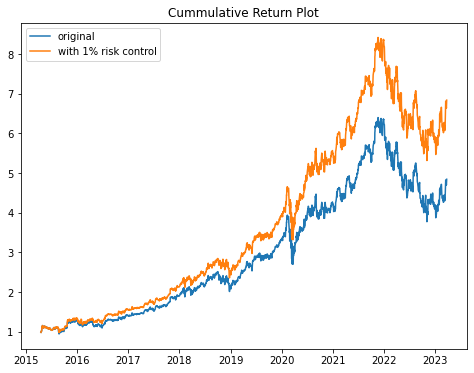

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.046480308309841345
Update 1: 0.046456863731053004
Update 2: 0.04645686372660306
when m = 2
Update 0: 0.04655919829022211
Update 1: 0.04640590140035126
Update 2: 0.046402764797882884
Update 3: 0.04640276207108366
Update 4: 0.04640276207108366
when m = 3
Update 0: 0.046654840312079095
Update 1: 0.0463107029824874
Update 2: 0.04630958706813735
Update 3: 0.04630958705930141
Final loss: 0.04630958705930141
Time taken(s): 12.14
igarch numeric 0.01 XOM


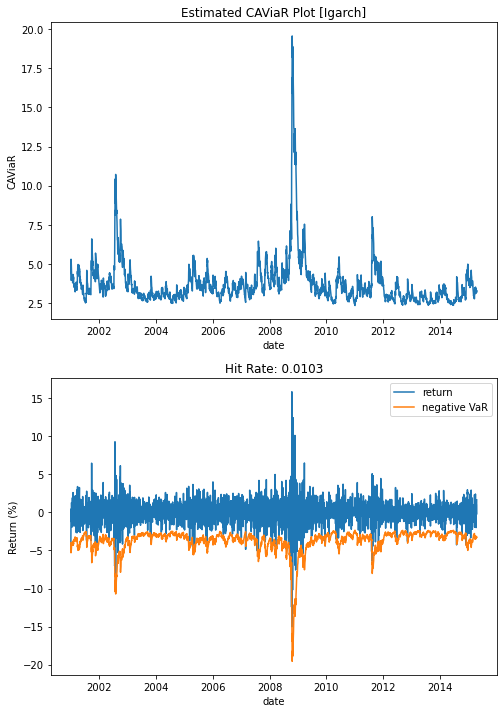

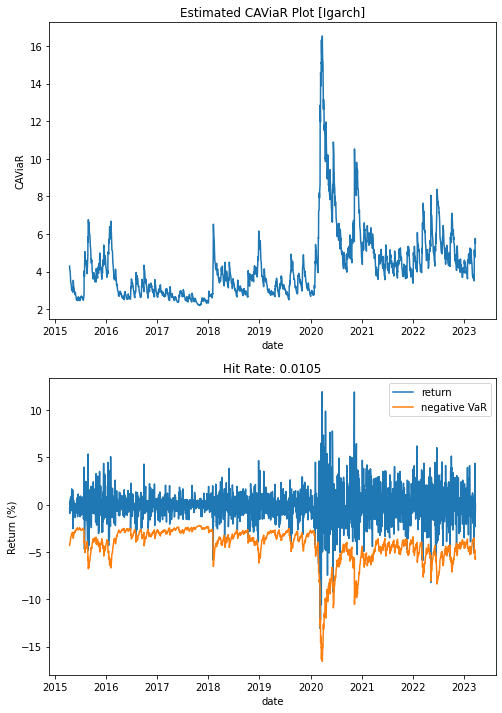

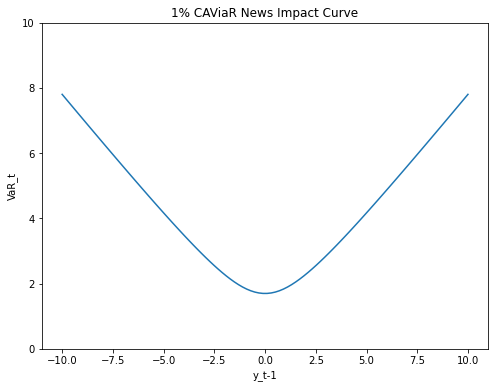

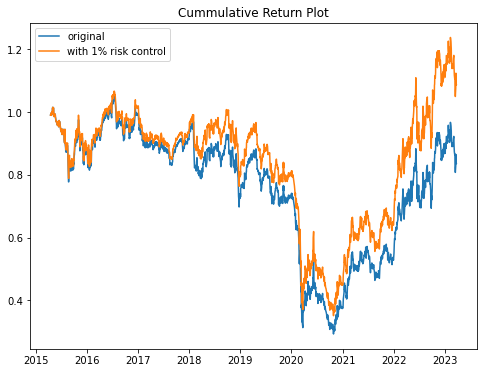

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.25953642559912293


D:\CAViaR-Project\caviar\_caviar_function.py:80: RuntimeWarning: invalid value encountered in double_scalars
  VaR[t] = (b1 + b2 * VaR[t - 1] ** 2 + b3 * returns[t - 1] ** 2) ** 0.5


Update 1: 0.25793041570213715
Update 2: 0.2579304157021371
when m = 2
Update 0: 0.26000405156133216
Update 1: 0.25792155468301065
Update 2: 0.25792155460368016
when m = 3
Update 0: 0.2602523057430142
Update 1: 0.25792160065514946
Update 2: 0.2579215987391317
Update 3: 0.257921583892017
Update 4: 0.25792158333374626
Update 5: 0.25792158333374615
Final loss: 0.25792155460368016
Time taken(s): 13.21
igarch numeric 0.05 AAPL


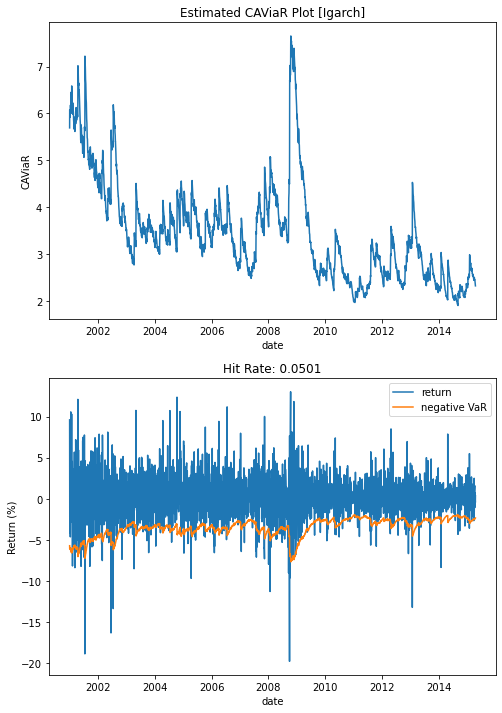

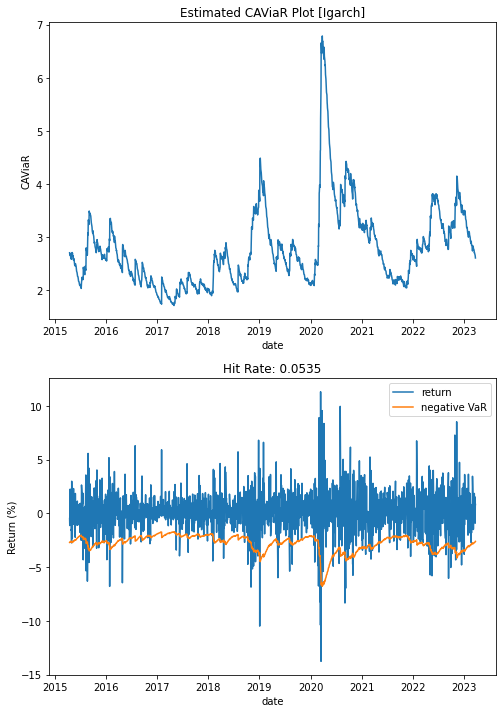

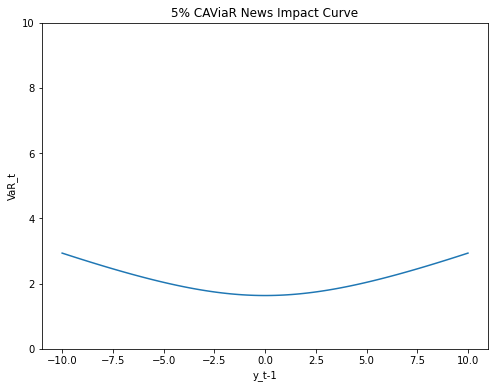

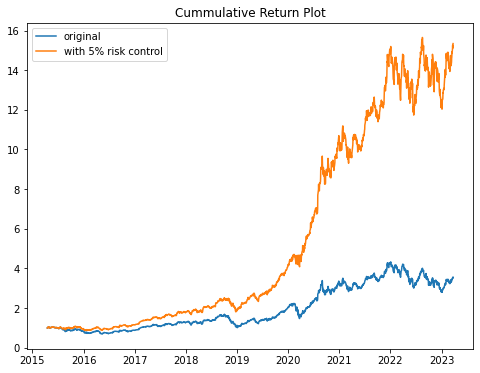

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.18821239671415255
Update 1: 0.18810585226439888
Update 2: 0.1881035914387476
Update 3: 0.18810359143739336
when m = 2
Update 0: 0.1882349293973406
Update 1: 0.18810896031537122
Update 2: 0.18810361204762524
Update 3: 0.1881035499479286
Update 4: 0.18810354994792855
when m = 3
Update 0: 0.18828368914035107
Update 1: 0.1881038205191628
Update 2: 0.1881038204601515
Final loss: 0.18810354994792855
Time taken(s): 12.21
igarch numeric 0.05 COKE


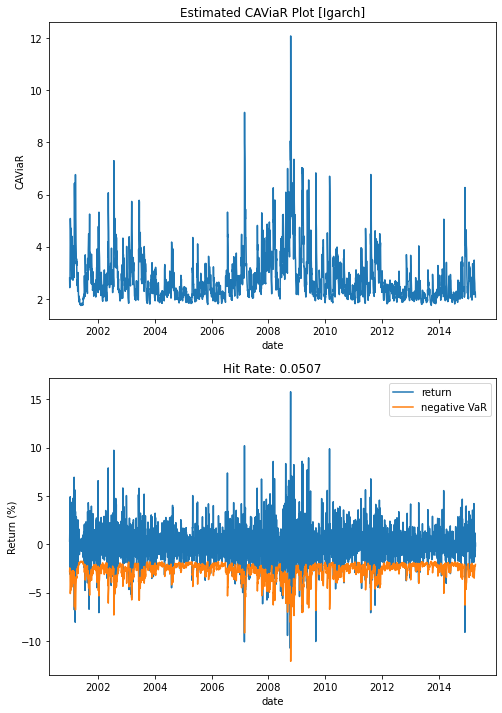

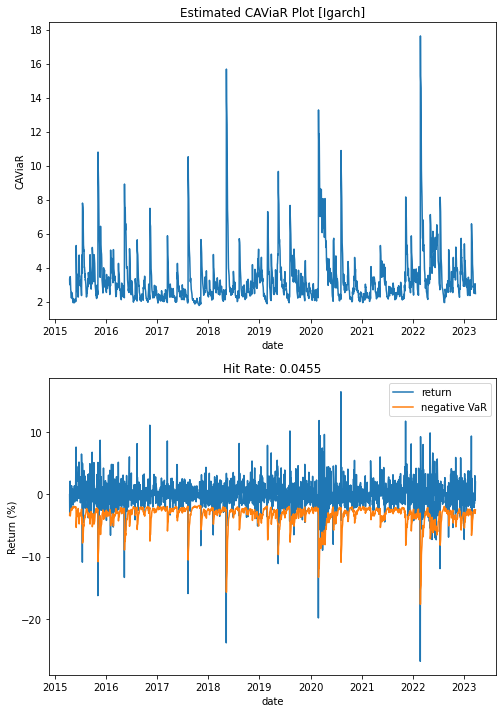

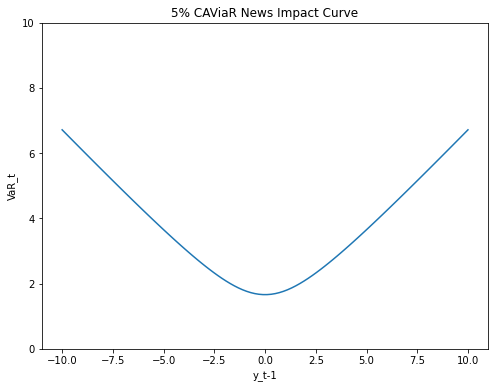

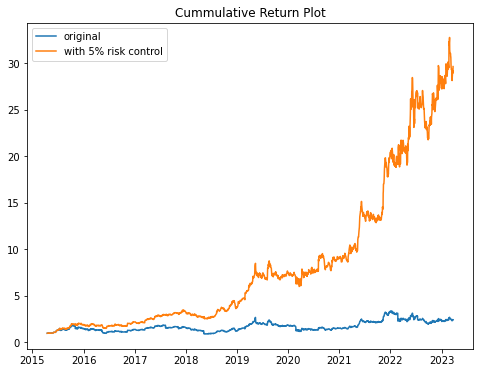

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.23793717378525298
Update 1: 0.237450407370537
Update 2: 0.23745040737007805
when m = 2
Update 0: 0.2383793833846997
Update 1: 0.23744902727752637
Update 2: 0.23744902720578207
when m = 3
Update 0: 0.23950897867772947
Update 1: 0.23744906398244361
Update 2: 0.23744906398205934
Final loss: 0.23744902720578207
Time taken(s): 9.88
igarch numeric 0.05 JPM


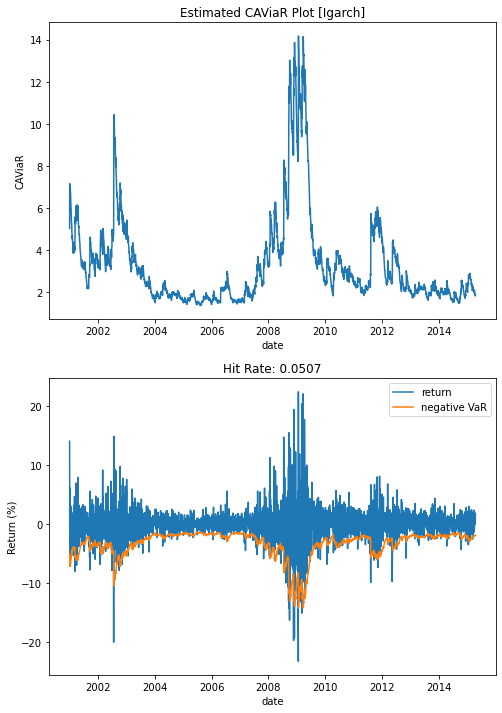

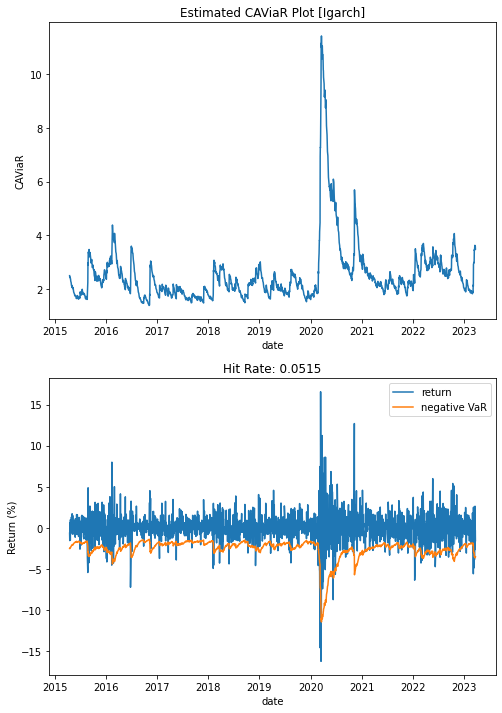

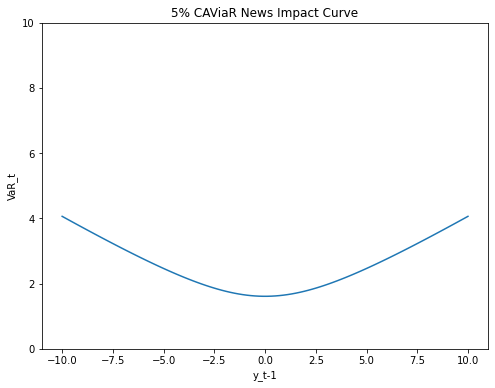

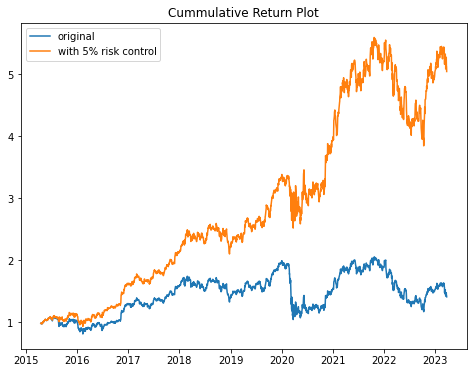

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.19232356114882
Update 1: 0.19055153166173353
Update 2: 0.19055144302648988
Update 3: 0.1905514430264899
when m = 2
Update 0: 0.19268784906891198


D:\CAViaR-Project\caviar\_caviar_function.py:80: RuntimeWarning: invalid value encountered in double_scalars
  VaR[t] = (b1 + b2 * VaR[t - 1] ** 2 + b3 * returns[t - 1] ** 2) ** 0.5


Update 1: 0.19054873936209052
Update 2: 0.19054873935827601
when m = 3
Update 0: 0.1929925500688246
Update 1: 0.19054787362560746
Update 2: 0.1905477889353199
Update 3: 0.1905477889353199
Final loss: 0.1905477889353199
Time taken(s): 12.70
igarch numeric 0.05 MSFT


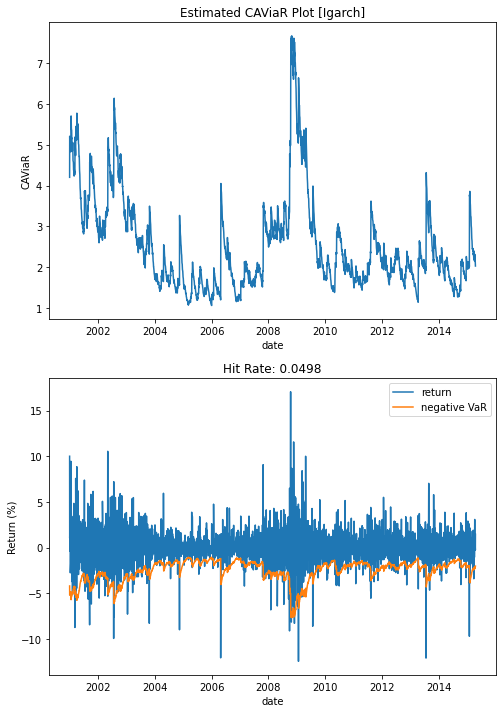

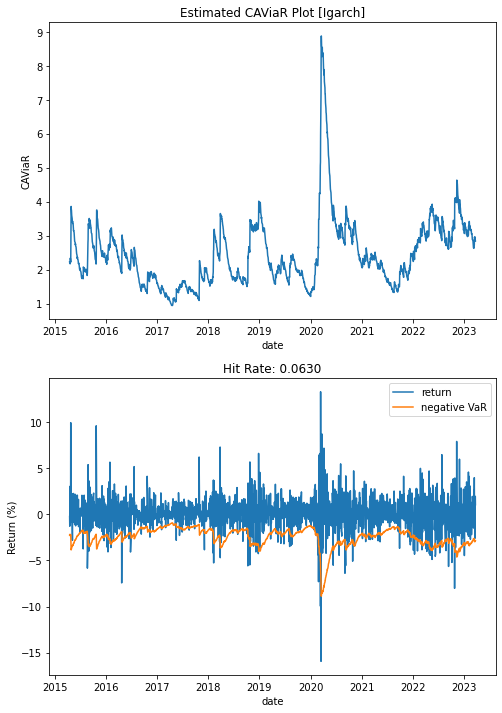

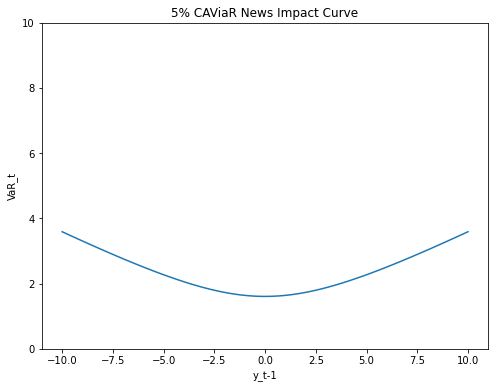

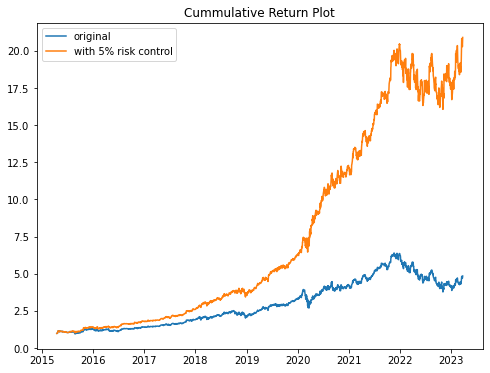

-------------------------------------------------------------------
Generating 3 best initial betas out of 1000...
Optimizing...
when m = 1
Update 0: 0.16318304466315042
Update 1: 0.1626662612454018
Update 2: 0.16266624741521435
Update 3: 0.16266624741521435
when m = 2
Update 0: 0.1631916582126642


D:\CAViaR-Project\caviar\_caviar_function.py:80: RuntimeWarning: invalid value encountered in double_scalars
  VaR[t] = (b1 + b2 * VaR[t - 1] ** 2 + b3 * returns[t - 1] ** 2) ** 0.5


Update 1: 0.16266884511934768
Update 2: 0.16266884511934776
when m = 3
Update 0: 0.16349033731827659
Update 1: 0.16266760956558582
Update 2: 0.16266760956558582
Final loss: 0.16266624741521435
Time taken(s): 10.30
igarch numeric 0.05 XOM


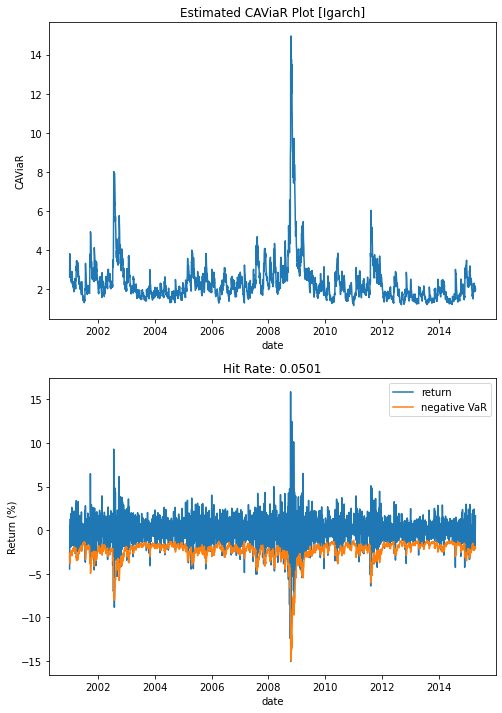

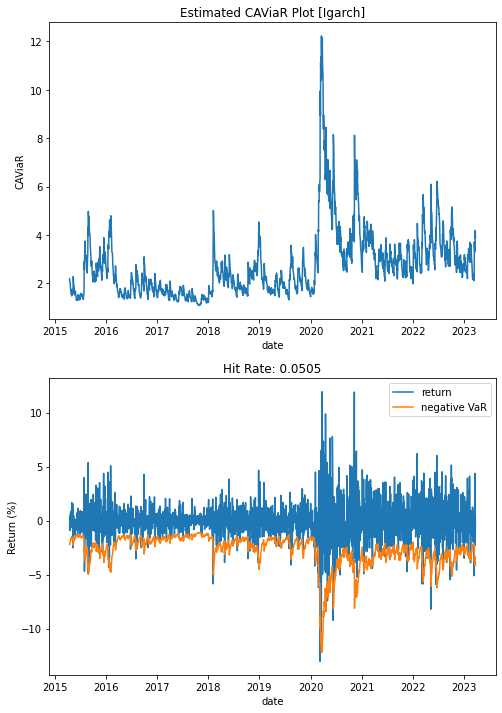

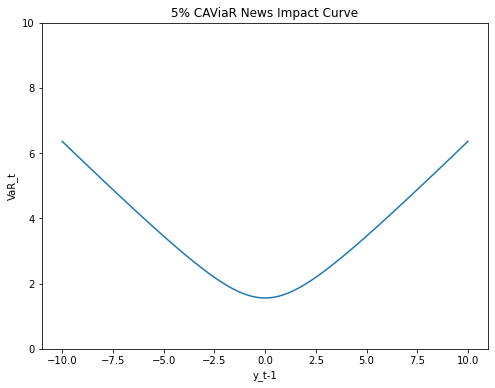

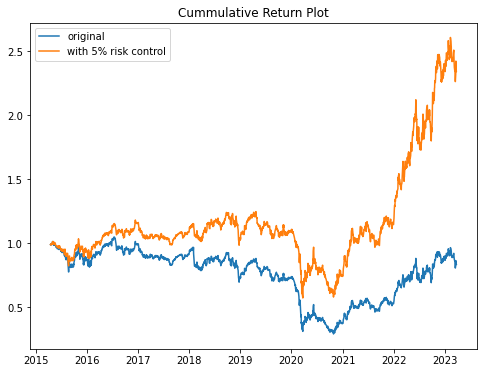

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -5416.7218717065025
        x: [ 8.137e-02  1.000e+00  8.901e-01  5.256e-01]
      nit: 29
      jac: [ 1.997e+00 -2.704e+01 -1.525e+02 -2.603e+01]
     nfev: 375
     njev: 75
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.08138980417921823
Time taken(s): 4.12
igarch mle 0.01 AAPL


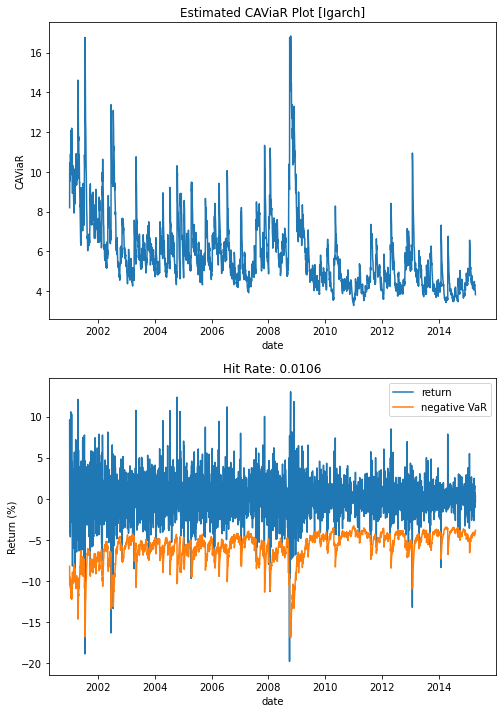

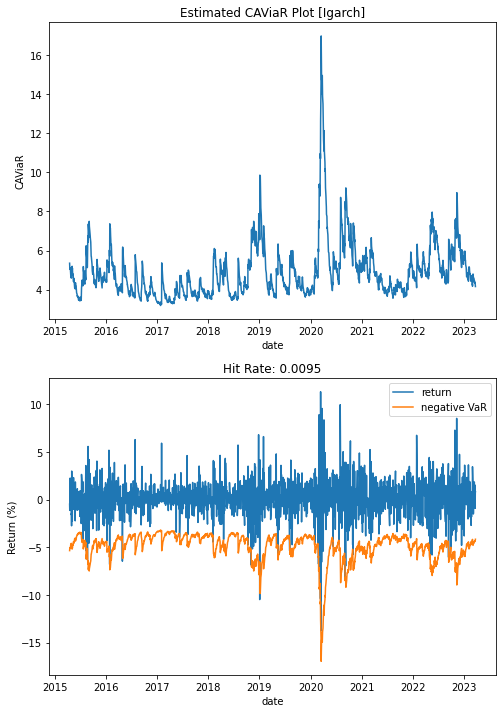

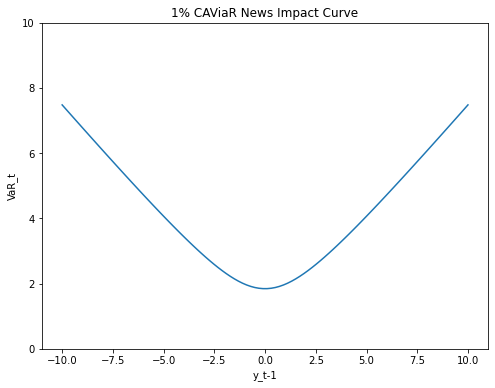

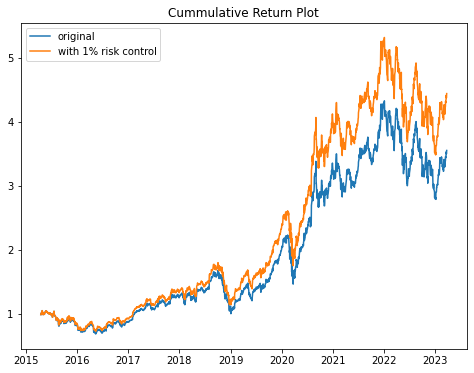

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -6771.6328636784
        x: [ 5.573e-02  9.092e-01  8.349e-01  7.280e-01]
      nit: 21
      jac: [-6.110e+01 -2.289e+01 -2.369e+00 -4.622e-01]
     nfev: 350
     njev: 70
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.055789139195901935
Time taken(s): 3.87
igarch mle 0.01 COKE


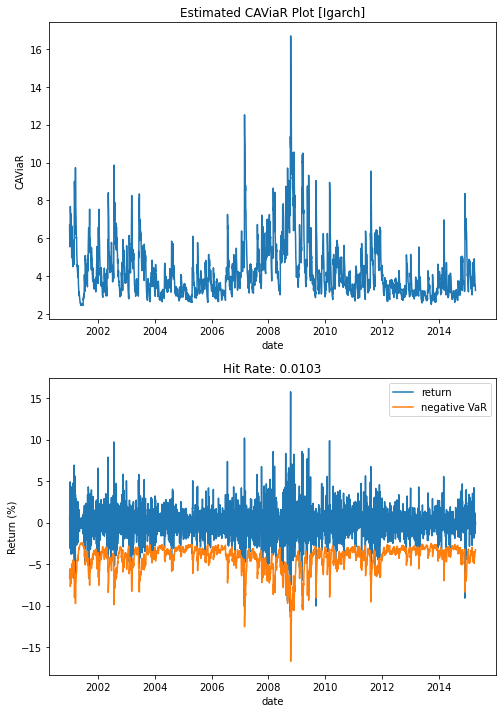

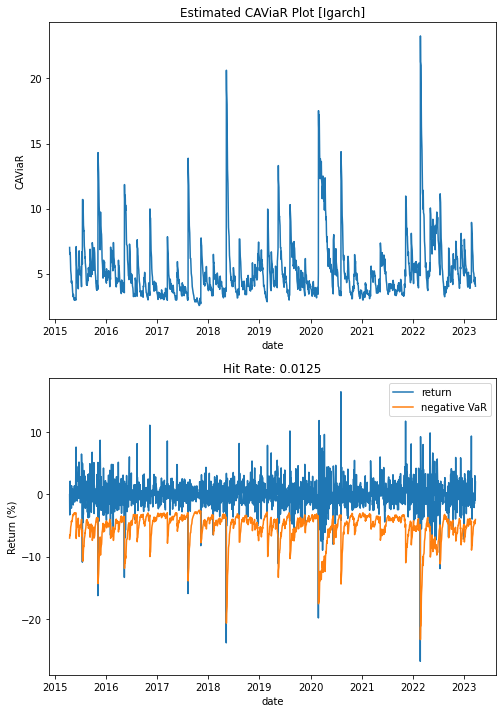

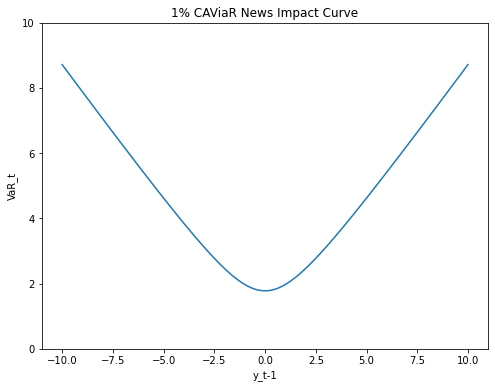

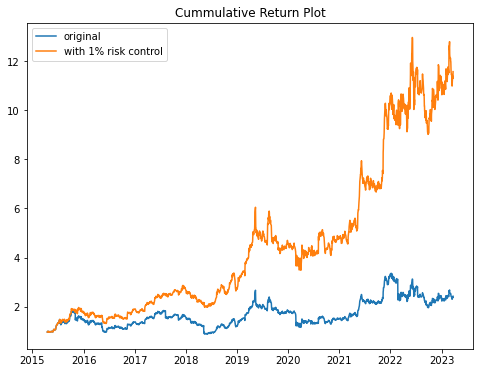

-------------------------------------------------------------------


D:\CAViaR-Project\caviar\_caviar_function.py:80: RuntimeWarning: invalid value encountered in double_scalars
  VaR[t] = (b1 + b2 * VaR[t - 1] ** 2 + b3 * returns[t - 1] ** 2) ** 0.5


Fail to converge after 5 times. Start with new param again.
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -5832.4578784877285
        x: [ 7.244e-02  8.637e-01  8.326e-01  9.081e-01]
      nit: 9
      jac: [-1.840e+01  1.750e+01 -6.998e+01 -1.535e+02]
     nfev: 225
     njev: 45
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.0725041085913492
Time taken(s): 17.53
igarch mle 0.01 JPM


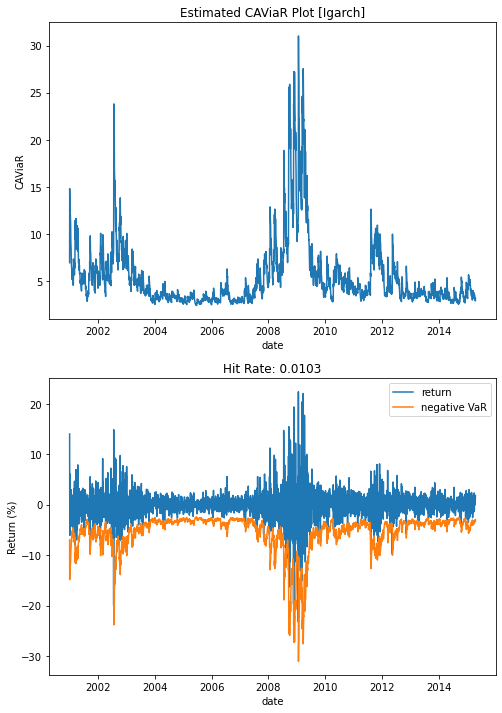

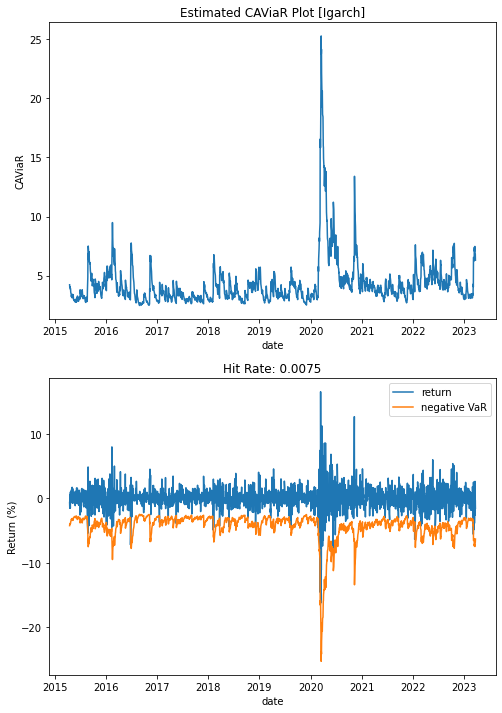

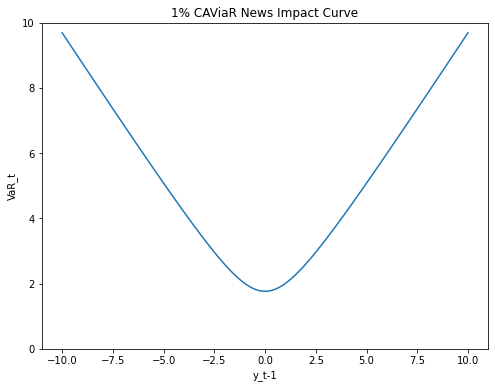

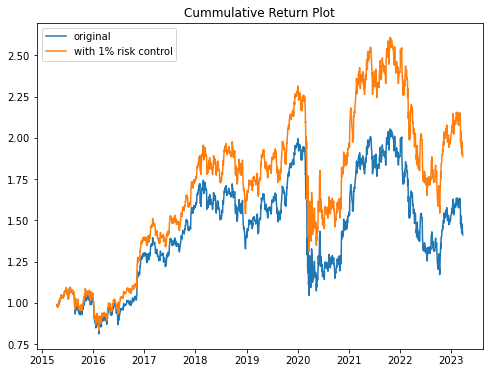

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -6398.443991202607
        x: [ 6.194e-02  4.752e-01  8.331e-01  9.387e-01]
      nit: 32
      jac: [ 3.678e+01 -2.740e+01 -1.867e+02 -8.047e+01]
     nfev: 400
     njev: 80
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.061923375726884056
Time taken(s): 4.39
igarch mle 0.01 MSFT


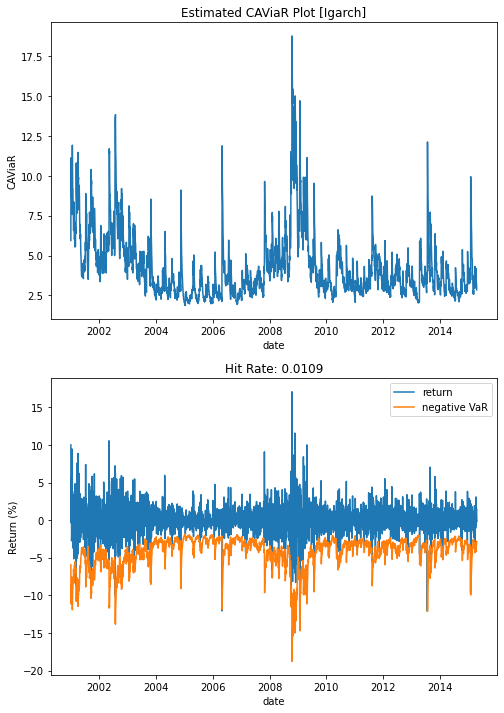

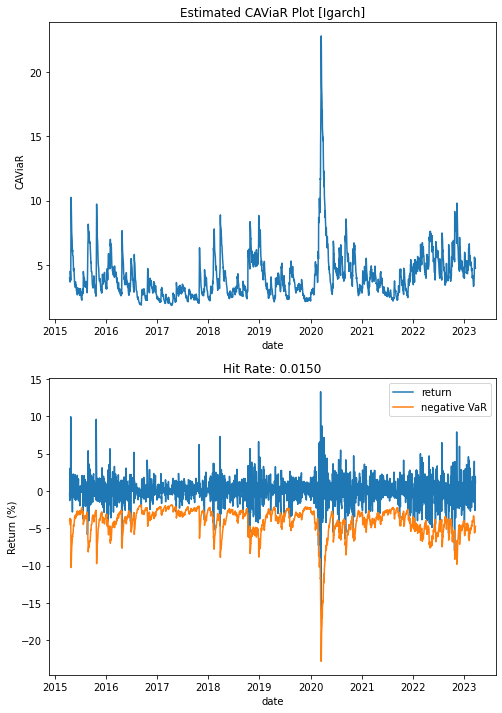

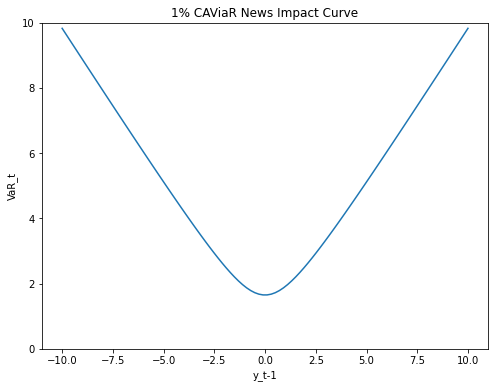

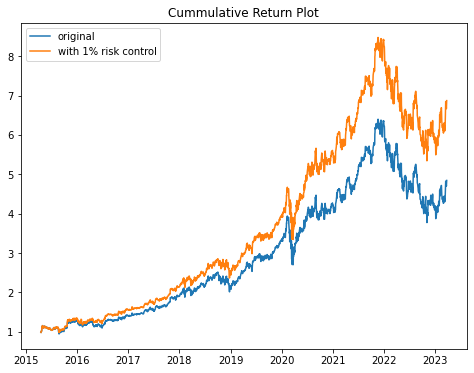

-------------------------------------------------------------------


D:\CAViaR-Project\caviar\_caviar_function.py:80: RuntimeWarning: invalid value encountered in double_scalars
  VaR[t] = (b1 + b2 * VaR[t - 1] ** 2 + b3 * returns[t - 1] ** 2) ** 0.5


Fail to converge after 5 times. Start with new param again.
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -7448.922349023944
        x: [ 4.628e-02  4.988e-01  8.824e-01  5.892e-01]
      nit: 46
      jac: [ 1.391e+02  1.927e+01  5.101e+02  1.138e+02]
     nfev: 570
     njev: 114
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.04630891365850402
Time taken(s): 8.18
igarch mle 0.01 XOM


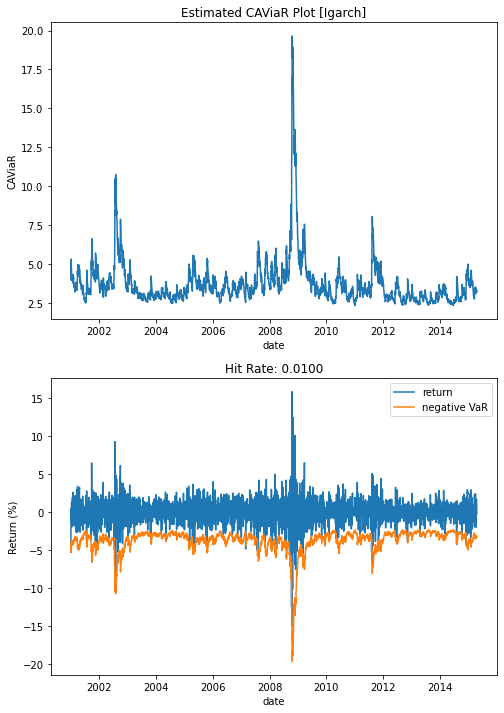

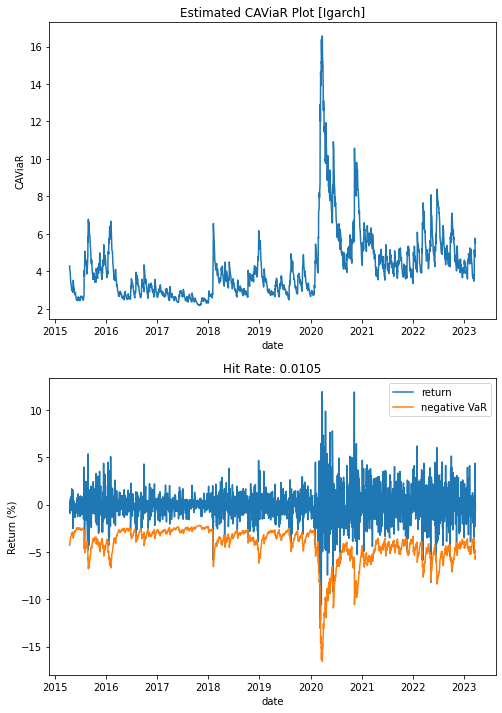

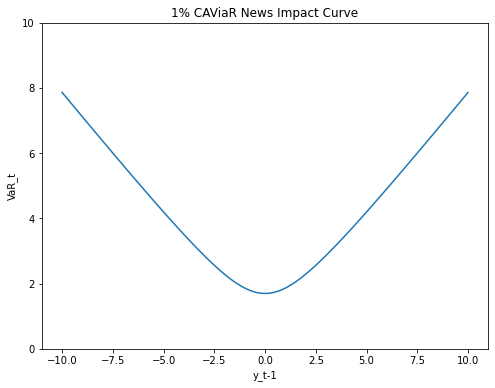

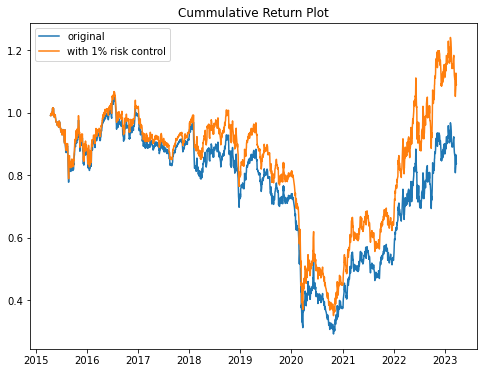

-------------------------------------------------------------------


D:\CAViaR-Project\caviar\_caviar_function.py:80: RuntimeWarning: invalid value encountered in double_scalars
  VaR[t] = (b1 + b2 * VaR[t - 1] ** 2 + b3 * returns[t - 1] ** 2) ** 0.5


Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -1276.774918598886
        x: [ 2.578e-01  5.886e-02  9.675e-01  5.948e-02]
      nit: 61
      jac: [ 3.049e-02  1.818e+00  2.023e+02  9.814e+01]
     nfev: 775
     njev: 155
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.257921551546975
Time taken(s): 21.83
igarch mle 0.05 AAPL


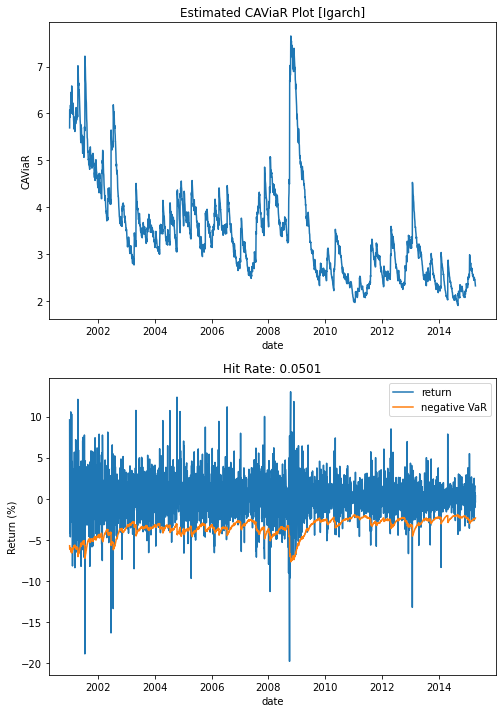

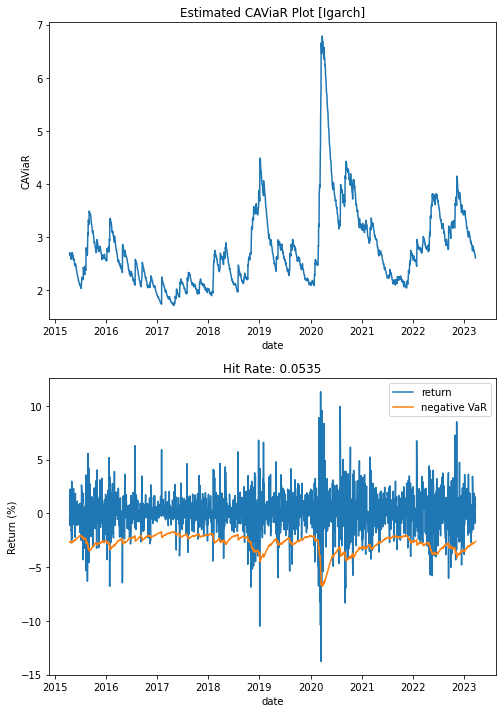

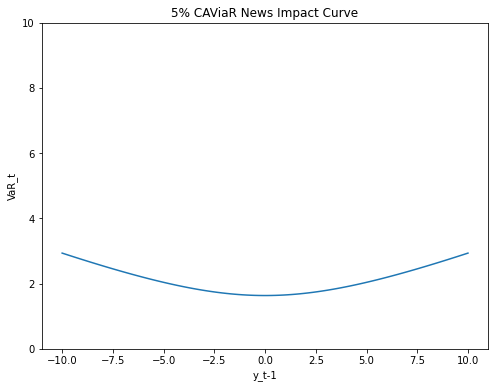

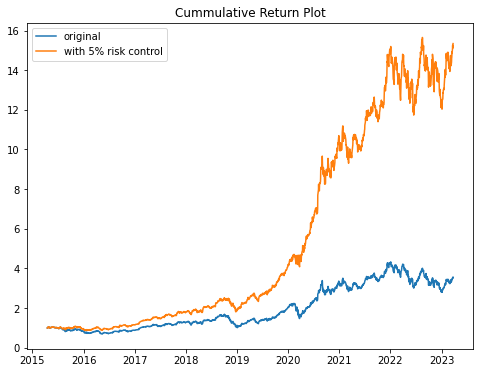

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -2407.8739925698674
        x: [ 1.882e-01  7.422e-01  7.488e-01  4.236e-01]
      nit: 30
      jac: [ 5.898e+00  1.621e+00  6.341e+01  1.721e+01]
     nfev: 325
     njev: 65
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.18810343785537548
Time taken(s): 3.66
igarch mle 0.05 COKE


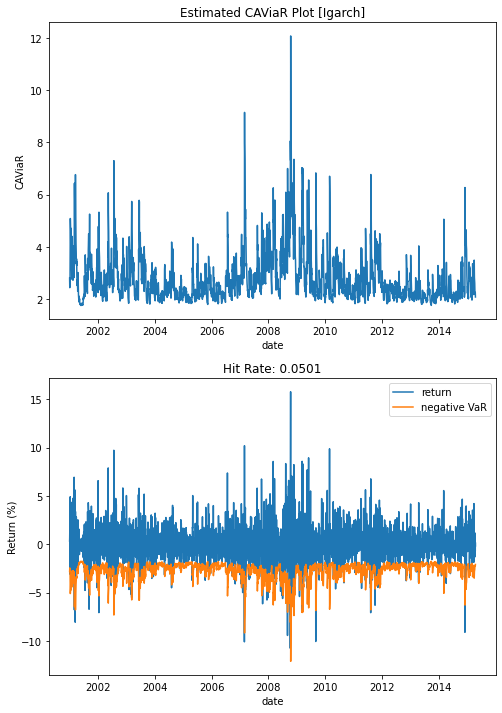

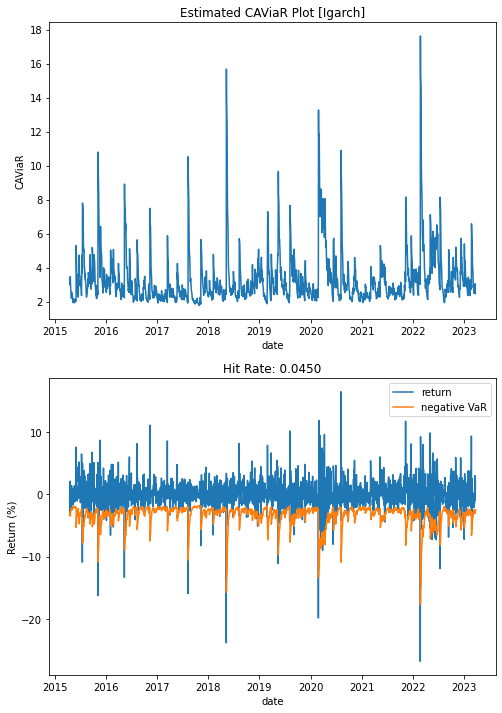

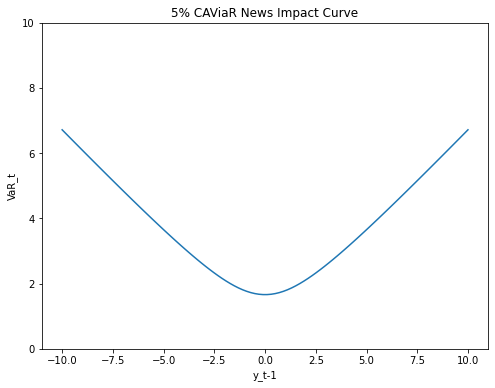

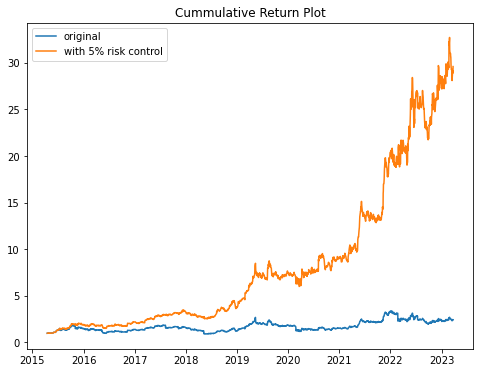

-------------------------------------------------------------------


D:\CAViaR-Project\caviar\_caviar_function.py:80: RuntimeWarning: invalid value encountered in double_scalars
  VaR[t] = (b1 + b2 * VaR[t - 1] ** 2 + b3 * returns[t - 1] ** 2) ** 0.5


Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -1574.7230226851825
        x: [ 2.373e-01  7.208e-02  9.343e-01  1.392e-01]
      nit: 27
      jac: [ 2.826e+00 -9.537e-01 -7.656e+01 -4.152e+01]
     nfev: 240
     njev: 48
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.23744906090439072
Time taken(s): 12.41
igarch mle 0.05 JPM


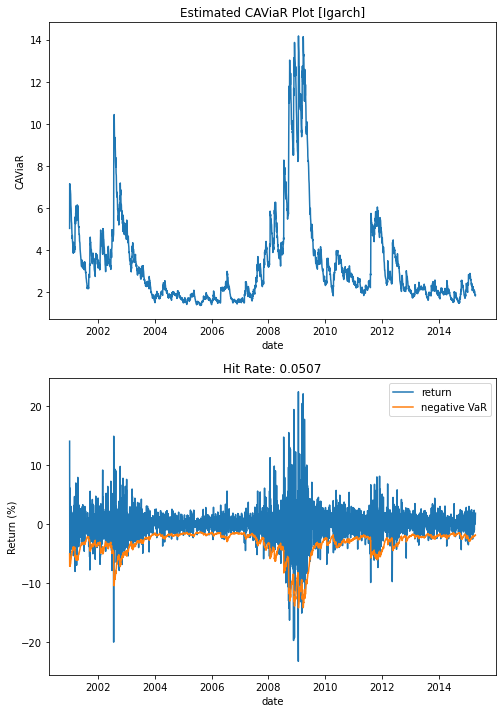

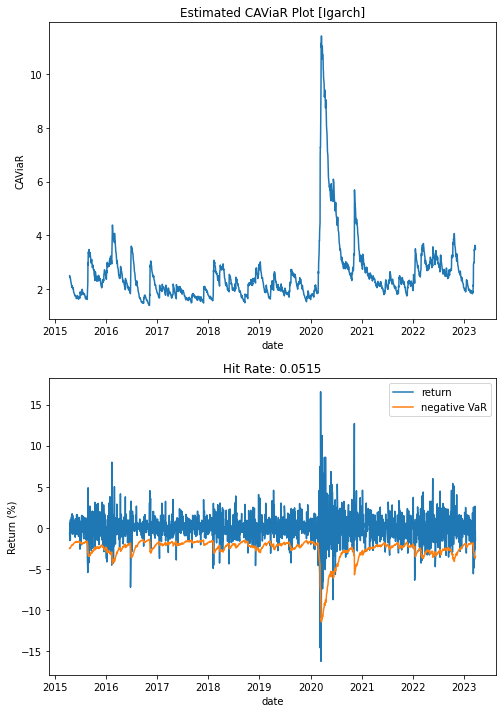

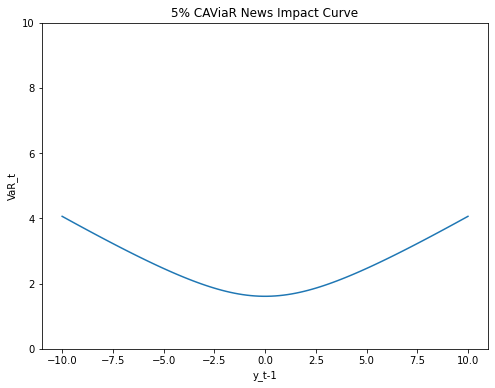

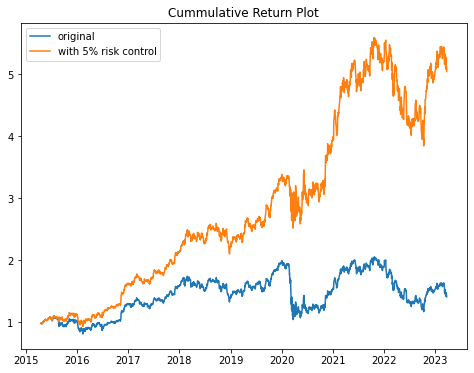

-------------------------------------------------------------------


D:\CAViaR-Project\caviar\_caviar_function.py:80: RuntimeWarning: invalid value encountered in double_scalars
  VaR[t] = (b1 + b2 * VaR[t - 1] ** 2 + b3 * returns[t - 1] ** 2) ** 0.5


Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
Fail to converge after 5 times. Start with new param again.
  message: CONVERGENCE: REL_REDUCTION_OF

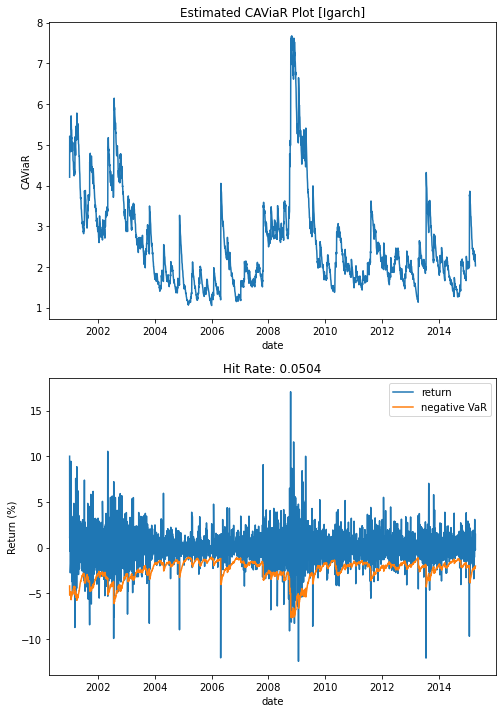

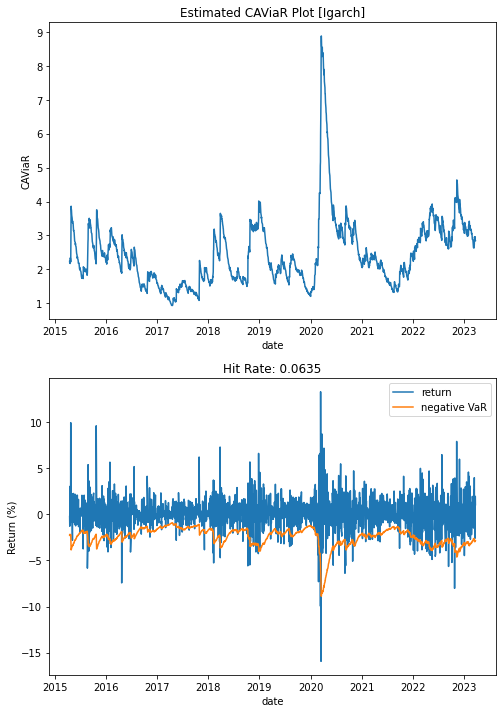

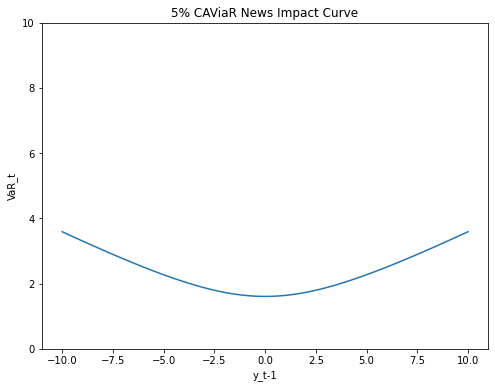

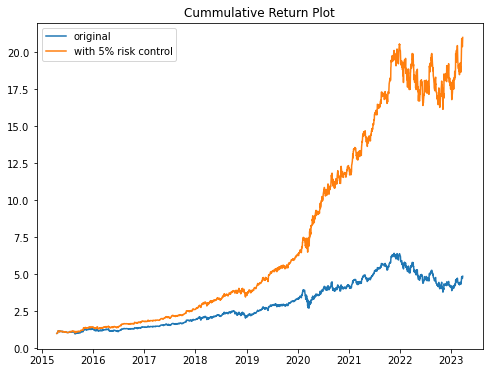

-------------------------------------------------------------------
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -2939.2773606257892
        x: [ 1.622e-01  1.452e-01  8.475e-01  3.809e-01]
      nit: 29
      jac: [-2.456e+00  3.298e+00 -5.093e+00  1.575e+01]
     nfev: 340
     njev: 68
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
Final loss: 0.16266652114487729
Time taken(s): 3.62
igarch mle 0.05 XOM


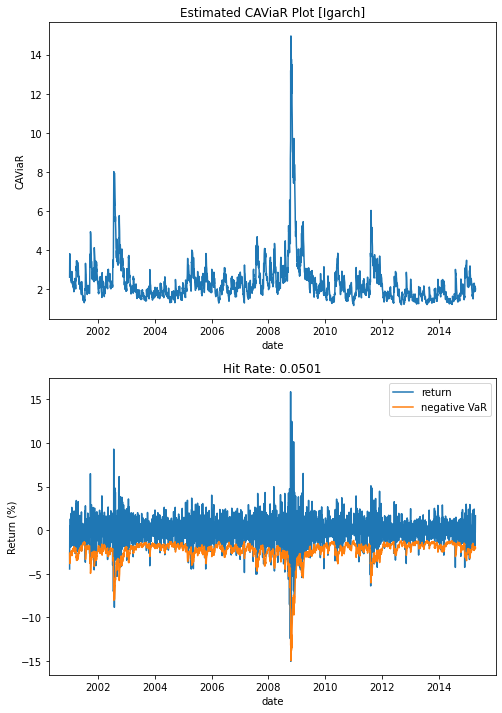

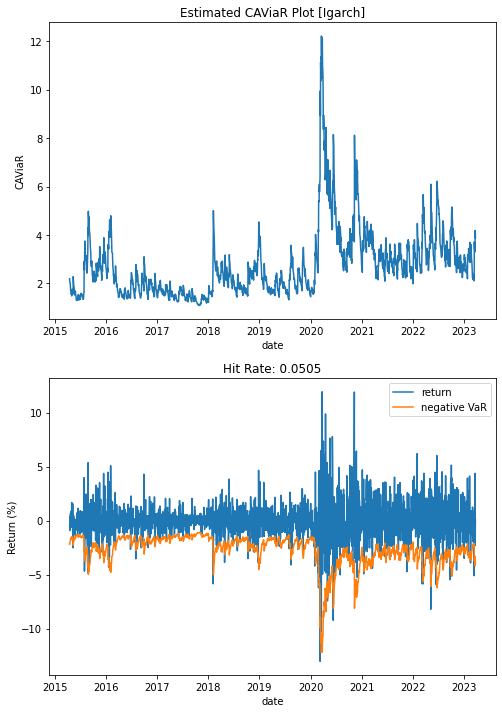

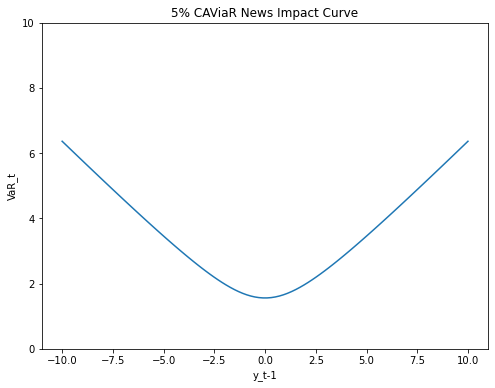

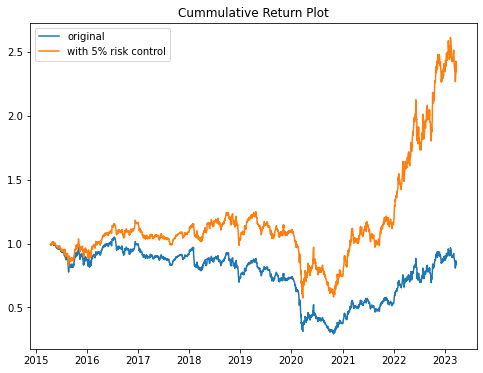

-------------------------------------------------------------------


In [9]:
for md in models:
    for mt in methods:
        for q in quantiles:
            for tick in tickers:
                # fitting process
                caviar_model = CaviarModel(q, model=md, method=mt)
                s = time()
                caviar_model.fit(in_samples[tick])

#                 # statistics for beta
#                 stat_df['Ticker'].append(tick)
#                 stat_df['Model'].append(md)
#                 stat_df['Method'].append(mt)
#                 stat_df['Quantile'].append(q)
#                 stat_df['Fitting time (s)'].append(time() - s)

#                 for i in range(1, len(caviar_model.beta)+1):
#                     stat_df[f'beta {i}'].append(caviar_model.beta[i-1])
#                     stat_df[f's.e. of beta {i}'].append(caviar_model.beta_standard_errors[i-1])
#                     stat_df[f'pval. of beta {i}'].append(caviar_model.beta_pvals[i-1])

#                 for j in range(i+1, 5):
#                     stat_df[f'beta {j}'].append(np.nan)
#                     stat_df[f's.e. of beta {j}'].append(np.nan)
#                     stat_df[f'pval. of beta {j}'].append(np.nan)

#                 stat_df['RQ loss (Train)'].append(caviar_model.obj(
#                     caviar_model.beta, in_samples[tick], q, caviar_model.caviar
#                 ))
#                 stat_df['RQ loss (Test)'].append(caviar_model.obj(
#                     caviar_model.beta, out_of_samples[tick], q, caviar_model.caviar
#                 ))
#                 stat_df['DQ test (Train)'].append(caviar_model.dq_test(in_samples[tick], 'in'))
#                 stat_df['DQ test (Test)'].append(caviar_model.dq_test(out_of_samples[tick], 'out'))

#                 in_vars = caviar_model.predict(in_samples[tick])
#                 out_vars = caviar_model.predict(out_of_samples[tick])
#                 stat_df['Hit (Train)'].append(np.sum(in_samples[tick]<in_vars)/len(in_vars))
#                 stat_df['Hit (Test)'].append(np.sum(out_of_samples[tick]<out_vars)/len(out_vars))

                print(md, mt, q, tick)

                # in sample
                caviar_model.plot_caviar(in_samples[tick])

                # out of sample
                caviar_model.plot_caviar(out_of_samples[tick])

                caviar_model.plot_news_impact_curve(VaR=-1.645)
                
                backtest(out_of_samples[tick]/100, caviar_model)

                print('-------------------------------------------------------------------')

In [10]:
# pd.DataFrame(stat_df).to_csv('log.csv')